In [2]:
from astropy.io import ascii
import glob
import matplotlib.pyplot as plt
import numpy as np
from scipy import asarray as ar, exp
from scipy.optimize import curve_fit, least_squares
import re
%matplotlib inline

snls_colors = {"sdssg":"darkgreen", "sdssi":"darkblue", "sdssr":"darkred", "sdssz":"purple"}
base_colors = {"sdssg":"green", "sdssi":"blue", "sdssr":"red", "sdssz":"magenta"}

import astropy.coordinates as coord
import astropy.units as u
import Utils.DiaSourceTools as DSTools

import sncosmo

Important functions 

In [3]:
def show_multi_filter_light_curve(t, colors, n_factor = None, conv='.'):
   
    t_by_filter = t.group_by("bandpass")

    indices = t_by_filter.groups.indices
    
    #print indices
    for i in range(0, len(indices)-1):
        
        data = t_by_filter[indices[i]:indices[i+1]]
        
        if n_factor is not None:
            value = n_factor[data[0]["bandpass"]]
            f = value if np.isnan(value) == False else 1
            plt.errorbar(data["mjd"], data["flux"]*f,yerr=data["flux_error"]*f, fmt=conv, markersize='5', label=data[0]["bandpass"], c=colors[data[0]["bandpass"]])            
        else:
            plt.errorbar(data["mjd"], data["flux"],yerr=data["flux_error"], fmt=conv, markersize='5', label=data[0]["bandpass"], c=colors[data[0]["bandpass"]])
    plt.legend()
    #plt.show()
    
def match_with_lc(snls_array, stack_lc):
    matches = []
    for lc in snls_array:
        #print "light curve"
        val = {"ra":lc[0]["ra"], "dec":lc[0]["dec"]}
        #print np.rad2deg(lc[0]["ra"]), np.rad2deg(lc[0]["dec"])
        for i, slc in enumerate(stack_lc):

            comp = {"ra":np.mean(slc["ra"]), "dec":np.mean(slc["dec"])}
            if DSTools.source_distance(val, comp)<1:
                print i
                matches.append((lc,slc))


    print len(matches)
    return matches

def mod_gauss(t, a, t0, tf, tr, b):
    return a*((exp(-(t-t0)/tf))/(1+exp(-(t-t0)/tr)))+b

def gauss(x, a, x0, sigma, b):
    return a*exp(-(x-x0)**2/(2*sigma**2))+b


def residuals(p, x, y):
    a, m, s, b = p
    y_fit = gauss(x, a, m, s, b)
    
    err = y - y_fit
    return err

def get_max_index(fluxes):
    max_val = 0
    max_index = -1
    for i, elem in enumerate(fluxes):
        
        if max_val<elem:
            max_val = elem
            max_index = i
            
    return max_index
    
def show_fit_mod_gaussians(t, colors, n_factor = None, plot=True):

    
    t_by_filter = t.group_by("bandpass")

    
    min_date = min(t["mjd"])
    max_date = max(t["mjd"])
    
     
    indices = t_by_filter.groups.indices
    max_i = get_max_index(t_by_filter["flux"])
    mean_date = t_by_filter[max_i]["mjd"]-min_date
    
  
    for i in range(0, len(indices)-1):

        data = t_by_filter[indices[i]:indices[i+1]]
        x = data["mjd"]-min_date
        y = data["flux"]
        
        n = len(x)
        sigma = np.std(y)
        
      
        popt, pcov = curve_fit(mod_gauss, x, y, p0=[1, mean_date, 2, 1, 0], maxfev=50000,  sigma = data["flux_error"])
        
        
        c = (y - mod_gauss(x, *popt))
        chi = (y - mod_gauss(x, *popt))/data["flux_error"]
    
        chi2 = (chi**2).sum()
        dof = len(x) - len(popt)

        #print len(x) - len(popt)
        #print (chi2 / (len(x)-len(popt)))
        if plot==True:
            plt.plot(x, y, 'b+', color=colors[data[0]["bandpass"]])

            X = np.arange(0,max_date-min_date,1)

            plt.plot(X, mod_gauss(X, *popt), color=colors[data[0]["bandpass"]])
        #print gauss(X, *popt)
        #plt.xlim(xmin=400, xmax=500)
        #plt.show()
        #plt.legend()
    #plt.show()
    return popt, pcov, chi2, dof


This method opens all the extracted Stack light curves

In [61]:
lienObj = glob.glob("/datadec/cppm/jpreyes/mpi_tests/multicolour_set/*.dat")
lcs = []
for oj in lienObj:
    table = ascii.read(oj)
    lcs.append(table)

With this piece of code, we filter light curves with at least 3 curves in the different bands

In [62]:
s_candidates= []
for lc in lcs:
    t_by_filter = lc.group_by("bandpass")

    indices = t_by_filter.groups.indices
    if len(indices)>=3:
        s_candidates.append(lc)

This also alow us to select only the candidates with at least N points.

In [63]:
res = None
for s in s_candidates:
    if len(s)>15:
        res = s

Opening the control data: SNLS curves

In [6]:
f = open('/renoir_data_02/jpreyes/lsst_data/sn_control/J_A+A_523_A7_table9.dat.txt','r')
data_elems = f.read()
elems = re.findall('^(.*?D3.*?)\\|(.*?)\\|', data_elems, re.MULTILINE)
f.close()

f = open('/renoir_data_02/jpreyes/lsst_data/sn_control/J_A+A_523_A7_table10.dat.txt','r')
data = f.read()
f.close()


Extracting and building the sncosmo tables from the SNLS data

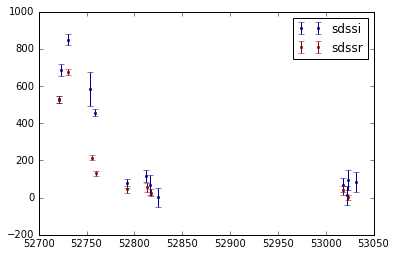

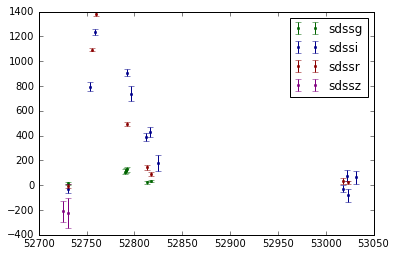

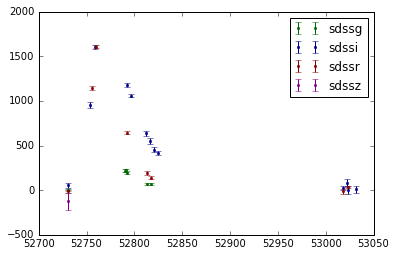

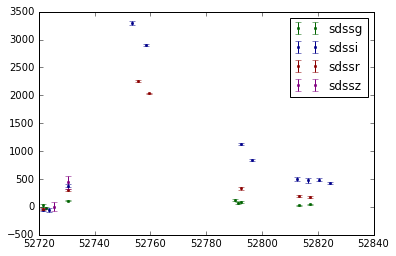

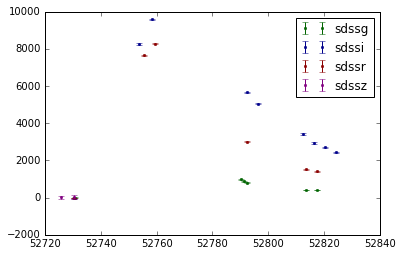

...

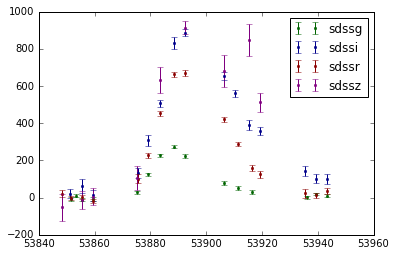

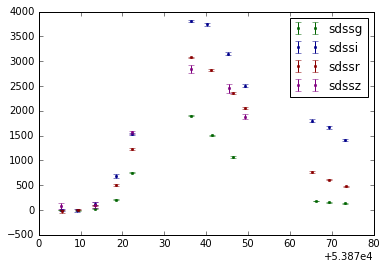

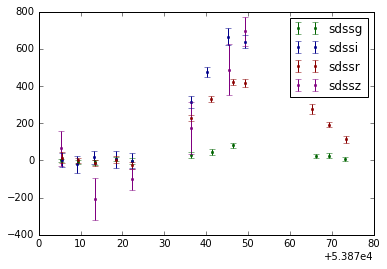

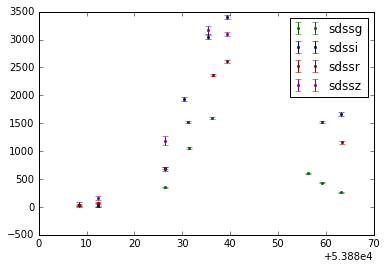

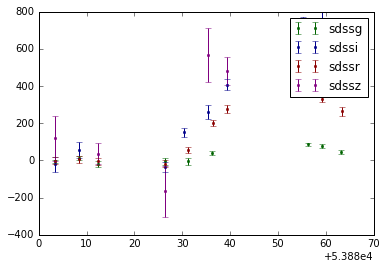

total of sn:83


In [7]:
snls_array = []
for sn in elems:

        c = coord.SkyCoord(sn[-1], unit=(u.hourangle, u.deg))

        m = re.findall('^'+str(sn[0])+'\\|(r|g|z|i)\\|(.*?)\\|(.*?)\\|(.*?)$', data, re.MULTILINE)

        snls_lc = DSTools.build_light_curve_from_snls_file(m, c)

        if len(m)>0:
            #print sn[0], c.ra.deg, c.dec.deg

            #plt.errorbar(snls_lc['mjd'], snls_lc['flux'], yerr=snls_lc['flux_error'], fmt='.', color='blue')
            show_multi_filter_light_curve(snls_lc, snls_colors)
            plt.show()
            snls_array.append(snls_lc)

print("total of sn:" + str(len(snls_array)))


Matching the SNLS with Stack. Indexes are the matched curves

In [121]:
matches_sc = match_with_lc(snls_array, s_candidates)

41621
33218
39979
4614
32534
41285
51207
11598
9449
14546
30854
24411
50072
38204
21642
44053
15057
16502
16603
16868
47667
36450
8186
30434
35702
27635
1912
45674
39072
8199
32302
34242
27933
25340
23693
27747
27769
6845
16114
22911
50431
7426
45985
791
25300
35487
19303
39984
13369
23460
6020
50501
26713
33667
13351
15552
36261
36128
32008
3291
42348
39357
25607
13973
5198
16436
47300
12107
24824
29032
23947
39911
26438
9659
17376
21861
76


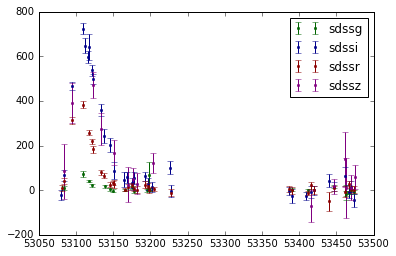

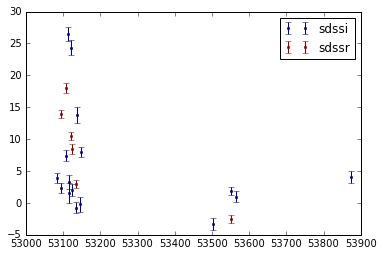

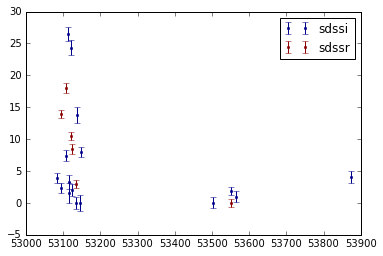

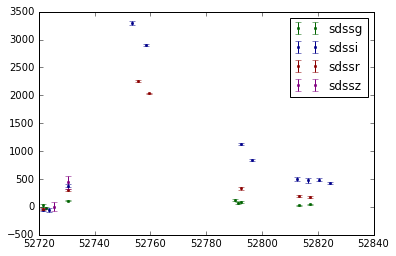

In [9]:
s = snls_array[10]
data = sncosmo.load_example_data()
model = sncosmo.Model(source='salt2')
res, fitted_model = sncosmo.fit_lc(s, model, ['z', 't0', 'x0', 'x1', 'c'],  bounds={'z':(0.3, 0.9)})

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:160: RuntimeWarning: Dropping following bands from data: sdssg(out of model wavelength range)
  "(out of model wavelength range)", RuntimeWarning)


We extract the $\chi^2$ using the SALT2 fitting for all the control curves

In [135]:
snls_array_ri = copy.deepcopy(snls_array)

In [152]:

for i, t1 in enumerate(snls_array_ri):
    
    tb1 = t1["bandpass"]=="sdssr"
    tb2 = t1["bandpass"]=="sdssi"
    snls_array_ri[i] = t1[tb1 | tb2]

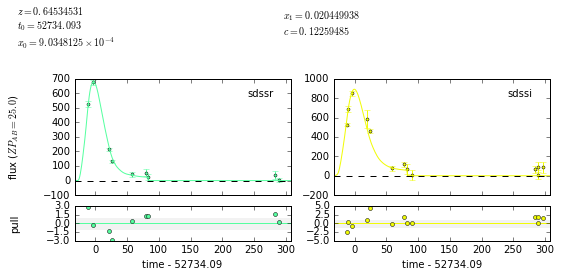

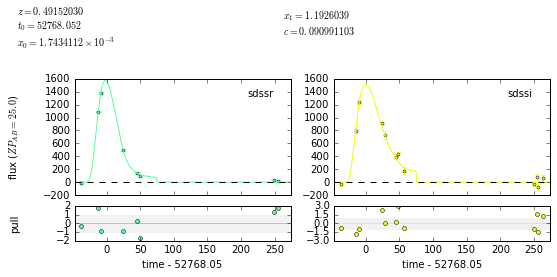

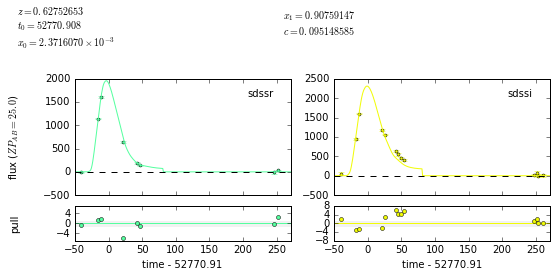

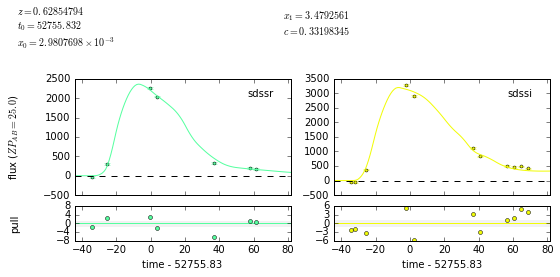

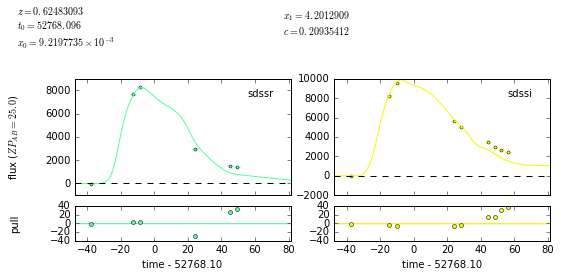

...

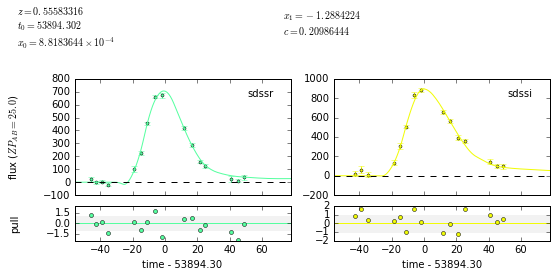

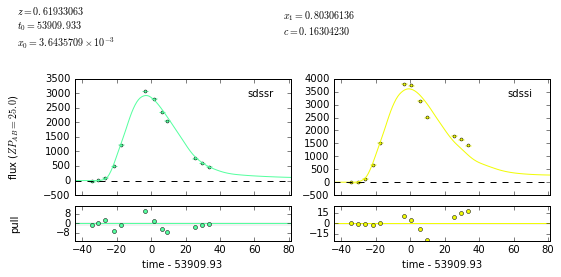

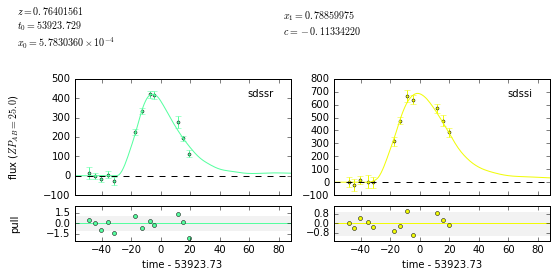

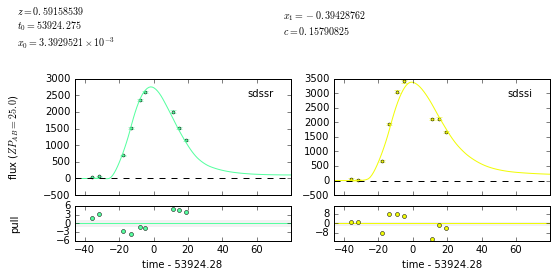

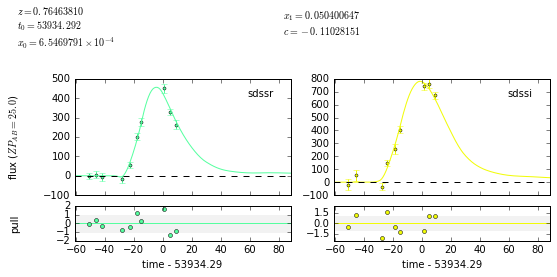

In [159]:
f_models = []
chi_sqrds = []
errors = 0
for s in snls_array_ri:
    try:
        data = sncosmo.load_example_data()
        model = sncosmo.Model(source='salt2')
        res, fitted_model = sncosmo.fit_lc(s, model, ['z', 't0', 'x0', 'x1', 'c'],  bounds={'z':(0.3, 0.9)})
        sncosmo.plot_lc(s, model=fitted_model)
        plt.show()
        df = res.ndof  # number of degrees of freedom in fit
        chisq = res.chisq
        f_models.append(fitted_model)
        chi_sqrds.append(chisq/df)
    except Exception as e:
        errors+=1
        continue

In [160]:
print len(chi_sqrds)

82


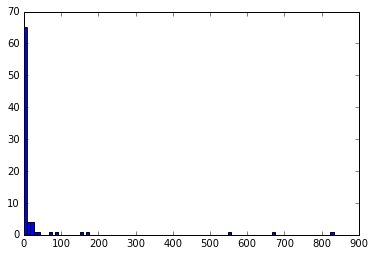

(65, ' of ', 82)


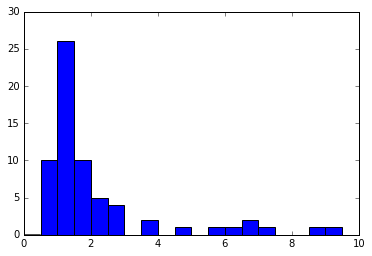

In [162]:
plt.hist(chi_sqrds, bins=100)
plt.show()


a = np.array(chi_sqrds)
b = a[a < 10]
plt.hist(b, bins=20, range=(0,10))
print(len(b), " of ",len(chi_sqrds))

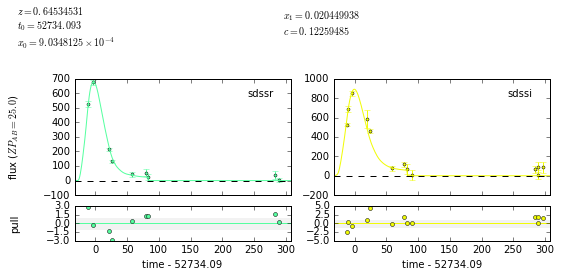

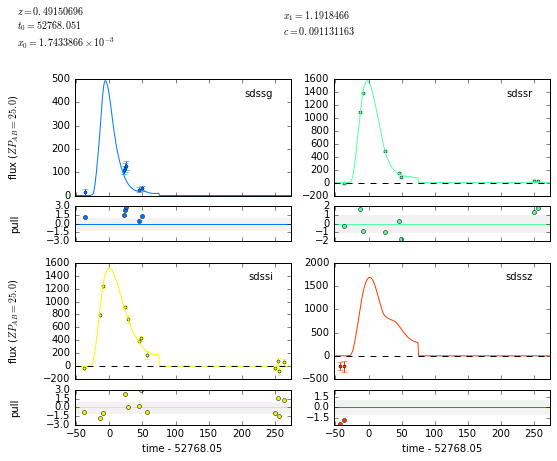

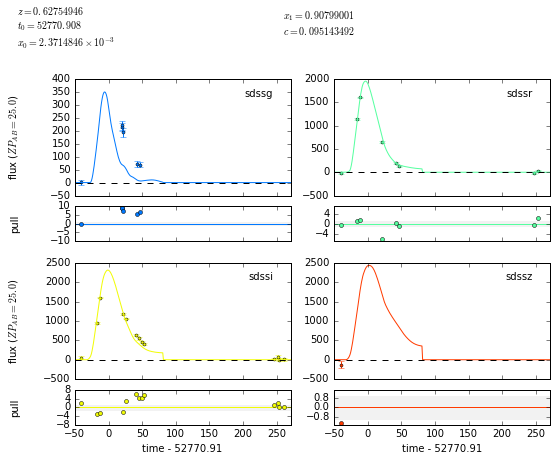

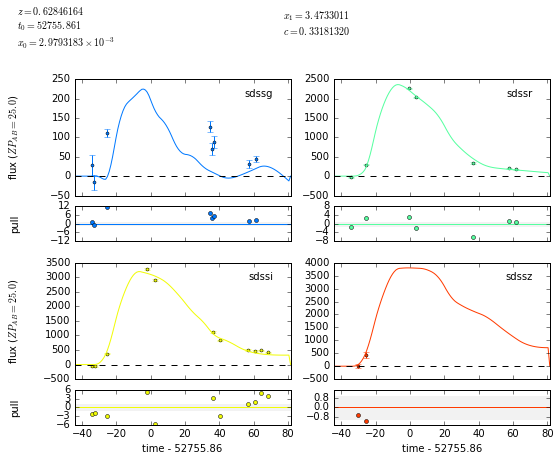

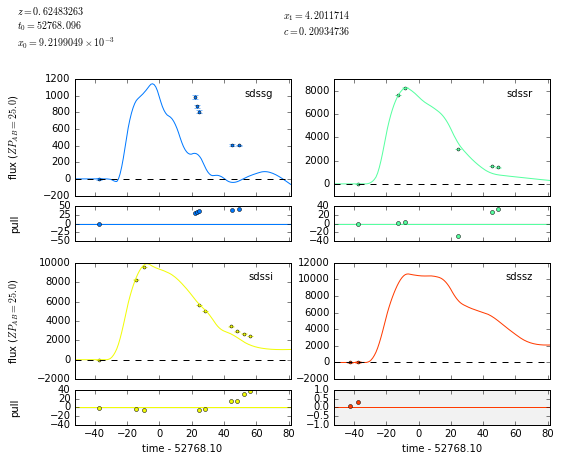

...

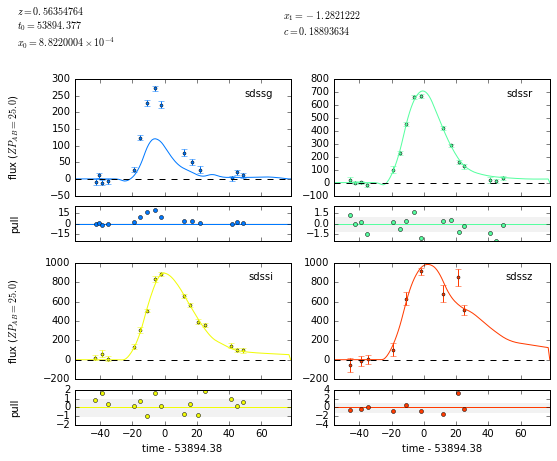

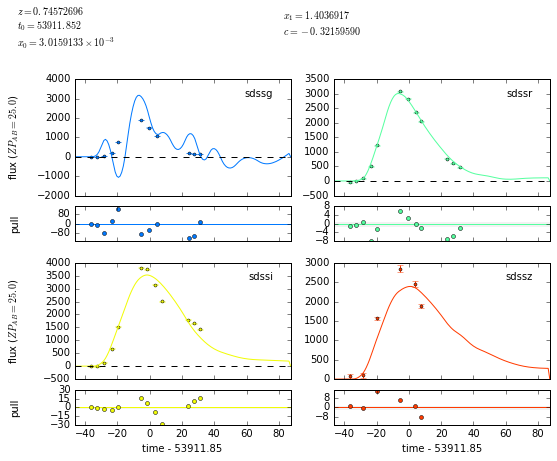

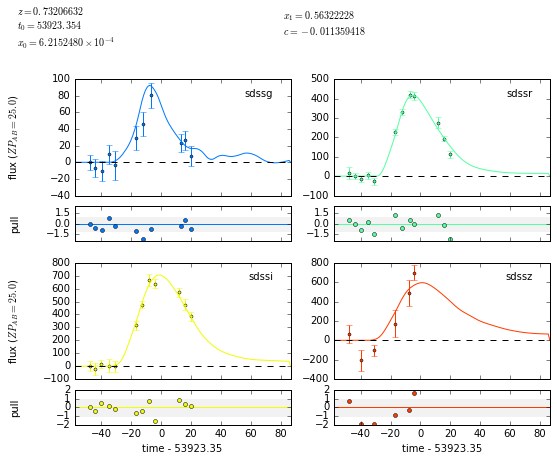

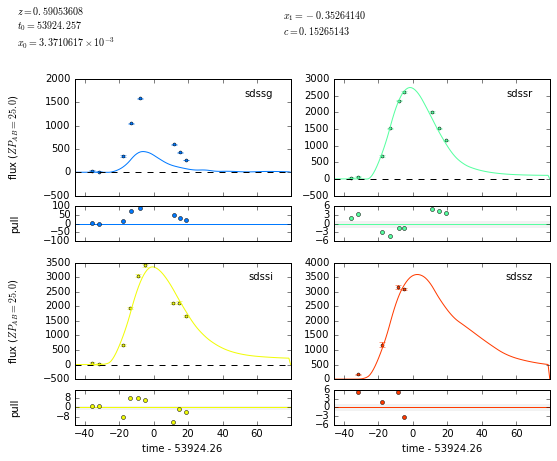

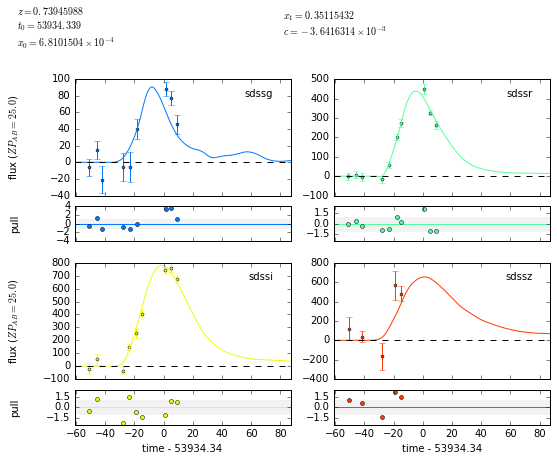

In [163]:
f_models = []
chi_sqrds = []
for s in snls_array:
    data = sncosmo.load_example_data()
    model = sncosmo.Model(source='salt2')
    res, fitted_model = sncosmo.fit_lc(s, model, ['z', 't0', 'x0', 'x1', 'c'],  bounds={'z':(0.3, 0.9)})
    sncosmo.plot_lc(s, model=fitted_model)
    plt.show()
    df = res.ndof  # number of degrees of freedom in fit
    chisq = res.chisq
    f_models.append(fitted_model)
    chi_sqrds.append(chisq/df)

Plotting all $\chi^2$ values

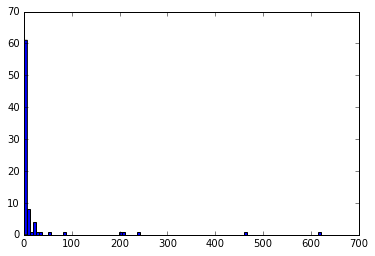

(66, ' of ', 83)


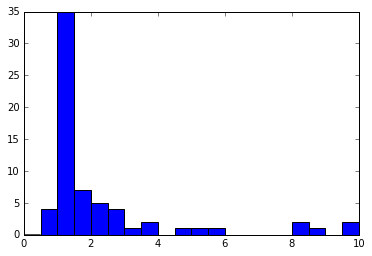

In [165]:
plt.hist(chi_sqrds, bins=100)
plt.show()


a = np.array(chi_sqrds)
b = a[a < 10]
plt.hist(b, bins=20, range=(0,10))
print(len(b), " of ",len(chi_sqrds))

In [15]:
def skewed_gaussian_chi(lc):
    lc_c = []

    mask = lc["bandpass"] == "sdssi"
    lc_c.append(lc[mask])

    mask = lc["bandpass"] == "sdssg"
    lc_c.append(lc[mask])

    mask = lc["bandpass"] == "sdssz"
    lc_c.append(lc[mask])

    mask = lc["bandpass"] == "sdssr"
    lc_c.append(lc[mask])
    
    chi_sqrds = []
    dofs = []
    
    for l in lc_c:
        
        if len(l) > 5:
            try:
                opt, pcov, chi, dof = show_fit_mod_gaussians(l, snls_colors, plot=True)
                chi_sqrds.append(chi)
                dofs.append(dof)
            except Exception as e:
                print e
                chi_sqrds.append(10000)
                dofs.append(1)

      
        
    return np.sum(chi_sqrds)  / np.sum(dofs)
    

>>>>>>>>0


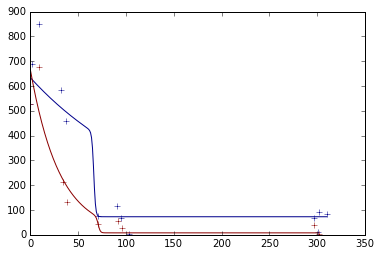

>>>>>>>>1


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: overflow encountered in exp
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in divide


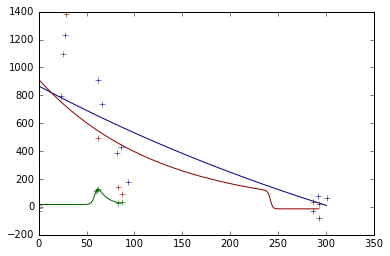

>>>>>>>>2


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/scipy/optimize/minpack.py:715: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


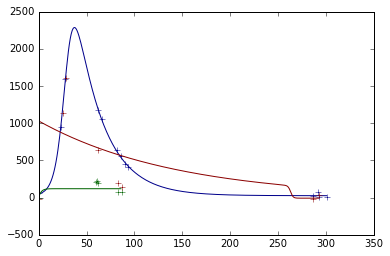

>>>>>>>>3


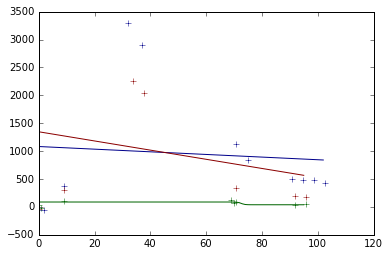

>>>>>>>>4


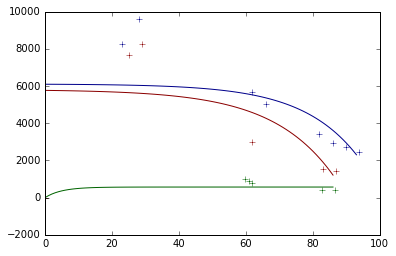

>>>>>>>>5
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


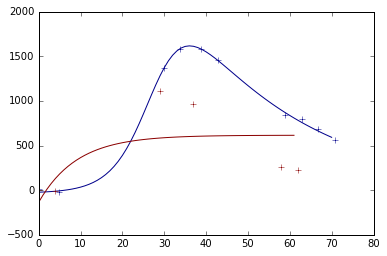

>>>>>>>>6
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


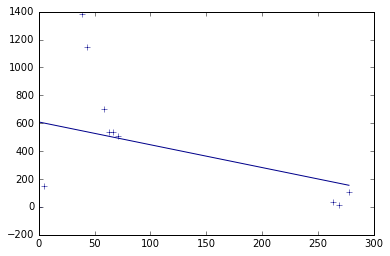

>>>>>>>>7


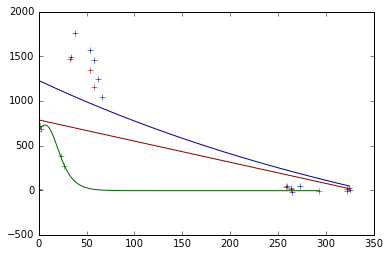

>>>>>>>>8


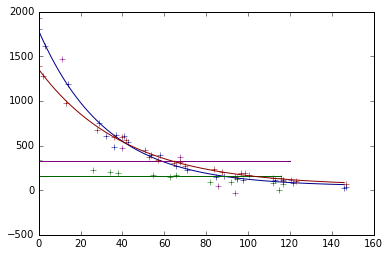

>>>>>>>>9


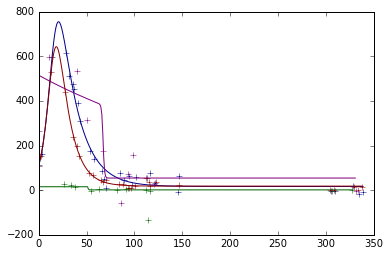

>>>>>>>>10


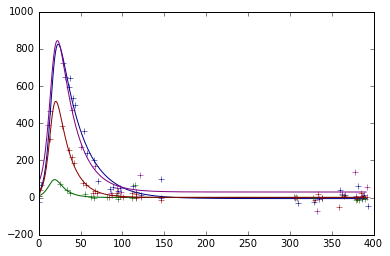

>>>>>>>>11


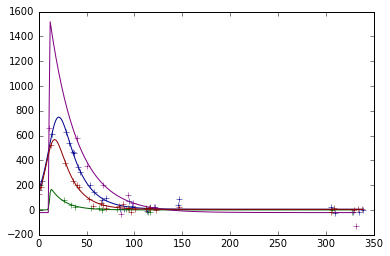

>>>>>>>>12


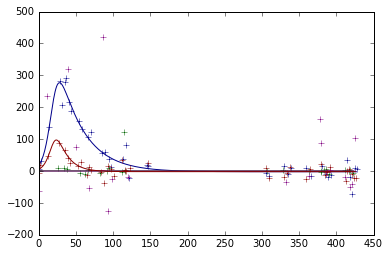

>>>>>>>>13


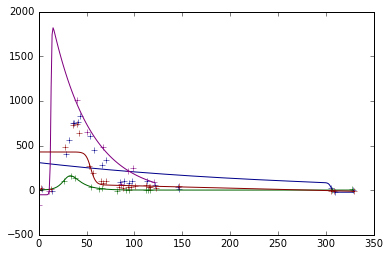

>>>>>>>>14


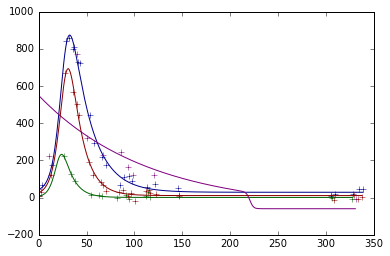

>>>>>>>>15


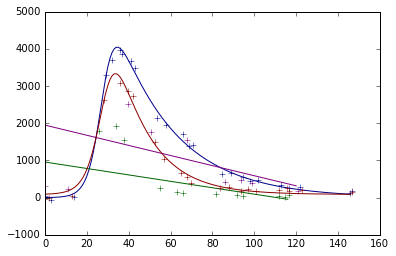

>>>>>>>>16


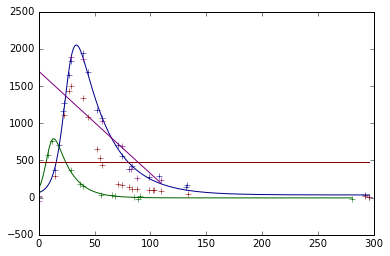

>>>>>>>>17
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


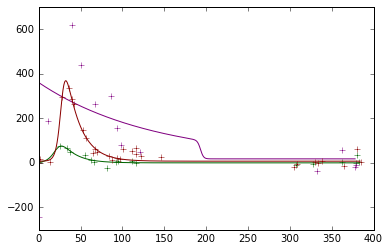

>>>>>>>>18


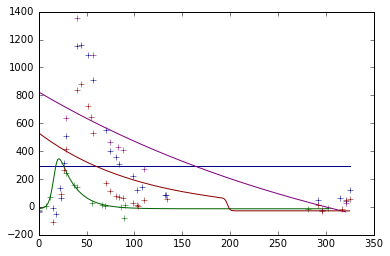

>>>>>>>>19
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


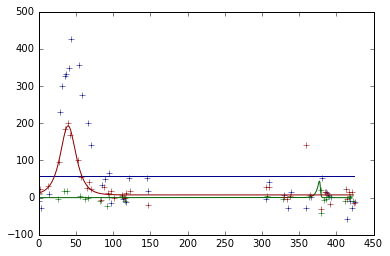

>>>>>>>>20


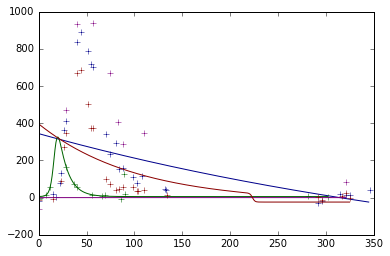

>>>>>>>>21


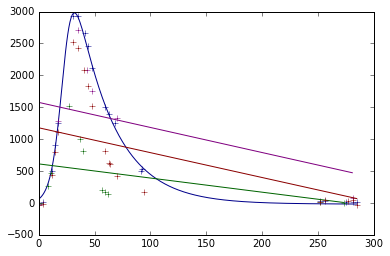

>>>>>>>>22


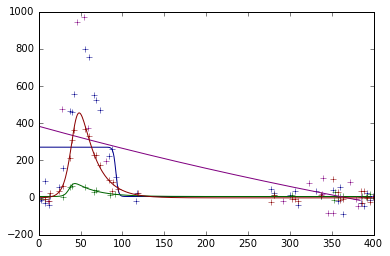

>>>>>>>>23


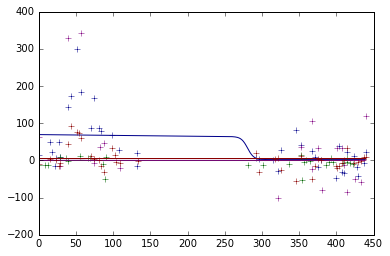

>>>>>>>>24


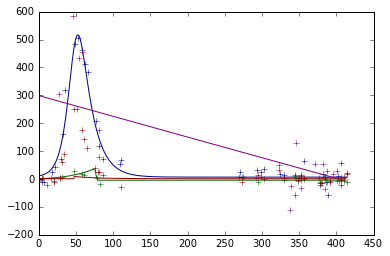

>>>>>>>>25


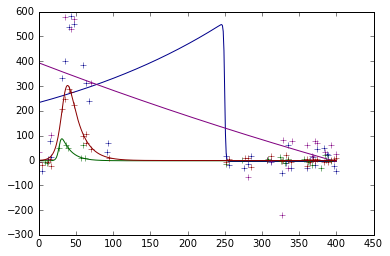

>>>>>>>>26
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


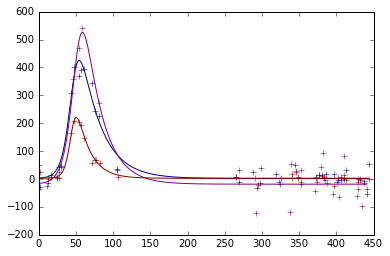

>>>>>>>>27


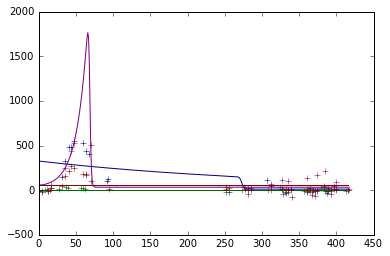

>>>>>>>>28


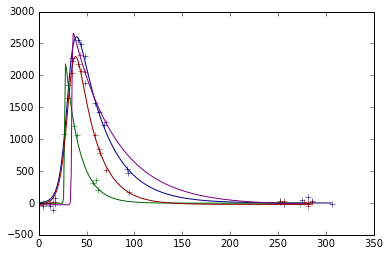

>>>>>>>>29


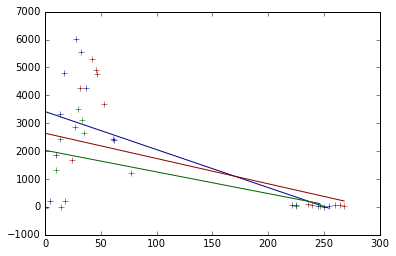

>>>>>>>>30


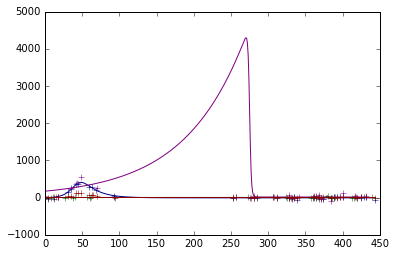

>>>>>>>>31


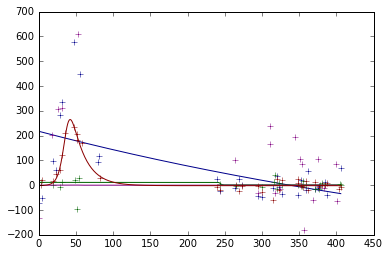

>>>>>>>>32


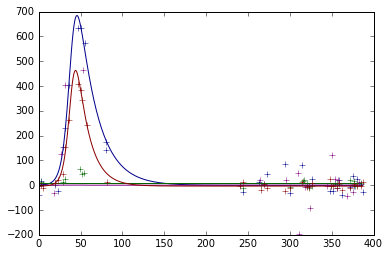

>>>>>>>>33


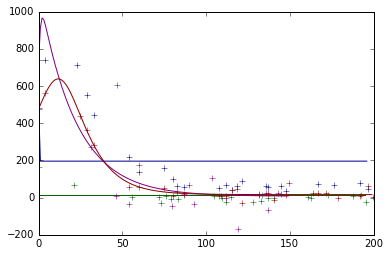

>>>>>>>>34


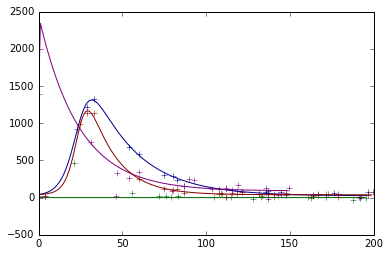

>>>>>>>>35


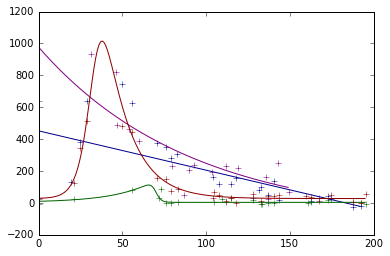

>>>>>>>>36


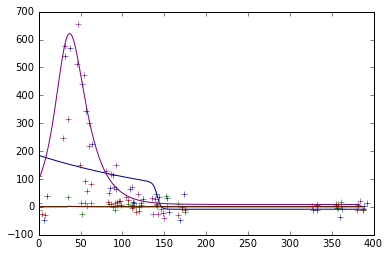

>>>>>>>>37


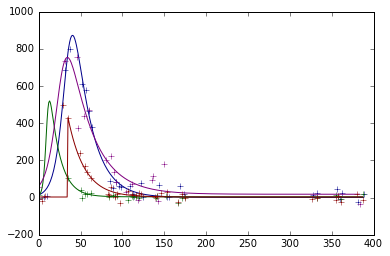

>>>>>>>>38
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


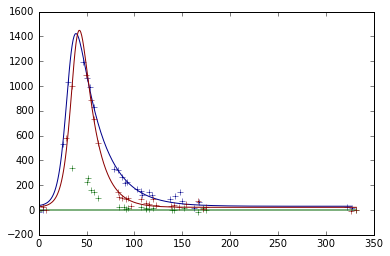

>>>>>>>>39


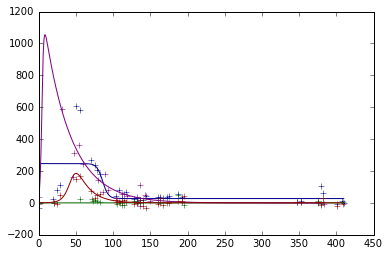

>>>>>>>>40


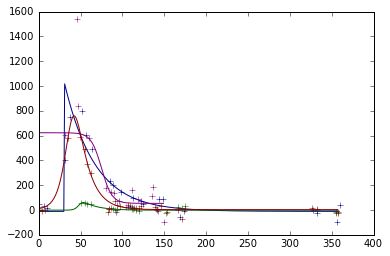

>>>>>>>>41


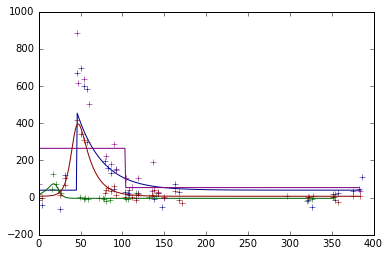

>>>>>>>>42


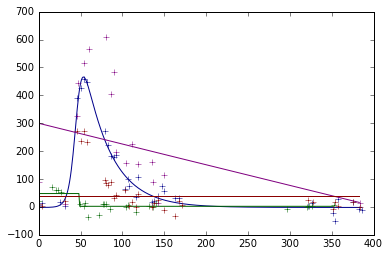

>>>>>>>>43


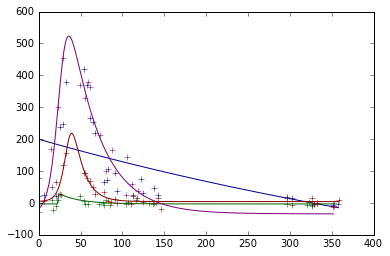

>>>>>>>>44


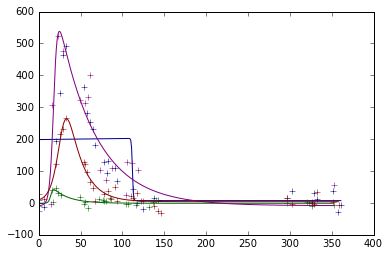

>>>>>>>>45
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


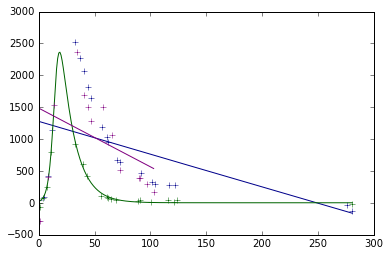

>>>>>>>>46
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


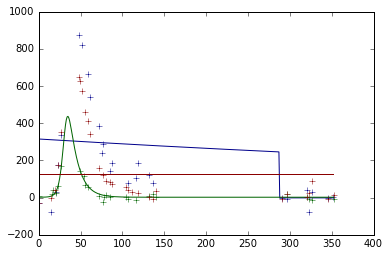

>>>>>>>>47
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


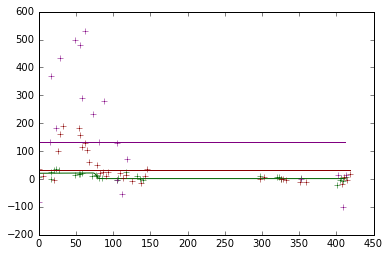

>>>>>>>>48


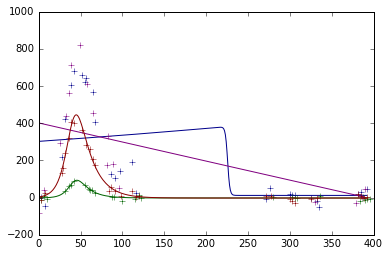

>>>>>>>>49


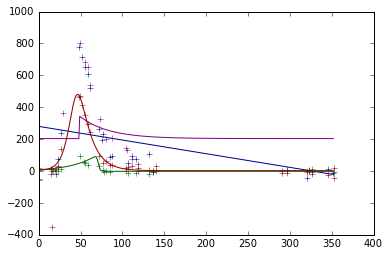

>>>>>>>>50


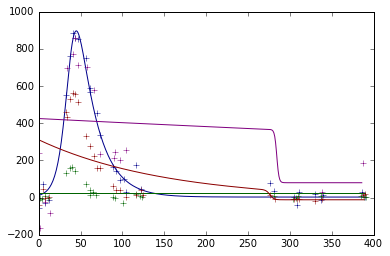

>>>>>>>>51
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


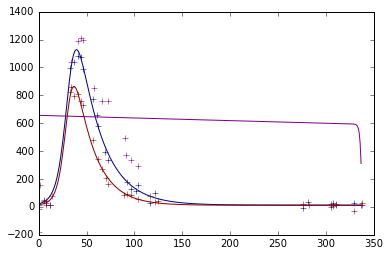

>>>>>>>>52
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


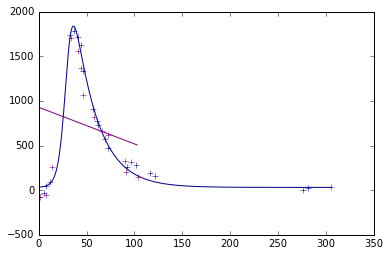

>>>>>>>>53


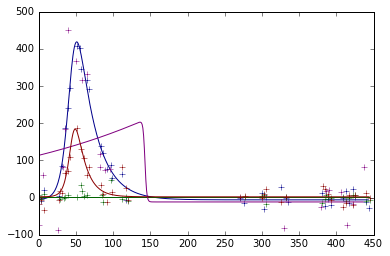

>>>>>>>>54


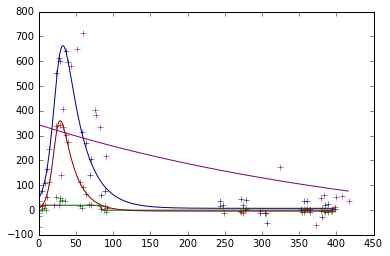

>>>>>>>>55


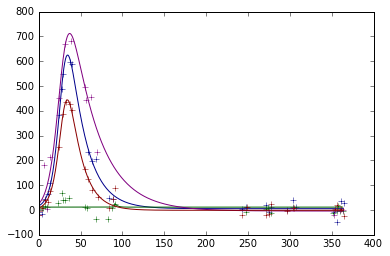

>>>>>>>>56
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


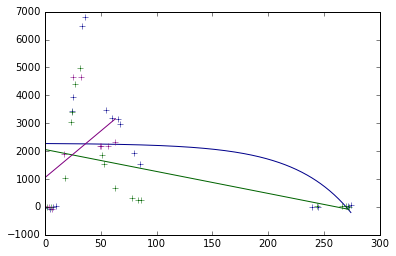

>>>>>>>>57


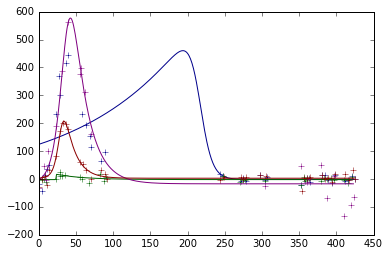

>>>>>>>>58


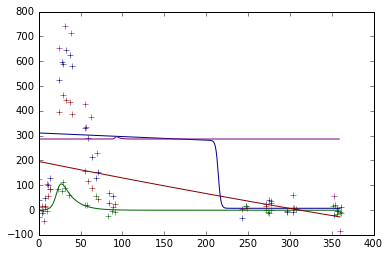

>>>>>>>>59
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


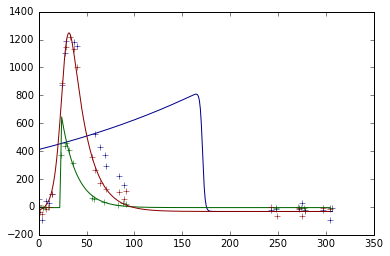

>>>>>>>>60


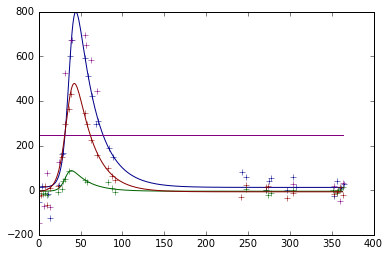

>>>>>>>>61


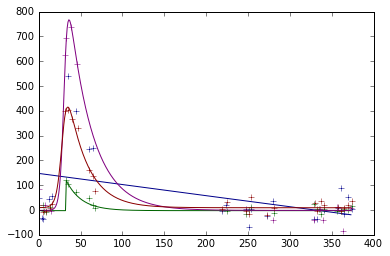

>>>>>>>>62


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: overflow encountered in multiply


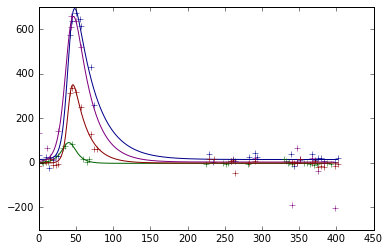

>>>>>>>>63


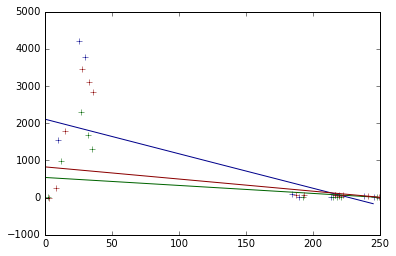

>>>>>>>>64


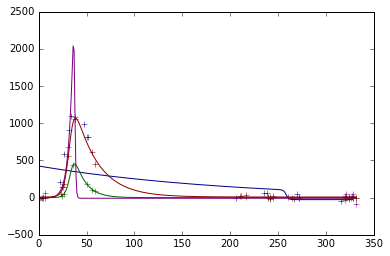

>>>>>>>>65


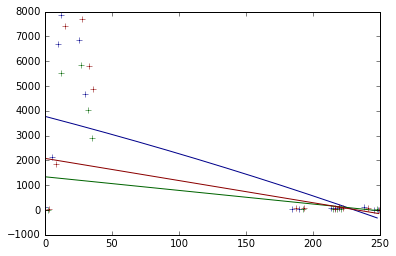

>>>>>>>>66


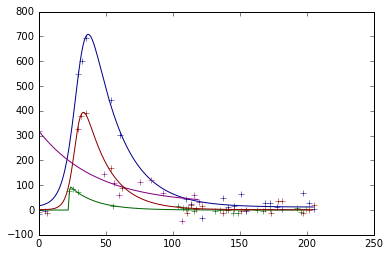

>>>>>>>>67


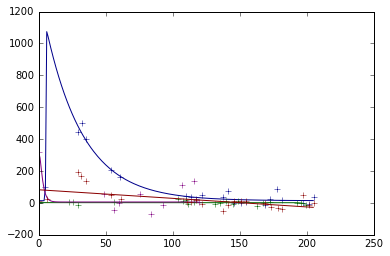

>>>>>>>>68
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


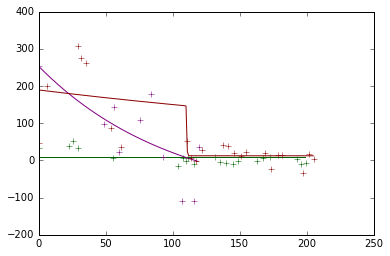

>>>>>>>>69


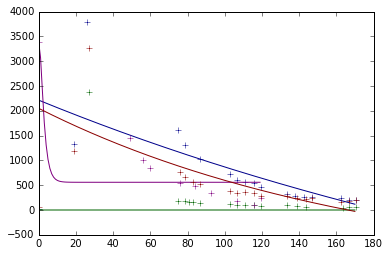

>>>>>>>>70
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


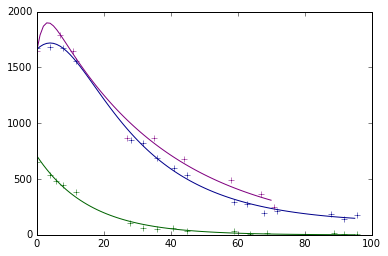

>>>>>>>>71


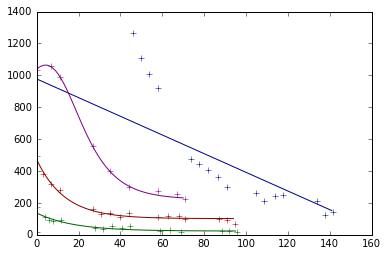

>>>>>>>>72


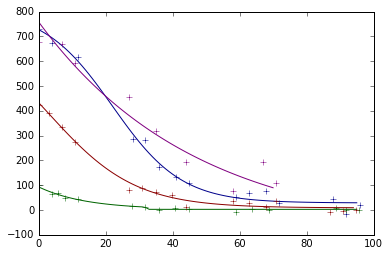

>>>>>>>>73
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


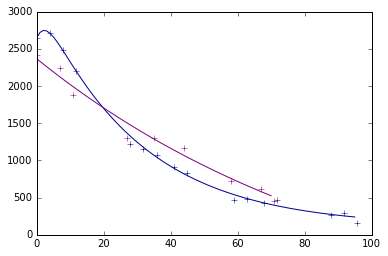

>>>>>>>>74
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


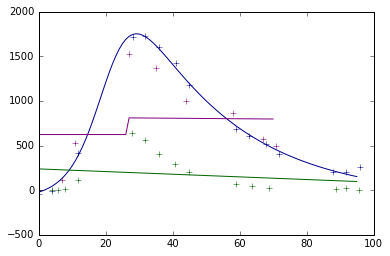

>>>>>>>>75


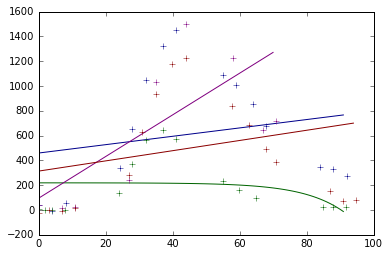

>>>>>>>>76


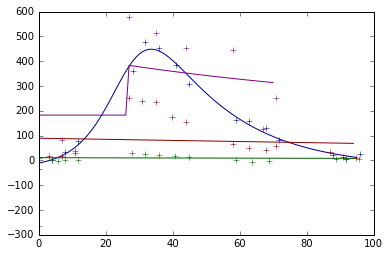

>>>>>>>>77


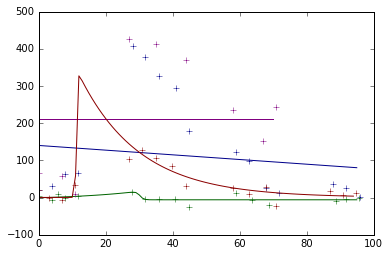

>>>>>>>>78


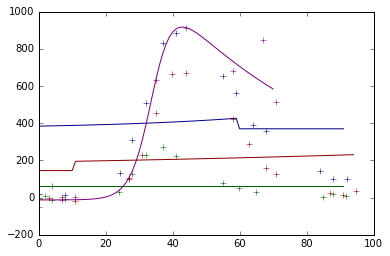

>>>>>>>>79


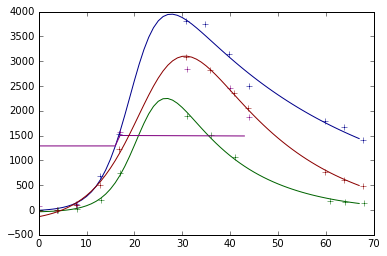

>>>>>>>>80
Optimal parameters not found: Number of calls to function has reached maxfev = 50000.


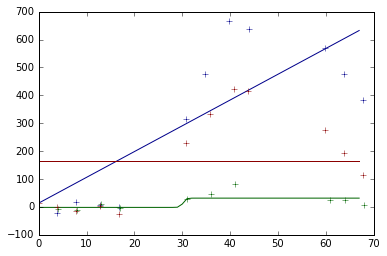

>>>>>>>>81


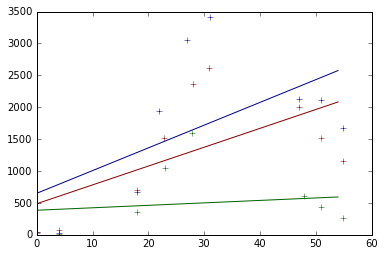

>>>>>>>>82


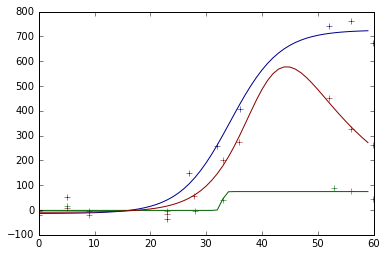

In [16]:
values = []
for i, lc in enumerate(snls_array):
    print ">>>>>>>>"+str(i)
    values.append(skewed_gaussian_chi(lc))
    plt.show()
    

In [17]:
values

[28.785596915387032,
 727.26971136519614,
 609.41397833726694,
 3103.926939463624,
 30496.240566777749,
 1853.8930261683797,
 1808.9089788099584,
 2107.3076630313158,
 18.426958066479155,
 1.0949566144971756,
 1.2801879778590595,
 1.2176391147091161,
 1.6256808955899393,
 159.26256911553651,
 3.0195443320084157,
 578.71343780934842,
 716.48683808866622,
 214.79934222538088,
 187.92746706952752,
 127.49918497619105,
 138.50444675423333,
 2870.5827300134438,
 12.646951436600913,
 3.6811396130888361,
 15.774604320887473,
 11.605677819119753,
 105.21810484685211,
 21.799994409532324,
 10.825757875605635,
 18352.127279480843,
 5.7932150655757919,
 7.2053048976065313,
 4.8429137852224402,
 27.052902020979069,
 57.248925882040531,
 10.278615218806822,
 23.148988047364362,
 2.6466293608942233,
 236.85783522276617,
 10.845471492726062,
 1.951617451664267,
 5.3973392527714266,
 9.7860558266414568,
 6.9682844605636092,
 7.1247353684209926,
 380.10377286552853,
 230.55932971237809,
 148.4459733819

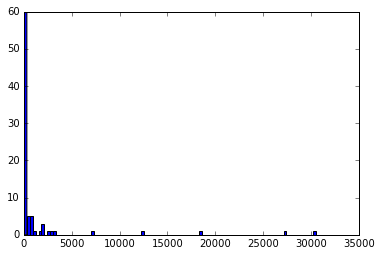

In [41]:
plt.hist(values, bins=100)
plt.show()

26


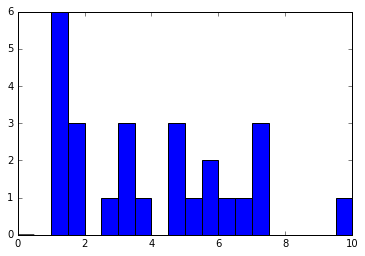

In [40]:
a = np.array(values)
b = a[a < 10]
plt.hist(b, range=(0,10), bins=20)
print(len(b))

In [20]:
for a, b in zip(chi_sqrds, values):
    print a, "----", b

3.75819561815 ---- 28.7855969154
2.90450838936 ---- 727.269711365
11.6054719105 ---- 609.413978337
13.9973550162 ---- 3103.92693946
460.957356248 ---- 30496.2405668
13.0596054966 ---- 1853.89302617
2.72001050158 ---- 1808.90897881
2.07949184351 ---- 2107.30766303
56.3133686264 ---- 18.4269580665
1.44423876986 ---- 1.0949566145
1.19571651316 ---- 1.28018797786
1.04686526799 ---- 1.21763911471
1.50498591855 ---- 1.62568089559
4.86689932087 ---- 159.262569116
2.32155630599 ---- 3.01954433201
23.4999690988 ---- 578.713437809
9.94660150163 ---- 716.486838089
1.13673634077 ---- 214.799342225
3.53121728597 ---- 187.92746707
1.3164241576 ---- 127.499184976
2.51387402691 ---- 138.504446754
20.9037936126 ---- 2870.58273001
1.37336768391 ---- 12.6469514366
1.30691726288 ---- 3.68113961309
1.40317604149 ---- 15.7746043209
1.14824888012 ---- 11.6056778191
1.03618911294 ---- 105.218104847
1.20717463354 ---- 21.7999944095
9.55826605593 ---- 10.8257578756
210.414398447 ---- 18352.1272795
1.00733956128

In [85]:
import copy
matches_sc_copy = copy.deepcopy(matches_sc)


In [129]:
results = []
snls_found = []
for a, b in matches_sc_copy:
    results.append(b)
    snls_found.append(a)

No data points with S/N > 5.0. Initial guessing failed.


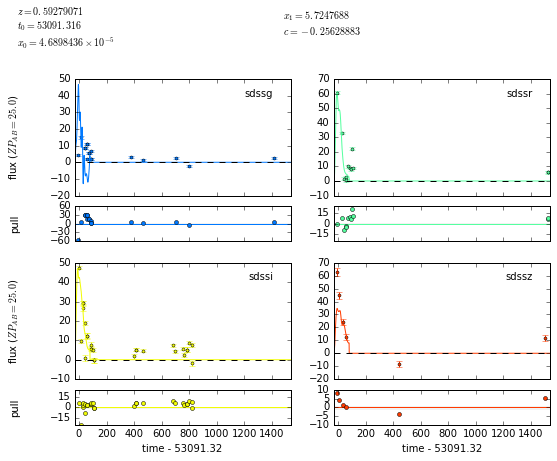

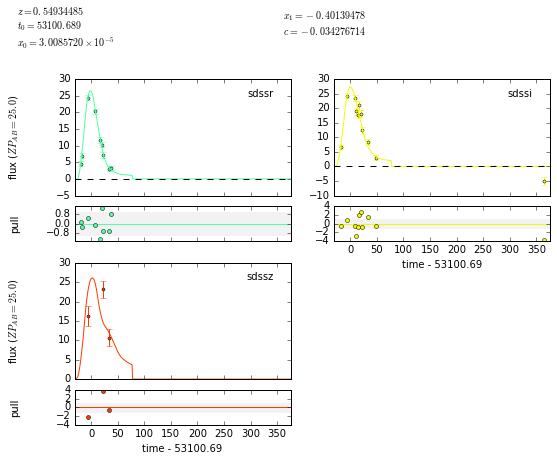

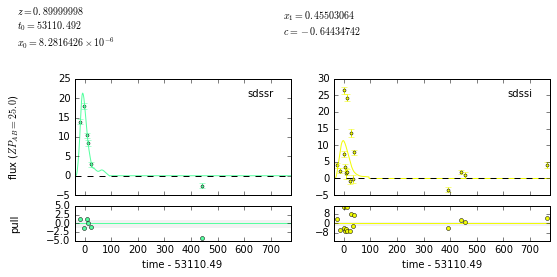

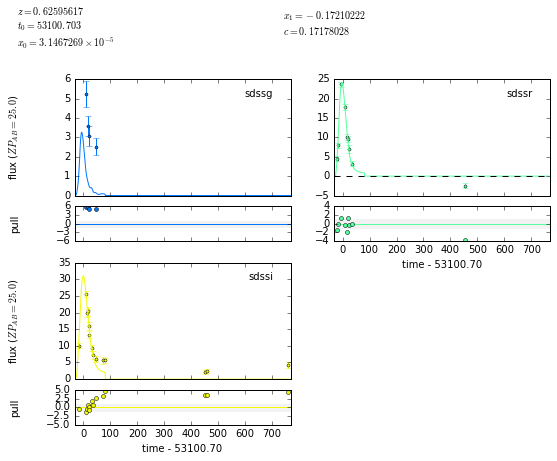

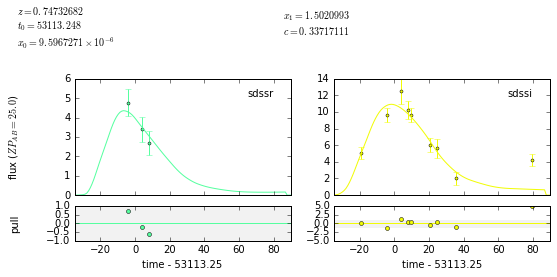

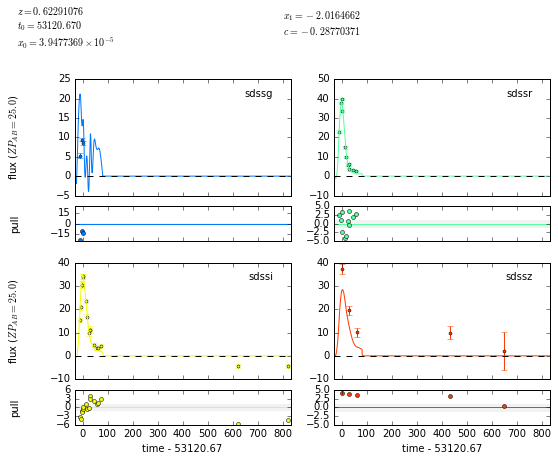

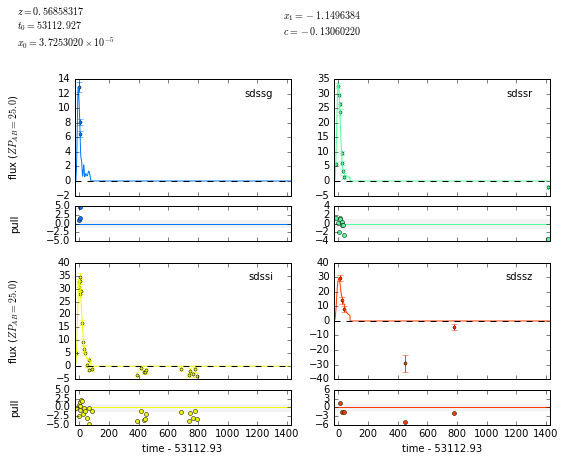

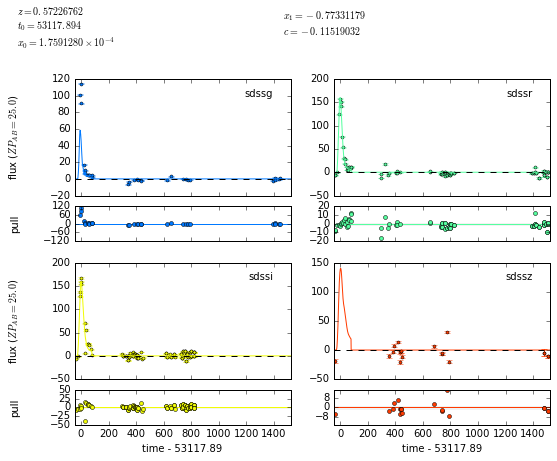

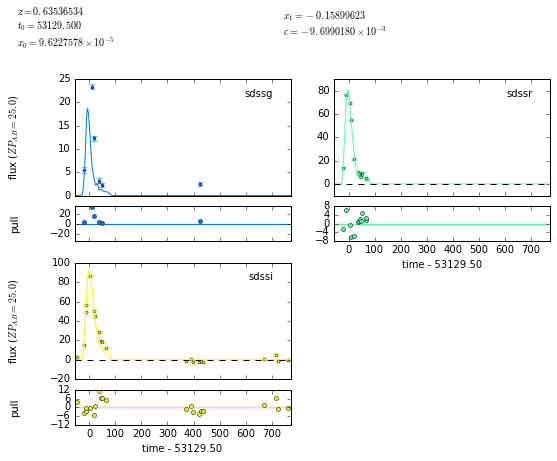

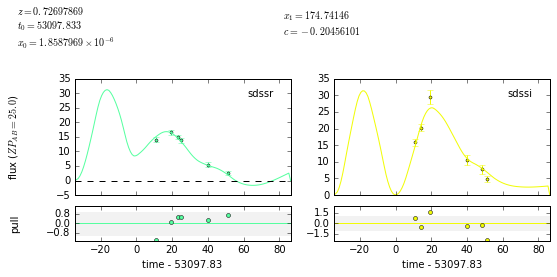

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/models.py:697: RuntimeWarning: overflow encountered in power
  10. ** (-0.4 * self._colorlaw(wave) * self._parameters[2]))
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/models.py:697: RuntimeWarning: invalid value encountered in multiply
  10. ** (-0.4 * self._colorlaw(wave) * self._parameters[2]))
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.336345
    t0 = +53284.347061
    x0 = +697835.952098
    x1 = +6.689185
     c = +380.975398

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.336345
    t0 = +53284.347061
    x0 = +697835.952098
    x1 = +6.689185
     c = +380.975398



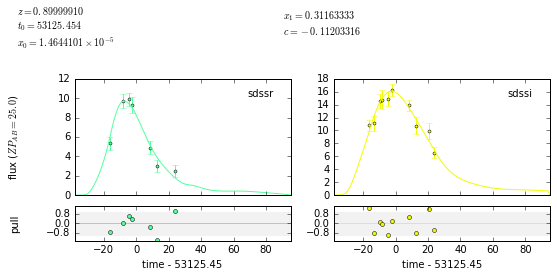

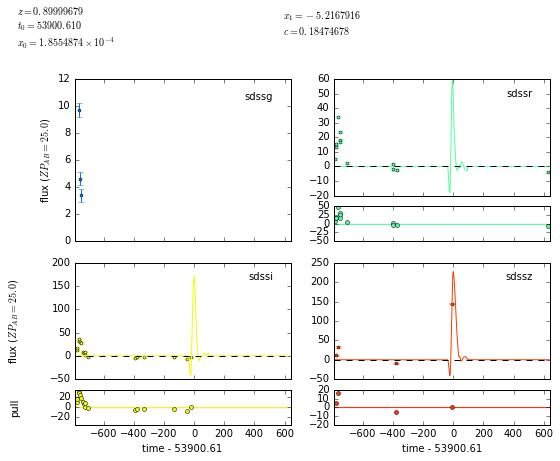

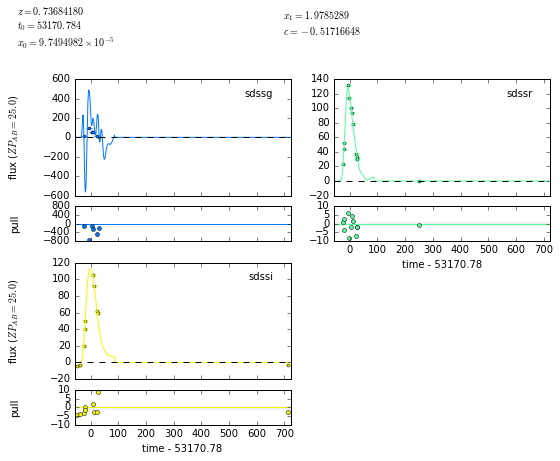

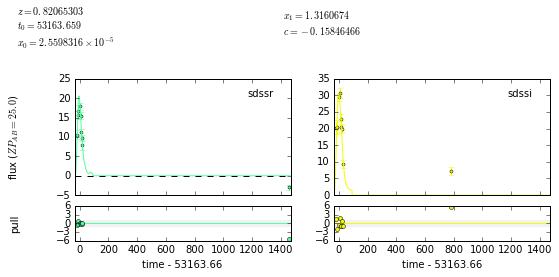

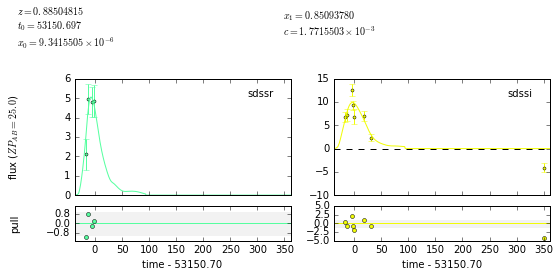

...

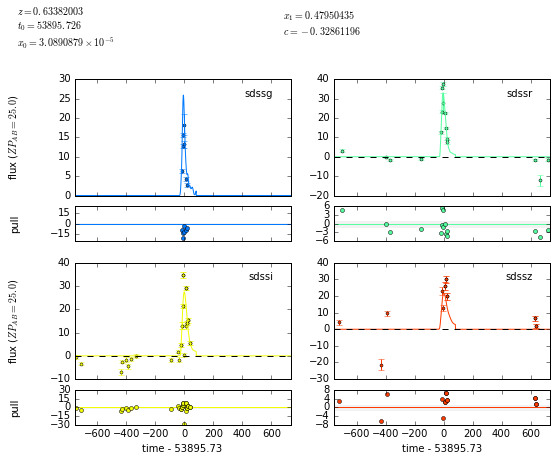

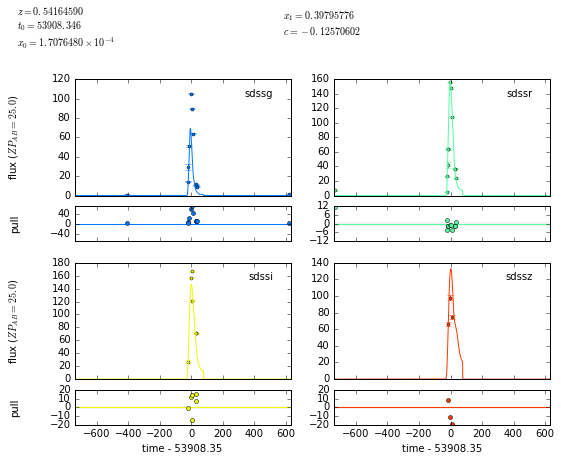

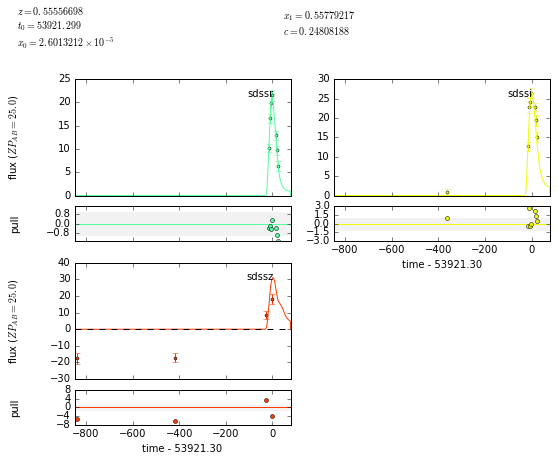

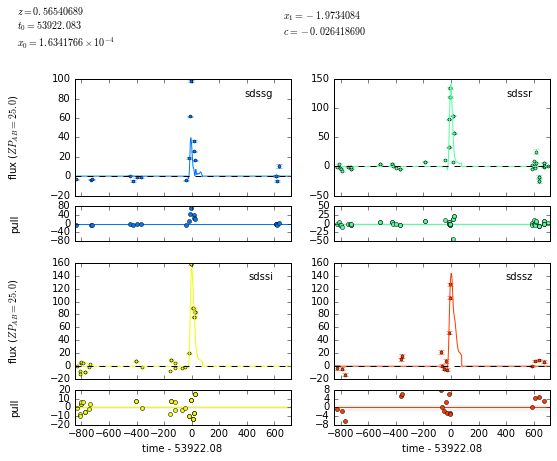

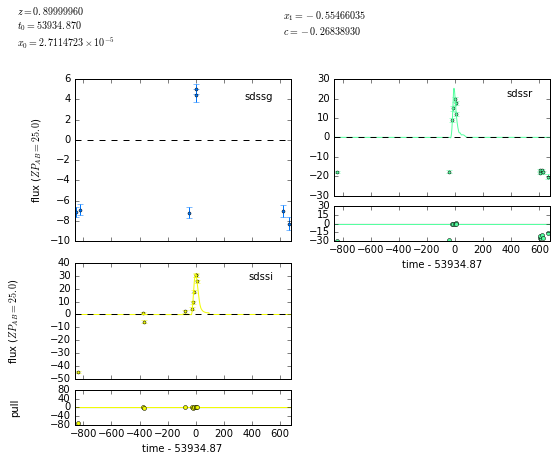

In [72]:
f_models = []
chi_sqrds = []
errors = 0
for s in results:
    data = sncosmo.load_example_data()
    model = sncosmo.Model(source='salt2')
    try:
        res, fitted_model = sncosmo.fit_lc(s, model, ['z', 't0', 'x0', 'x1', 'c'],  bounds={'z':(0.3, 0.9)})
        sncosmo.plot_lc(s, model=fitted_model)
        plt.show()
        df = res.ndof  # number of degrees of freedom in fit
        chisq = res.chisq
        f_models.append(fitted_model)
        chi_sqrds.append(chisq/df)
    except Exception as e:
        errors+=1
        print e
        continue

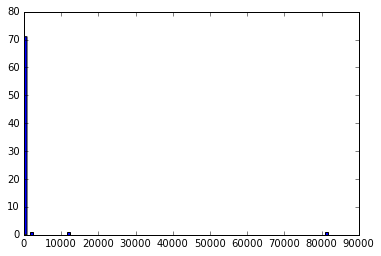

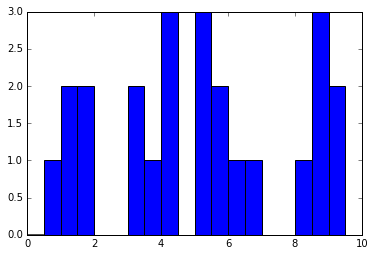

24


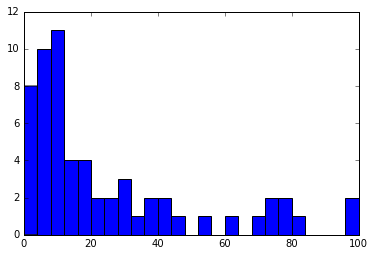

60


In [77]:
plt.hist(chi_sqrds, bins=100)
plt.show()


a = np.array(chi_sqrds)
b = a[a < 10]
plt.hist(b, bins=20, range=(0,10))
plt.show()
print(len(b))



a = np.array(chi_sqrds)
b = a[a < 100]
plt.hist(b, bins=25, range=(0,100))
plt.show()
print(len(b))

In [90]:
for r in results:
    for i, value in enumerate(r["flux"]):
        if value<0:
            r["flux"][i]=0


In [134]:
print snls_found[3]
results[3]

  mjd    zpsys   flux         ra      flux_error      dec        zp  bandpass
-------- ----- -------- ------------- ---------- -------------- ---- --------
53080.59    ab  -22.165 3.75419725783     22.991 0.921899200643 25.0    sdssi
 53081.6    ab   10.387 3.75419725783     13.419 0.921899200643 25.0    sdssr
53083.53    ab   65.775 3.75419725783     25.846 0.921899200643 25.0    sdssi
53083.58    ab   40.228 3.75419725783     13.359 0.921899200643 25.0    sdssr
 53083.6    ab    9.457 3.75419725783     7.9344 0.921899200643 25.0    sdssg
53083.63    ab   83.634 3.75419725783     124.72 0.921899200643 25.0    sdssz
53094.54    ab   465.78 3.75419725783     18.614 0.921899200643 25.0    sdssi
53094.59    ab   313.52 3.75419725783     15.005 0.921899200643 25.0    sdssr
53094.61    ab   389.07 3.75419725783     89.667 0.921899200643 25.0    sdssz
53109.49    ab   723.91 3.75419725783      25.95 0.921899200643 25.0    sdssi
     ...   ...      ...           ...        ...            ... 

mjd,classification,zpsys,flux,ra,flux_error,dec,zp,bandpass,magnitude,magnitude_error,ref_flux
float64,float64,str2,float64,float64,float64,float64,float64,str5,float64,float64,float64
53083.0,7.0,ab,3.93301510811,3.75419711887,0.766642987728,0.921896579124,25.0,sdssi,28.5131859633,0.211637134621,257.121154785
53094.0,0.0,ab,2.40106725693,3.75419211125,0.776756346226,0.921893086747,25.0,sdssi,29.0489891866,0.351240676387,257.121154785
53109.0,3.0,ab,7.41198635101,3.75419249416,0.913564324379,0.921893535965,25.0,sdssi,27.8251634727,0.133822408108,257.121154785
53112.0,7.0,ab,26.5513896942,3.75419870404,1.10717797279,0.921897540259,25.0,sdssi,26.4397818578,0.0452745872821,257.121154785
53116.0,0.0,ab,3.3338675499,3.75419234996,1.07544839382,0.92189302482,25.0,sdssi,28.6926291453,0.350239846078,257.121154785
53117.0,0.0,ab,1.53607666492,3.75419206375,1.60541939735,0.92189375079,25.0,sdssi,29.5339677708,1.13474932816,257.121154785
53121.0,7.0,ab,24.3675880432,3.75419868417,1.10367774963,0.921898216493,25.0,sdssi,26.5329686402,0.0491760977343,257.121154785
53123.0,3.0,ab,1.99787247181,3.7541919449,0.929859042168,0.921893339431,25.0,sdssi,29.2485805928,0.505328363871,257.121154785
53134.0,0.0,ab,0.0,3.75419218629,0.893771767616,0.921893450922,25.0,sdssi,nan,nan,257.121154785


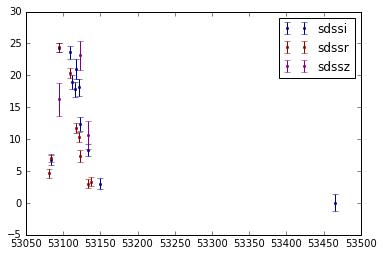

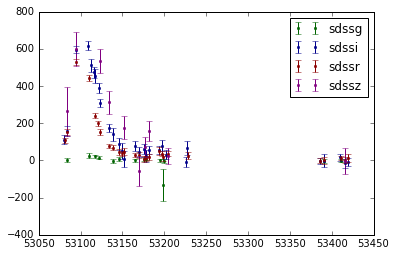

In [130]:
show_multi_filter_light_curve(results[2], snls_colors)
plt.show()
show_multi_filter_light_curve(snls_found[2], snls_colors)
plt.show()

No data points with S/N > 5.0. Initial guessing failed.


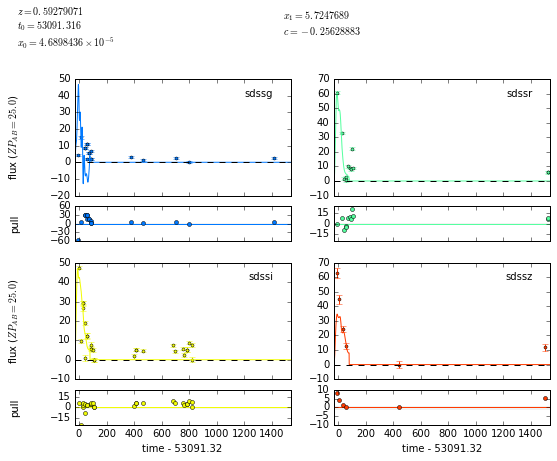

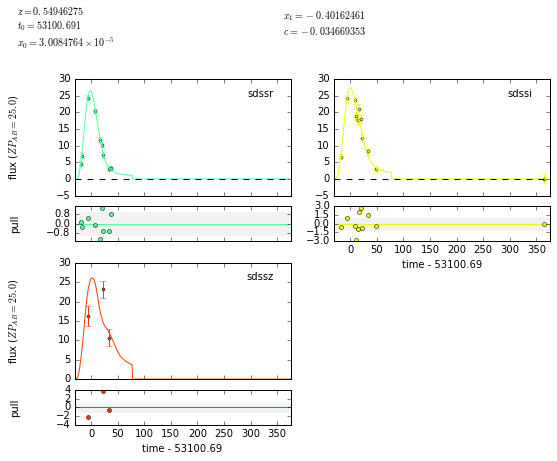

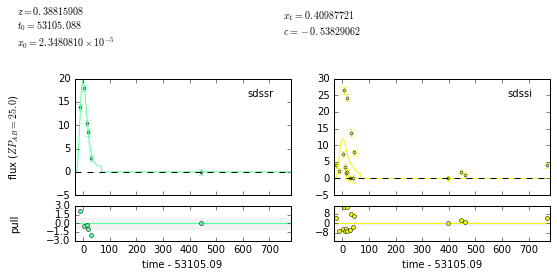

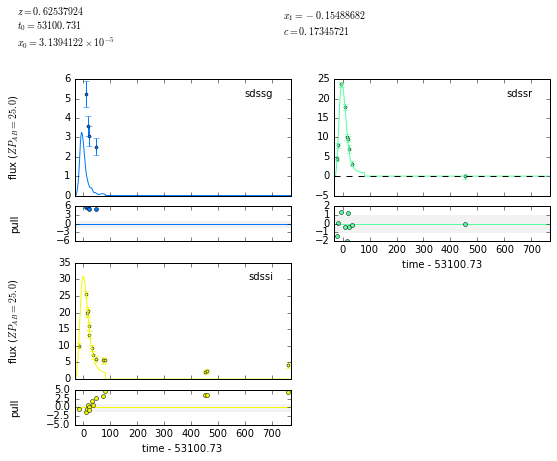

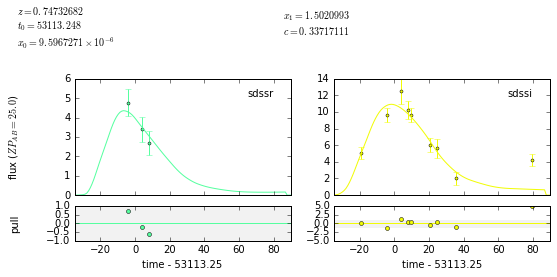

...

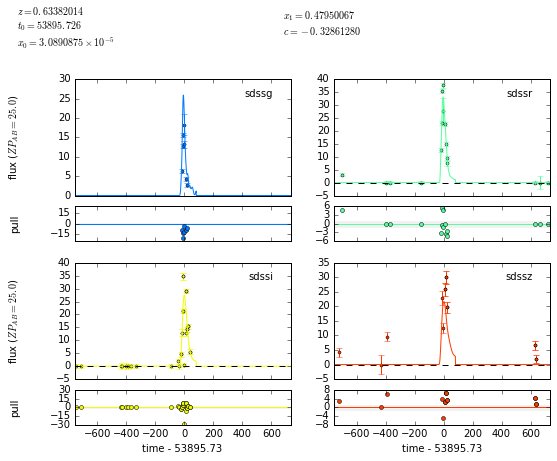

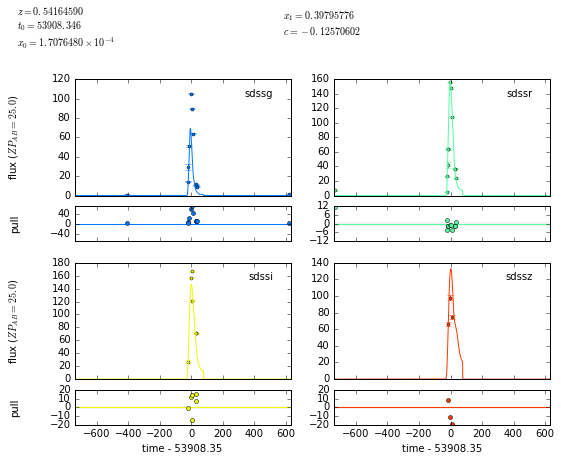

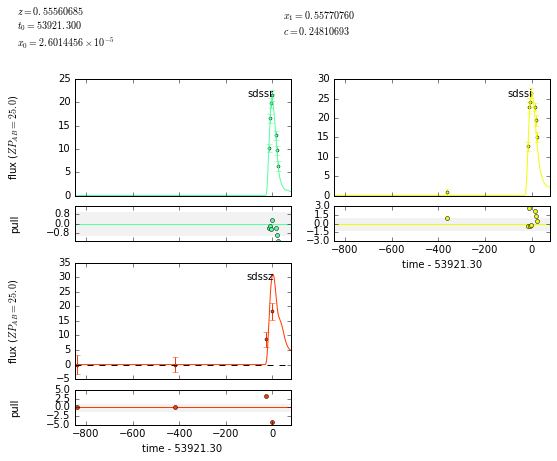

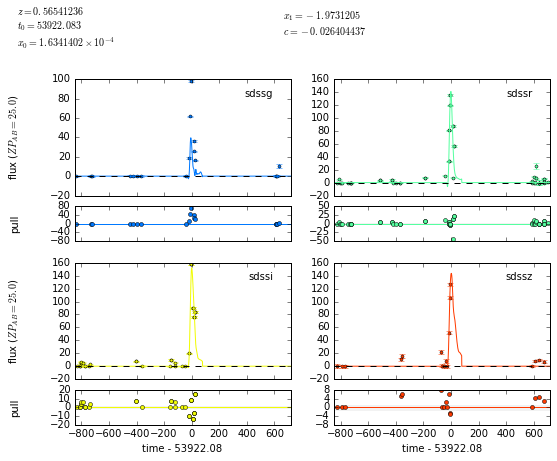

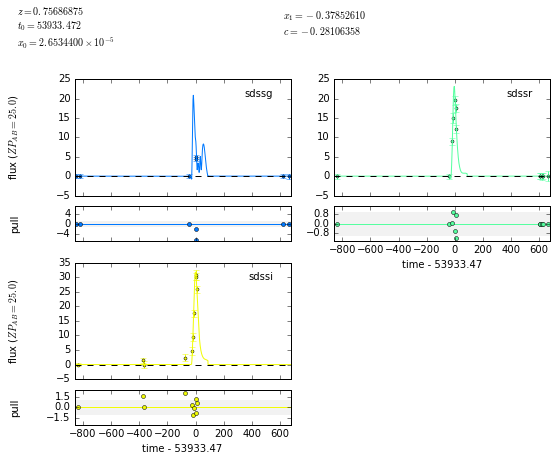

In [91]:
f_models = []
chi_sqrds = []
errors = 0
for s in results:
    data = sncosmo.load_example_data()
    model = sncosmo.Model(source='salt2')
    try:
        res, fitted_model = sncosmo.fit_lc(s, model, ['z', 't0', 'x0', 'x1', 'c'],  bounds={'z':(0.3, 0.9)})
        sncosmo.plot_lc(s, model=fitted_model)
        plt.show()
        df = res.ndof  # number of degrees of freedom in fit
        chisq = res.chisq
        f_models.append(fitted_model)
        chi_sqrds.append(chisq/df)
    except Exception as e:
        errors+=1
        print e
        continue

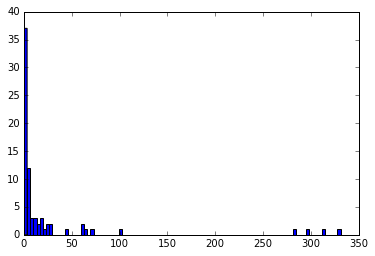

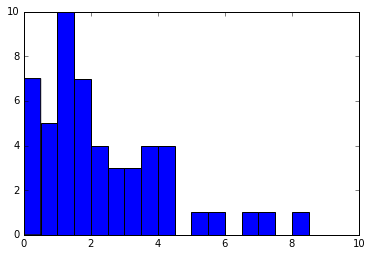

52


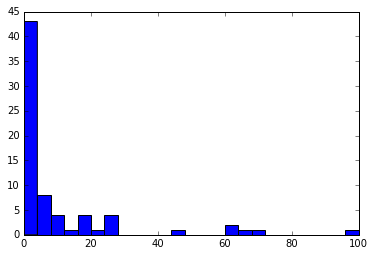

71


In [92]:
plt.hist(chi_sqrds, bins=100)
plt.show()


a = np.array(chi_sqrds)
b = a[a < 10]
plt.hist(b, bins=20, range=(0,10))
plt.show()
print(len(b))



a = np.array(chi_sqrds)
b = a[a < 100]
plt.hist(b, bins=25, range=(0,100))
plt.show()
print(len(b))

In [95]:
results[1]["flux"]+results[1]["ref_flux"]

889.514312744
871.471981049
851.038312912
839.301224709
826.64251709
838.390132904
642.100422025
646.813317776
641.22644043
642.940374494
646.418818474


In [1]:
candidates_copy = copy.deepcopy(s_candidates)

NameError: name 'copy' is not defined

In [98]:
for r in candidates_copy:
    for i, value in enumerate(r["flux"]):
        if value<0:
            r["flux"][i]=0

In [105]:
f_models_cand = []
chi_sqrds_cand = []
errors = 0
for s in candidates_copy:
    data = sncosmo.load_example_data()
    model = sncosmo.Model(source='salt2')
    try:
        res, fitted_model = sncosmo.fit_lc(s, model, ['z', 't0', 'x0', 'x1', 'c'],  bounds={'z':(0.3, 0.9)})
        #sncosmo.plot_lc(s, model=fitted_model)
        plt.show()
        df = res.ndof  # number of degrees of freedom in fit
        chisq = res.chisq
        f_models_cand.append(fitted_model)
        chi_sqrds_cand.append(chisq/df)
    except Exception as e:
        errors+=1
        print e
        continue

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.817037
    t0 = +53587.061204
    x0 = -448622.862456
    x1 = -37778.142239
     c = +137629.625532

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.817037
    t0 = +53587.061204
    x0 = -448622.862456
    x1 = -37778.142239
     c = +137629.625532

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.830781
    t0 = +53465.470964
    x0 = +3.566848
    x1 = -1.989629
     c = -1008.313856

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.830781
    t0 = +53465.470964
    x0 = +3.566848
    x1 = -1.989629
     c = -1008.313856

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.761609
    t0 = +53632.780446
    x0 = +2582931644866.173340
    x1 = -528.130418
     c = +204081.178747

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.761609
    t0 = +53632.780446
    x0 = +2582931644866.173340
    x1 = -528.130418
     c = +204081.178747

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.718075
    t0 = +53953.113924
    x0 = +12743266.432461
    x1 = -95.815232
     c = +4527.068429

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.718075
    t0 = +53953.113924
    x0 = +12743266.432461
    x1 = -95.815232
     c = +4527.068429

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.848464
    t0 = +54191.778681
    x0 = -3566617.277399
    x1 = +7955.867950
     c = +85230.697396

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.848464
    t0 = +54191.778681
    x0 = -3566617.277399
    x1 = +7955.867950
     c = +85230.697396

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.523766
    t0 = +53249.402830
    x0 = +20370513994.687866
    x1 = +275.588161
     c = +13078.423999

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.523766
    t0 = +53249.402830
    x0 = +20370513994.687866
    x1 = +275.588161
     c = +13078.423999

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.596914
    t0 = +54651.674331
    x0 = +31179864848976.554688
    x1 = +282.214846
     c = +30678.597292

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.596914
    t0 = +54651.674331
    x0 = +31179864848976.554688
    x1 = +282.214846
     c = +30678.597292

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points wit

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895882
    t0 = +54366.184918
    x0 = -15110299.540063
    x1 = -878.277721
     c = -47680.056598

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895882
    t0 = +54366.184918
    x0 = -15110299.540063
    x1 = -878.277721
     c = -47680.056598

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.675180
    t0 = +53053.055161
    x0 = -116921524.919891
    x1 = -39.847107
     c = -1301.558799

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.675180
    t0 = +53053.055161
    x0 = -116921524.919891
    x1 = -39.847107
     c = -1301.558799

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.838113
    t0 = +53205.983727
    x0 = +17957742.991449
    x1 = -47.493937
     c = -5084.914668

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.838113
    t0 = +53205.983727
    x0 = +17957742.991449
    x1 = -47.493937
     c = -5084.914668

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.722845
    t0 = +53886.229705
    x0 = -13248810.611602
    x1 = +48.012889
     c = +841.131966

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.722845
    t0 = +53886.229705
    x0 = -13248810.611602
    x1 = +48.012889
     c = +841.131966

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.489614
    t0 = +54259.975582
    x0 = -0.005393
    x1 = -148.491662
     c = -26003.466960

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.489614
    t0 = +54259.975582
    x0 = -0.005393
    x1 = -148.491662
     c = -26003.466960

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.812738
    t0 = +53367.547010
    x0 = +50447.713328
    x1 = +47.626631
     c = -303.235242

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.812738
    t0 = +53367.547010
    x0 = +50447.713328
    x1 = +47.626631
     c = -303.235242



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.728528
    t0 = +54046.424849
    x0 = -35340499.113882
    x1 = +227.378119
     c = +2637.734610

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.728528
    t0 = +54046.424849
    x0 = -35340499.113882
    x1 = +227.378119
     c = +2637.734610

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.743703
    t0 = +54646.372699
    x0 = +1877584444.873767
    x1 = +23.921491
     c = +524.800297

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.743703
    t0 = +54646.372699
    x0 = +1877584444.873767
    x1 = +23.921491
     c = +524.800297

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.755772
    t0 = +54216.875247
    x0 = -5312117.688485
    x1 = +32.921852
     c = +2053.951965

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.755772
    t0 = +54216.875247
    x0 = -5312117.688485
    x1 = +32.921852
     c = +2053.951965

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.532605
    t0 = +53336.316044
    x0 = +3619490722.897236
    x1 = -27.569593
     c = -1178.697587

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.532605
    t0 = +53336.316044
    x0 = +3619490722.897236
    x1 = -27.569593
     c = -1178.697587

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.789428
    t0 = +54293.772279
    x0 = +41094851711617.851562
    x1 = -81618.625708
     c = +7927764764.686237

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.789428
    t0 = +54293.772279
    x0 = +41094851711617.851562
    x1 = -81618.625708
     c = +7927764764.686237

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.893489
    t0 = +54637.308382
    x0 = -74452066.966216
    x1 = -176.839044
     c = +571.101663

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.893489
    t0 = +54637.308382
    x0 = -74452066.966216
    x1 = -176.839044
     c = +571.101663

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.868720
    t0 = +53364.546299
    x0 = -370940.888721
    x1 = +7.524076
     c = -229.480350

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.864911
    t0 = +53389.000861
    x0 = +97532041.716948
    x1 = -1.431740
     c = +597.674149

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.864911
    t0 = +53389.000861
    x0 = +97532041.716948
    x1 = -1.431740
     c = +597.674149

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.454421
    t0 = +54232.215674
    x0 = +5173107.550540
    x1 = -131.092871
     c = +1573.782860

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.314978
    t0 = +53369.538263
    x0 = +1443390409505579.500000
    x1 = -4602.444228
     c = +20011874.573295

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.314978
    t0 = +53369.538263
    x0 = +1443390409505579.500000
    x1 = -4602.444228
     c = +20011874.573295

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.591546
    t0 = +53908.777339
    x0 = -4999962360852765701308416.000000
    x1 = -4224.653099
     c = -1319702.752193

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.591546
    t0 = +53908.777339
    x0 = -4999962360852765701308416.000000
    x1 = -4224.653099
     c = -1319702.752193

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/models.py:162: RuntimeWarning: overflow encountered in multiply
  fsum *= zpnorm
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.489115
    t0 = +53114.899280
    x0 = +95486.193059
    x1 = +225.335048
     c = -689.093804

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.489115
    t0 = +53114.899280
    x0 = +95486.193059
    x1 = +225.335048
     c = -689.093804

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.329020
    t0 = +54641.698379
    x0 = +929147185.563467
    x1 = -40.144856
     c = +6481.202146

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.329020
    t0 = +54641.698379
    x0 = +929147185.563467
    x1 = -40.144856
     c = +6481.202146



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.422089
    t0 = +53350.387266
    x0 = -3923493.032939
    x1 = +638.050837
     c = +3118.782828

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.422089
    t0 = +53350.387266
    x0 = -3923493.032939
    x1 = +638.050837
     c = +3118.782828

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.513497
    t0 = +53948.093898
    x0 = +126253.369995
    x1 = +638405.202400
     c = -10059.729838

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.513497
    t0 = +53948.093898
    x0 = +126253.369995
    x1 = +638405.202400
     c = -10059.729838

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.464337
    t0 = +54545.458067
    x0 = +0.000020
    x1 = -0.397078
     c = -3526.432303

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.464337
    t0 = +54545.458067
    x0 = +0.000020
    x1 = -0.397078
     c = -3526.432303



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.873570
    t0 = +53125.296602
    x0 = +3496581996.806601
    x1 = +24263.954012
     c = +266209.858518

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.873570
    t0 = +53125.296602
    x0 = +3496581996.806601
    x1 = +24263.954012
     c = +266209.858518

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.816671
    t0 = +53108.666217
    x0 = +0.000253
    x1 = -2.093436
     c = +1195.254687

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.816671
    t0 = +53108.666217
    x0 = +0.000253
    x1 = -2.093436
     c = +1195.254687

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.706990
    t0 = +53042.486465
    x0 = +0.000500
    x1 = +205.803766
     c = +3223.420822

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.706990
    t0 = +53042.486465
    x0 = +0.000500
    x1 = +205.803766
     c = +3223.420822

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gue

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.845758
    t0 = +54100.780464
    x0 = -0.000040
    x1 = +36723.161719
     c = -4778.622082

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.845758
    t0 = +54100.780464
    x0 = -0.000040
    x1 = +36723.161719
     c = -4778.622082

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing faile

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.896644
    t0 = +54592.057500
    x0 = +0.000000
    x1 = +20.518312
     c = -296.005466

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.896644
    t0 = +54592.057500
    x0 = +0.000000
    x1 = +20.518312
     c = -296.005466

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.303527
    t0 = +53074.453474
    x0 = -12392583.737049
    x1 = +144.298112
     c = +6677.898392

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.303527
    t0 = +53074.453474
    x0 = -12392583.737049
    x1 = +144.298112
     c = +6677.898392

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.826714
    t0 = +53949.728335
    x0 = +0.001763
    x1 = -288.217823
     c = +2827.636737

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.826714
    t0 = +53949.728335
    x0 = +0.001763
    x1 = -288.217823
     c = +2827.636737

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.890722
    t0 = +54647.042790
    x0 = +3722094.017968
    x1 = +197.405665
     c = +1214.464044

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.890722
    t0 = +54647.042790
    x0 = +3722094.017968
    x1 = +197.405665
     c = +1214.464044

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.807875
    t0 = +54603.710402
    x0 = -157015.453605
    x1 = +98.587547
     c = -627.293510

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.807875
    t0 = +54603.710402
    x0 = -157015.453605
    x1 = +98.587547
     c = -627.293510

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.305560
    t0 = +53407.082310
    x0 = +34691222.522250
    x1 = +249.824122
     c = +4350.350337

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.305560
    t0 = +53407.082310
    x0 = +34691222.522250
    x1 = +249.824122
     c = +4350.350337

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.613610
    t0 = +54656.301100
    x0 = +278402800.763580
    x1 = +11.175767
     c = +654.916888

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.613610
    t0 = +54656.301100
    x0 = +278402800.763580
    x1 = +11.175767
     c = +654.916888

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.701220
    t0 = +54311.423177
    x0 = +0.005453
    x1 = -54.341497
     c = +3328.666719

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.701220
    t0 = +54311.423177
    x0 = +0.005453
    x1 = -54.341497
     c = +3328.666719

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.893389
    t0 = +54479.240226
    x0 = +44304788.386458
    x1 = -18.067030
     c = -1935.525558

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.886666
    t0 = +54349.630101
    x0 = +438082.964633
    x1 = +204.602840
     c = -5084.534092

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.886666
    t0 = +54349.630101
    x0 = +438082.964633
    x1 = +204.602840
     c = -5084.534092



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.856449
    t0 = +54067.000893
    x0 = +0.000900
    x1 = +176.966376
     c = -1573.985883

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.856449
    t0 = +54067.000893
    x0 = +0.000900
    x1 = +176.966376
     c = -1573.985883



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.867454
    t0 = +53501.046838
    x0 = +50100637.416378
    x1 = +35.119579
     c = +3504.020602

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.867454
    t0 = +53501.046838
    x0 = +50100637.416378
    x1 = +35.119579
     c = +3504.020602

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.868697
    t0 = +54580.410623
    x0 = +0.000510
    x1 = -5.752500
     c = -321.712893

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.868697
    t0 = +54580.410623
    x0 = +0.000510
    x1 = -5.752500
     c = -321.712893

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.521385
    t0 = +54228.491724
    x0 = +233648.053766
    x1 = +5486.419371
     c = +4600.642690

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.521385
    t0 = +54228.491724
    x0 = +233648.053766
    x1 = +5486.419371
     c = +4600.642690

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.732423
    t0 = +53739.132663
    x0 = +367050125.273258
    x1 = +53.807883
     c = +639.515489

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.732423
    t0 = +53739.132663
    x0 = +367050125.273258
    x1 = +53.807883
     c = +639.515489

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.571256
    t0 = +53339.050082
    x0 = +0.000017
    x1 = +33.546061
     c = +3600.743249

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.571256
    t0 = +53339.050082
    x0 = +0.000017
    x1 = +33.546061
     c = +3600.743249

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.440261
    t0 = +53093.552830
    x0 = +1147819.963030
    x1 = +22132.228282
     c = +7392.679194

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.440261
    t0 = +53093.552830
    x0 = +1147819.963030
    x1 = +22132.228282
     c = +7392.679194

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.502853
    t0 = +53952.925007
    x0 = +1198636.224961
    x1 = +62.773324
     c = +1108.929933

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.502853
    t0 = +53952.925007
    x0 = +1198636.224961
    x1 = +62.773324
     c = +1108.929933

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.731859
    t0 = +54532.607156
    x0 = +427770.645600
    x1 = -347.918846
     c = -1164.786494

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.869780
    t0 = +53572.067246
    x0 = +0.000129
    x1 = -21.807616
     c = -157.298300

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.869780
    t0 = +53572.067246
    x0 = +0.000129
    x1 = -21.807616
     c = -157.298300

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300165
    t0 = +54481.881263
    x0 = -150965241.776332
    x1 = +1212.236795
     c = -15967.251541

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300165
    t0 = +54481.881263
    x0 = -150965241.776332
    x1 = +1212.236795
     c = -15967.251541

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.611121
    t0 = +53892.090535
    x0 = -688280.787429
    x1 = -38.810267
     c = +426.528402

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.611121
    t0 = +53892.090535
    x0 = -688280.787429
    x1 = -38.810267
     c = +426.528402

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No dat

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.692407
    t0 = +53559.483109
    x0 = -4951343.324519
    x1 = -126.225174
     c = -681.498545

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.692407
    t0 = +53559.483109
    x0 = -4951343.324519
    x1 = -126.225174
     c = -681.498545

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.804853
    t0 = +53539.082500
    x0 = +85464240402032.375000
    x1 = -285.281317
     c = -34946.167252

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.804853
    t0 = +53539.082500
    x0 = +85464240402032.375000
    x1 = -285.281317
     c = -34946.167252

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897542
    t0 = +53963.197787
    x0 = +0.000556
    x1 = +179.861649
     c = -211.769008

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.897542
    t0 = +53963.197787
    x0 = +0.000556
    x1 = +179.861649
     c = -211.769008

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.807281
    t0 = +53180.893958
    x0 = -3629308832.438253
    x1 = -498.838800
     c = +24756.196905

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.807281
    t0 = +53180.893958
    x0 = -3629308832.438253
    x1 = -498.838800
     c = +24756.196905

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.847753
    t0 = +53062.313872
    x0 = -4573.514826
    x1 = +209.080870
     c = -441.108787

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.847753
    t0 = +53062.313872
    x0 = -4573.514826
    x1 = +209.080870
     c = -441.108787

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.445811
    t0 = +53454.889176
    x0 = -840676272.350567
    x1 = -42.046041
     c = -1382.270884

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.445811
    t0 = +53454.889176
    x0 = -840676272.350567
    x1 = -42.046041
     c = -1382.270884

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.789115
    t0 = +54636.806984
    x0 = +169678.698061
    x1 = +6.070392
     c = -401.360030

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.789115
    t0 = +54636.806984
    x0 = +169678.698061
    x1 = +6.070392
     c = -401.360030

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing faile

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/models.py:117: RuntimeWarning: overflow encountered in multiply
  return np.sum(wave * trans * f, axis=1) * dwave / HC_ERG_AA
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.830395
    t0 = +53904.284647
    x0 = -1510446908.124941
    x1 = -328.649795
     c = -1042.692841

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.830395
    t0 = +53904.284647
    x0 = -1510446908.124941
    x1 = -328.649795
     c = -1042.692841

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.856582
    t0 = +53590.076443
    x0 = +1781517.721530
    x1 = +209.476540
     c = -434.016515

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.856582
    t0 = +53590.076443
    x0 = +1781517.721530
    x1 = +209.476540
     c = -434.016515

No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.301538
    t0 = +53071.158938
    x0 = +956157.267843
    x1 = +1364.134904
     c = -7263.792912

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.301538
    t0 = +53071.158938
    x0 = +956157.267843
    x1 = +1364.134904
     c = -7263.792912

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.332703
    t0 = +53308.833565
    x0 = +2341700.321484
    x1 = -13804.782465
     c = -4444.246558

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.332703
    t0 = +53308.833565
    x0 = +2341700.321484
    x1 = -13804.782465
     c = -4444.246558

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.420562
    t0 = +53483.815356
    x0 = +15506942616.420221
    x1 = +36.616989
     c = +10051.567973

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.420562
    t0 = +53483.815356
    x0 = +15506942616.420221
    x1 = +36.616989
     c = +10051.567973

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.632444
    t0 = +54469.559799
    x0 = +863052.299213
    x1 = +13211.997265
     c = +104160.597774

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.632444
    t0 = +54469.559799
    x0 = +863052.299213
    x1 = +13211.997265
     c = +104160.597774

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.728096
    t0 = +53875.662862
    x0 = -899909514975.907715
    x1 = -518.023100
     c = +65732.035530

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.728096
    t0 = +53875.662862
    x0 = -899909514975.907715
    x1 = -518.023100
     c = +65732.035530

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899988
    t0 = +54342.450890
    x0 = +177273578.046023
    x1 = +88.348443
     c = -881.165786

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.660857
    t0 = +53373.242629
    x0 = -31221.710592
    x1 = -11651.356284
     c = +1472.516591

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.660857
    t0 = +53373.242629
    x0 = -31221.710592
    x1 = -11651.356284
     c = +1472.516591

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899882
    t0 = +54272.528601
    x0 = +136078639.146273
    x1 = -3.862802
     c = -343.472683

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899882
    t0 = +54272.528601
    x0 = +136078639.146273
    x1 = -3.862802
     c = -343.472683

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.334107
    t0 = +53021.996077
    x0 = +30187403.090175
    x1 = +104.269005
     c = +1234.375316

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.334107
    t0 = +53021.996077
    x0 = +30187403.090175
    x1 = +104.269005
     c = +1234.375316

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.612983
    t0 = +53037.546696
    x0 = -57061572.053102
    x1 = -75.440614
     c = -1386.407014

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.612983
    t0 = +53037.546696
    x0 = -57061572.053102
    x1 = -75.440614
     c = -1386.407014

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.652336
    t0 = +54223.098758
    x0 = -0.036631
    x1 = -1.580858
     c = +582.887946

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.652336
    t0 = +54223.098758
    x0 = -0.036631
    x1 = -1.580858
     c = +582.887946

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.812848
    t0 = +53518.735819
    x0 = +86690432189.501251
    x1 = +40.937600
     c = +7820.397858

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.812848
    t0 = +53518.735819
    x0 = +86690432189.501251
    x1 = +40.937600
     c = +7820.397858

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.311015
    t0 = +54519.104724
    x0 = -3602161.413333
    x1 = -22352.199663
     c = +131621.699756

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.311015
    t0 = +54519.104724
    x0 = -3602161.413333
    x1 = -22352.199663
     c = +131621.699756

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.739701
    t0 = +53544.599620
    x0 = -245686903.562378
    x1 = -267.018342
     c = -471.580250



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.739701
    t0 = +53544.599620
    x0 = -245686903.562378
    x1 = -267.018342
     c = -471.580250

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.773492
    t0 = +53024.499224
    x0 = -4.720075
    x1 = +198.762795
     c = +10693.802468

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.773492
    t0 = +53024.499224
    x0 = -4.720075
    x1 = +198.762795
     c = +10693.802468

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.508966
    t0 = +53854.813763
    x0 = +0.000338
    x1 = +19.307168
     c = +4534.644365

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.508966
    t0 = +53854.813763
    x0 = +0.000338
    x1 = +19.307168
     c = +4534.644365



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.336631
    t0 = +53867.056130
    x0 = +30731.659588
    x1 = -155.778304
     c = +386.437943

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.336631
    t0 = +53867.056130
    x0 = +30731.659588
    x1 = -155.778304
     c = +386.437943

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.441198
    t0 = +53933.954158
    x0 = +173802257.685878
    x1 = +12.519295
     c = +759.401612

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.441198
    t0 = +53933.954158
    x0 = +173802257.685878
    x1 = +12.519295
     c = +759.401612

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.768042
    t0 = +54387.281676
    x0 = -106495221.468407
    x1 = -69.553615
     c = -370.817176

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.768042
    t0 = +54387.281676
    x0 = -106495221.468407
    x1 = -69.553615
     c = -370.817176

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.888262
    t0 = +53070.058348
    x0 = -21729653885421.851562
    x1 = -3829.979926
     c = -2213776.131322

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.888262
    t0 = +53070.058348
    x0 = -21729653885421.851562
    x1 = -3829.979926
     c = -2213776.131322

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300363
    t0 = +53070.364794
    x0 = +0.277193
    x1 = +294.380546
     c = +760.030499

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300363
    t0 = +53070.364794
    x0 = +0.277193
    x1 = +294.380546
     c = +760.030499

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.835262
    t0 = +53745.087274
    x0 = -439060933.801209
    x1 = -49.589730
     c = -345.025580

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.835262
    t0 = +53745.087274
    x0 = -439060933.801209
    x1 = -49.589730
     c = -345.025580

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.863141
    t0 = +53555.075567
    x0 = -9542331.596305
    x1 = -28.867400
     c = -1194.473785

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.863141
    t0 = +53555.075567
    x0 = -9542331.596305
    x1 = -28.867400
     c = -1194.473785

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.741595
    t0 = +54622.834406
    x0 = +0.034498
    x1 = -44.868189
     c = +583.723909

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.741595
    t0 = +54622.834406
    x0 = +0.034498
    x1 = -44.868189
     c = +583.723909

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.585721
    t0 = +53540.876379
    x0 = +0.000360
    x1 = +358.454497
     c = -1778.386119

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.585721
    t0 = +53540.876379
    x0 = +0.000360
    x1 = +358.454497
     c = -1778.386119

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.537483
    t0 = +53324.283382
    x0 = +0.000074
    x1 = +23.392770
     c = +1916.800993

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.537483
    t0 = +53324.283382
    x0 = +0.000074
    x1 = +23.392770
     c = +1916.800993

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.735211
    t0 = +54201.457534
    x0 = +106338781.687980
    x1 = +97.603145
     c = +1995.516492

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.735211
    t0 = +54201.457534
    x0 = +106338781.687980
    x1 = +97.603145
     c = +1995.516492

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.592134
    t0 = +54353.362459
    x0 = +0.000341
    x1 = -85.719836
     c = +2776.573210

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.592134
    t0 = +54353.362459
    x0 = +0.000341
    x1 = -85.719836
     c = +2776.573210

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.613013
    t0 = +54411.802255
    x0 = +454484746262.123596
    x1 = +8140.859487
     c = +587995.980081

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.613013
    t0 = +54411.802255
    x0 = +454484746262.123596
    x1 = +8140.859487
     c = +587995.980081

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gu

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.835088
    t0 = +53705.490190
    x0 = +0.002067
    x1 = +2.860078
     c = +12398.177554

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.835088
    t0 = +53705.490190
    x0 = +0.002067
    x1 = +2.860078
     c = +12398.177554

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300595
    t0 = +54170.790445
    x0 = -2695674.585598
    x1 = +10162.278851
     c = -60189.140393

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300595
    t0 = +54170.790445
    x0 = -2695674.585598
    x1 = +10162.278851
     c = -60189.140393

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.317467
    t0 = +53523.454348
    x0 = +4131.945195
    x1 = +67312231350.194595
     c = +1948057589.474494

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.317467
    t0 = +53523.454348
    x0 = +4131.945195
    x1 = +67312231350.194595
     c = +1948057589.474494

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.822290
    t0 = +53152.561079
    x0 = -46575447.935038
    x1 = -16.710972
     c = +1205.207500

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.822290
    t0 = +53152.561079
    x0 = -46575447.935038
    x1 = -16.710972
     c = +1205.207500

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.563755
    t0 = +53600.122765
    x0 = -1337038770.426145
    x1 = +117.185163
     c = -16462.314447

  d, l = m.migrad(ncall=maxcall)
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.878072
    t0 = +53337.377852
    x0 = -13478767.960859
    x1 = -113.596721
     c = +6774.615332

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.563755
    t0 = +53600.122765
    x0 = -1337038770.426145
    x1 = +117.185163
     c = -16462.314447

fcn returns Nan
fcn is called with following arguments:
     z = +0.878072
    t0 = +53337.377852
    x0 = -13478767.960859
    x1 = -113.596721
     c = +6774.615332

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.869952
    t0 = +53364.606285
    x0 = +1535204.736912
    x1 = +7869.335590
     c = +50957.381471

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.869952
    t0 = +53364.606285
    x0 = +1535204.736912
    x1 = +7869.335590
     c = +50957.381471

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.727359
    t0 = +54658.435311
    x0 = +7807692.799701
    x1 = +101.682025
     c = +1858.630310

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.727359
    t0 = +54658.435311
    x0 = +7807692.799701
    x1 = +101.682025
     c = +1858.630310

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.446401
    t0 = +54439.644762
    x0 = +0.001573
    x1 = -102.018600
     c = +5778.884108

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.446401
    t0 = +54439.644762
    x0 = +0.001573
    x1 = -102.018600
     c = +5778.884108

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.721758
    t0 = +53828.402616
    x0 = -268.620479
    x1 = +26.216124
     c = -871.917346

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.721758
    t0 = +53828.402616
    x0 = -268.620479
    x1 = +26.216124
     c = -871.917346

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.554317
    t0 = +53136.476864
    x0 = +683521805.297604
    x1 = +4.338853
     c = +1349.089016

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.554317
    t0 = +53136.476864
    x0 = +683521805.297604
    x1 = +4.338853
     c = +1349.089016

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following argu

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.460019
    t0 = +53400.215159
    x0 = +1539752495.503407
    x1 = -3.822212
     c = +5351.124327

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.317895
    t0 = +53071.893484
    x0 = -368675.772952
    x1 = +830.770076
     c = +52203.864901

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.317895
    t0 = +53071.893484
    x0 = -368675.772952
    x1 = +830.770076
     c = +52203.864901

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.323795
    t0 = +53187.912210
    x0 = +449798663.234182
    x1 = +22.620839
     c = +1779.360788

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.323795
    t0 = +53187.912210
    x0 = +449798663.234182
    x1 = +22.620839
     c = +1779.360788

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.565841
    t0 = +53003.044083
    x0 = -1035295516.751571
    x1 = +97.119271
     c = +2930.247499

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.565841
    t0 = +53003.044083
    x0 = -1035295516.751571
    x1 = +97.119271
     c = +2930.247499

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.759756
    t0 = +54131.912715
    x0 = +8532685.984853
    x1 = +387.099924
     c = +161984.301745

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.759756
    t0 = +54131.912715
    x0 = +8532685.984853
    x1 = +387.099924
     c = +161984.301745

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.301582
    t0 = +54329.817258
    x0 = -2156517.636155
    x1 = -296.283203
     c = +526.299737

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.301582
    t0 = +54329.817258
    x0 = -2156517.636155
    x1 = -296.283203
     c = +526.299737

float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.384726
    t0 = +53013.155898
    x0 = -86113.737563
    x1 = -7.363014
     c = +821.993893

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.384726
    t0 = +53013.155898
    x0 = -86113.737563
    x1 = -7.363014
     c = +821.993893

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.752842
    t0 = +54352.226870
    x0 = +1184551336.821203
    x1 = -14.003663
     c = +918.061922

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.752842
    t0 = +54352.226870
    x0 = +1184551336.821203
    x1 = -14.003663
     c = +918.061922

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.887672
    t0 = +54421.607656
    x0 = +1000376.360363
    x1 = -13139.854258
     c = +29048.836014

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.887672
    t0 = +54421.607656
    x0 = +1000376.360363
    x1 = -13139.854258
     c = +29048.836014

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.857427
    t0 = +53499.122475
    x0 = -8471796549276771.000000
    x1 = -1202.988809
     c = -1184323.679617

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.857427
    t0 = +53499.122475
    x0 = -8471796549276771.000000
    x1 = -1202.988809
     c = -1184323.679617

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data point

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.893650
    t0 = +54608.597896
    x0 = +404590659.690335
    x1 = +22187.385556
     c = -121164.073547

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.893650
    t0 = +54608.597896
    x0 = +404590659.690335
    x1 = +22187.385556
     c = -121164.073547

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.812777
    t0 = +53327.509625
    x0 = +16584896.415006
    x1 = -128.273942
     c = -415.280361

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.812777
    t0 = +53327.509625
    x0 = +16584896.415006
    x1 = -128.273942
     c = -415.280361

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.832648
    t0 = +54022.173601
    x0 = -145197222.246920
    x1 = -84.793025
     c = -1047.669398

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.832648
    t0 = +54022.173601
    x0 = -145197222.246920
    x1 = -84.793025
     c = -1047.669398

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.546816
    t0 = +53663.660816
    x0 = -5371752.026208
    x1 = -21.917885
     c = +1210.462351

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.546816
    t0 = +53663.660816
    x0 = -5371752.026208
    x1 = -21.917885
     c = +1210.462351

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No d

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.793308
    t0 = +53020.046237
    x0 = +606872.150982
    x1 = +890.849626
     c = -472.250749

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.793308
    t0 = +53020.046237
    x0 = +606872.150982
    x1 = +890.849626
     c = -472.250749

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.667645
    t0 = +54228.953413
    x0 = -65959526.736109
    x1 = -739.998176
     c = -2847.653568

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.667645
    t0 = +54228.953413
    x0 = -65959526.736109
    x1 = -739.998176
     c = -2847.653568

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.412558
    t0 = +54606.568958
    x0 = +3506009.480342
    x1 = +2101.194017
     c = -5473.372574

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.412558
    t0 = +54606.568958
    x0 = +3506009.480342
    x1 = +2101.194017
     c = -5473.372574

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.890917
    t0 = +53025.925623
    x0 = +1095324.376777
    x1 = +82.700862
     c = -438.773854

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.890917
    t0 = +53025.925623
    x0 = +1095324.376777
    x1 = +82.700862
     c = -438.773854



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.705369
    t0 = +53059.865079
    x0 = +210880711.383299
    x1 = -71.608286
     c = -1290.667944

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.705369
    t0 = +53059.865079
    x0 = +210880711.383299
    x1 = -71.608286
     c = -1290.667944

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.330127
    t0 = +53661.895652
    x0 = -1132295315.395871
    x1 = -977.865562
     c = -2902.092477

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.330127
    t0 = +53661.895652
    x0 = -1132295315.395871
    x1 = -977.865562
     c = -2902.092477

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.868460
    t0 = +53120.838743
    x0 = +282409314056.922485
    x1 = +395.262266
     c = +72882.742546

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.868460
    t0 = +53120.838743
    x0 = +282409314056.922485
    x1 = +395.262266
     c = +72882.742546

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.751319
    t0 = +53500.554540
    x0 = +3010854.916138
    x1 = -3661.176796
     c = +12118.453470

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.751319
    t0 = +53500.554540
    x0 = +3010854.916138
    x1 = -3661.176796
     c = +12118.453470

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/models.py:117: RuntimeWarning: overflow encountered in divide
  return np.sum(wave * trans * f, axis=1) * dwave / HC_ERG_AA
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.535774
    t0 = +54646.950683
    x0 = -2069574943.358664
    x1 = +72.768716
     c = -526.711823

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.535774
    t0 = +54646.950683
    x0 = -2069574943.358664
    x1 = +72.768716
     c = -526.711823

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.583394
    t0 = +53857.042621
    x0 = -24429824.041299
    x1 = +76.653164
     c = -43753.225942

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.583394
    t0 = +53857.042621
    x0 = -24429824.041299
    x1 = +76.653164
     c = -43753.225942

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.558142
    t0 = +53760.034066
    x0 = +65056870.749436
    x1 = +64.920435
     c = +836.917546

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.558142
    t0 = +53760.034066
    x0 = +65056870.749436
    x1 = +64.920435
     c = +836.917546

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.853733
    t0 = +53875.152423
    x0 = +0.000544
    x1 = -170.606515
     c = +992.695384

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.853733
    t0 = +53875.152423
    x0 = +0.000544
    x1 = -170.606515
     c = +992.695384

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.647239
    t0 = +53984.009209
    x0 = +81273203.463636
    x1 = +1040.417278
     c = -53565.125551

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.647239
    t0 = +53984.009209
    x0 = +81273203.463636
    x1 = +1040.417278
     c = -53565.125551

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.488102
    t0 = +53008.656765
    x0 = +1319269828299.215576
    x1 = +156.885017
     c = +8935.310304

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.488102
    t0 = +53008.656765
    x0 = +1319269828299.215576
    x1 = +156.885017
     c = +8935.310304

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.662878
    t0 = +53251.744786
    x0 = +14460460930.038729
    x1 = +34.645615
     c = +2665.903804

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.662878
    t0 = +53251.744786
    x0 = +14460460930.038729
    x1 = +34.645615
     c = +2665.903804

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.748894
    t0 = +54612.272284
    x0 = +1291113079.322653
    x1 = +58.687756
     c = +923.192350

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.748894
    t0 = +54612.272284
    x0 = +1291113079.322653
    x1 = +58.687756
     c = +923.192350



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.615242
    t0 = +54153.102700
    x0 = -0.000257
    x1 = -190.205854
     c = +455.481507

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.615242
    t0 = +54153.102700
    x0 = -0.000257
    x1 = -190.205854
     c = +455.481507

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. In

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.795018
    t0 = +53126.022170
    x0 = -14064392.602704
    x1 = -30932.960441
     c = +2752.344442

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.466704
    t0 = +53964.583415
    x0 = -23896393.212655
    x1 = -39468.543455
     c = +165750.454895

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.466704
    t0 = +53964.583415
    x0 = -23896393.212655
    x1 = -39468.543455
     c = +165750.454895

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.650888
    t0 = +54368.548287
    x0 = -45745557.818797
    x1 = +109.235909
     c = -1870.006774

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.650888
    t0 = +54368.548287
    x0 = -45745557.818797
    x1 = +109.235909
     c = -1870.006774

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.893579
    t0 = +53828.403066
    x0 = +621992603.922687
    x1 = -32.722785
     c = +1999.654805

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.893579
    t0 = +53828.403066
    x0 = +621992603.922687
    x1 = -32.722785
     c = +1999.654805

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.859268
    t0 = +54102.364649
    x0 = +20828863006.447189
    x1 = -1.350661
     c = +542.016773

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.859268
    t0 = +54102.364649
    x0 = +20828863006.447189
    x1 = -1.350661
     c = +542.016773

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.815827
    t0 = +53761.708263
    x0 = +21507269.902013
    x1 = -26.717020
     c = +1077.407776

  d, l = m.migrad(ncall=maxcall)



No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.602931
    t0 = +54650.960643
    x0 = -27814730217.879017
    x1 = -44579.718141
     c = +1791.232275

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.602931
    t0 = +54650.960643
    x0 = -27814730217.879017
    x1 = -44579.718141
     c = +1791.232275

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.566494
    t0 = +54636.290204
    x0 = -0.017736
    x1 = -268.338674
     c = -1683.163687

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.566494
    t0 = +54636.290204
    x0 = -0.017736
    x1 = -268.338674
     c = -1683.163687

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.867765
    t0 = +53910.817601
    x0 = +79341480.615846
    x1 = +223.598930
     c = +752.753016

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.867765
    t0 = +53910.817601
    x0 = +79341480.615846
    x1 = +223.598930
     c = +752.753016

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.743424
    t0 = +53004.588142
    x0 = -478080.516678
    x1 = -607.465102
     c = +21770.450881

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.743424
    t0 = +53004.588142
    x0 = -478080.516678
    x1 = -607.465102
     c = +21770.450881

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.494790
    t0 = +53683.483902
    x0 = -143317881.884750
    x1 = +16.256338
     c = -1928.883959

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.494790
    t0 = +53683.483902
    x0 = -143317881.884750
    x1 = +16.256338
     c = -1928.883959

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.881091
    t0 = +53583.064331
    x0 = -0.000402
    x1 = +21.764935
     c = +4187.772914



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.881091
    t0 = +53583.064331
    x0 = -0.000402
    x1 = +21.764935
     c = +4187.772914

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.683194
    t0 = +54035.482299
    x0 = -17231464.120488
    x1 = -938.689754
     c = -17841.911144

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.683194
    t0 = +54035.482299
    x0 = -17231464.120488
    x1 = -938.689754
     c = -17841.911144

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.451204
    t0 = +53586.791166
    x0 = +3106609.629859
    x1 = +36.512889
     c = +723.860080

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.451204
    t0 = +53586.791166
    x0 = +3106609.629859
    x1 = +36.512889
     c = +723.860080

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.307277
    t0 = +54586.327537
    x0 = +55406260.090015
    x1 = -32.635240
     c = +349.193246

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.307277
    t0 = +54586.327537
    x0 = +55406260.090015
    x1 = -32.635240
     c = +349.193246

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899540
    t0 = +54013.208586
    x0 = +0.001946
    x1 = +819.614630
     c = -11593.772880

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899540
    t0 = +54013.208586
    x0 = +0.001946
    x1 = +819.614630
     c = -11593.772880

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.589588
    t0 = +53661.456828
    x0 = -8125900.156243
    x1 = -117.226082
     c = +1684.601305

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.589588
    t0 = +53661.456828
    x0 = -8125900.156243
    x1 = -117.226082
     c = +1684.601305

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.307886
    t0 = +54596.333270
    x0 = +82702213.566527
    x1 = +218.525458
     c = +7506.717188

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.307886
    t0 = +54596.333270
    x0 = +82702213.566527
    x1 = +218.525458
     c = +7506.717188

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.537887
    t0 = +53780.008614
    x0 = +0.060531
    x1 = -5.287803
     c = -531.419311

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.537887
    t0 = +53780.008614
    x0 = +0.060531
    x1 = -5.287803
     c = -531.419311



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.398531
    t0 = +54637.449571
    x0 = +936455829687142.875000
    x1 = +7251.536952
     c = +52299.223477

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.398531
    t0 = +54637.449571
    x0 = +936455829687142.875000
    x1 = +7251.536952
     c = +52299.223477

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300012
    t0 = +54458.411386
    x0 = -4367275831377.400879
    x1 = +22.430544
     c = -505868.322818

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300012
    t0 = +54458.411386
    x0 = -4367275831377.400879
    x1 = +22.430544
     c = -505868.322818

No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.843213
    t0 = +54341.872322
    x0 = -978930.795358
    x1 = -46.828756
     c = -456.527728

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.843213
    t0 = +54341.872322
    x0 = -978930.795358
    x1 = -46.828756
     c = -456.527728

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.576214
    t0 = +53952.357429
    x0 = +3383387.921210
    x1 = +384.018220
     c = -1759.738315

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.576214
    t0 = +53952.357429
    x0 = +3383387.921210
    x1 = +384.018220
     c = -1759.738315

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.364222
    t0 = +54658.441486
    x0 = -7336548.653595
    x1 = +72.028066
     c = -3405.826405

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.364222
    t0 = +54658.441486
    x0 = -7336548.653595
    x1 = +72.028066
     c = -3405.826405

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.301240
    t0 = +54542.444904
    x0 = +120998090.881319
    x1 = -33.853136
     c = +2403.621674

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.301240
    t0 = +54542.444904
    x0 = +120998090.881319
    x1 = -33.853136
     c = +2403.621674

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.883535
    t0 = +54542.341825
    x0 = +4838397.590032
    x1 = +5768.550985
     c = -1252.985139



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.883535
    t0 = +54542.341825
    x0 = +4838397.590032
    x1 = +5768.550985
     c = -1252.985139

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.530399
    t0 = +54365.129995
    x0 = +1244891.118022
    x1 = +2.086669
     c = -1141.815637

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.530399
    t0 = +54365.129995
    x0 = +1244891.118022
    x1 = +2.086669
     c = -1141.815637

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.827957
    t0 = +53535.400764
    x0 = -456674781.547141
    x1 = -61.437377
     c = -2132.940469

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.827957
    t0 = +53535.400764
    x0 = -456674781.547141
    x1 = -61.437377
     c = -2132.940469

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.861725
    t0 = +53319.806768
    x0 = +13349727.325362
    x1 = +85.512492
     c = -517.281986

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.861725
    t0 = +53319.806768
    x0 = +13349727.325362
    x1 = +85.512492
     c = -517.281986

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.576214
    t0 = +53857.547129
    x0 = +7744.858095
    x1 = -40.437767
     c = -751.086293

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.576214
    t0 = +53857.547129
    x0 = +7744.858095
    x1 = -40.437767
     c = -751.086293

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.358921
    t0 = +53385.788894
    x0 = +27984175964.332150
    x1 = +254.523016
     c = +8816.563170

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.358921
    t0 = +53385.788894
    x0 = +27984175964.332150
    x1 = +254.523016
     c = +8816.563170

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.891973
    t0 = +53014.030396
    x0 = -459859.248693
    x1 = +2.143050
     c = -165.969819

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.891973
    t0 = +53014.030396
    x0 = -459859.248693
    x1 = +2.143050
     c = -165.969819

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing faile

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.841009
    t0 = +53925.586183
    x0 = +82805045.494179
    x1 = +14990.255465
     c = -80133.053266

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.841009
    t0 = +53925.586183
    x0 = +82805045.494179
    x1 = +14990.255465
     c = -80133.053266

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.421298
    t0 = +54618.070566
    x0 = -0.001119
    x1 = -28.800010
     c = -2347.911566

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.421298
    t0 = +54618.070566
    x0 = -0.001119
    x1 = -28.800010
     c = -2347.911566

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. In

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.869114
    t0 = +53035.954421
    x0 = +392196.563551
    x1 = +7067.895817
     c = -3042.046416

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.869114
    t0 = +53035.954421
    x0 = +392196.563551
    x1 = +7067.895817
     c = -3042.046416

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.369381
    t0 = +54110.445751
    x0 = +16603634096956220.000000
    x1 = +1152.722508
     c = +710543.073079

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.369381
    t0 = +54110.445751
    x0 = +16603634096956220.000000
    x1 = +1152.722508
     c = +710543.073079

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.307606
    t0 = +54121.948806
    x0 = +2727473.594601
    x1 = -357.409582
     c = +680.519417

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.307606
    t0 = +54121.948806
    x0 = +2727473.594601
    x1 = -357.409582
     c = +680.519417

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.872734
    t0 = +54645.670690
    x0 = -0.003687
    x1 = +74.159918
     c = -146.651461

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.872734
    t0 = +54645.670690
    x0 = -0.003687
    x1 = +74.159918
     c = -146.651461

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.584533
    t0 = +53185.730622
    x0 = -17087544.835685
    x1 = -29.976389
     c = -114988.574100

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.846327
    t0 = +54210.684315
    x0 = +155295165.067481
    x1 = +366.551637
     c = +1283.057472

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.846327
    t0 = +54210.684315
    x0 = +155295165.067481
    x1 = +366.551637
     c = +1283.057472

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.831017
    t0 = +53859.855176
    x0 = +0.001302
    x1 = +1484.424183
     c = +8414.330032

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.831017
    t0 = +53859.855176
    x0 = +0.001302
    x1 = +1484.424183
     c = +8414.330032

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.446933
    t0 = +53871.324600
    x0 = +0.002354
    x1 = -26.589652
     c = +505.898437

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.446933
    t0 = +53871.324600
    x0 = +0.002354
    x1 = -26.589652
     c = +505.898437

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.615751
    t0 = +53737.679458
    x0 = +396974.582508
    x1 = -266.454624
     c = +493.721659

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.615751
    t0 = +53737.679458
    x0 = +396974.582508
    x1 = -266.454624
     c = +493.721659

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.307949
    t0 = +54563.138630
    x0 = -3347841.335103
    x1 = -153932.069751
     c = +60686.000121

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.307949
    t0 = +54563.138630
    x0 = -3347841.335103
    x1 = -153932.069751
     c = +60686.000121

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.501441
    t0 = +53104.888181
    x0 = -4293555.276233
    x1 = -1285.955238
     c = +24036.396042

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.501441
    t0 = +53104.888181
    x0 = -4293555.276233
    x1 = -1285.955238
     c = +24036.396042

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.890401
    t0 = +53204.434315
    x0 = +10290566478362.492188
    x1 = +67094.116385
     c = -4522859050.367600

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.890401
    t0 = +53204.434315
    x0 = +10290566478362.492188
    x1 = +67094.116385
     c = -4522859050.367600

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.714365
    t0 = +54548.039800
    x0 = +1152603.201729
    x1 = +9.768900
     c = -323.817105

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.714365
    t0 = +54548.039800
    x0 = +1152603.201729
    x1 = +9.768900
     c = -323.817105

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.351012
    t0 = +53849.306665
    x0 = +7600101.719403
    x1 = +12608.239090
     c = -25697.861498

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.351012
    t0 = +53849.306665
    x0 = +7600101.719403
    x1 = +12608.239090
     c = -25697.861498

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897723
    t0 = +53185.666721
    x0 = -14430.683386
    x1 = +833.188422
     c = -560.123463

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.897723
    t0 = +53185.666721
    x0 = -14430.683386
    x1 = +833.188422
     c = -560.123463



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894580
    t0 = +53275.032597
    x0 = -1192484.651577
    x1 = +635.307792
     c = +4283.366171

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.894580
    t0 = +53275.032597
    x0 = -1192484.651577
    x1 = +635.307792
     c = +4283.366171

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.873242
    t0 = +53102.764170
    x0 = +132200561.207195
    x1 = +31.814541
     c = -456.182350

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.873242
    t0 = +53102.764170
    x0 = +132200561.207195
    x1 = +31.814541
     c = -456.182350

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.557972
    t0 = +53037.059111
    x0 = +9738144.674028
    x1 = +1537.332657
     c = -4658.904285

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.557972
    t0 = +53037.059111
    x0 = +9738144.674028
    x1 = +1537.332657
     c = -4658.904285

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.449892
    t0 = +53091.912944
    x0 = -0.000390
    x1 = -2521.237717
     c = +4883.001579

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.449892
    t0 = +53091.912944
    x0 = -0.000390
    x1 = -2521.237717
     c = +4883.001579

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.639580
    t0 = +54550.340886
    x0 = -0.000117
    x1 = -80.662049
     c = -609.433662

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.639580
    t0 = +54550.340886
    x0 = -0.000117
    x1 = -80.662049
     c = -609.433662

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.860233
    t0 = +53169.718709
    x0 = +1216235.016475
    x1 = +236.084065
     c = -740.451213

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.860233
    t0 = +53169.718709
    x0 = +1216235.016475
    x1 = +236.084065
     c = -740.451213

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.394140
    t0 = +53060.153062
    x0 = -4880998806.411613
    x1 = +155.795257
     c = -3078.678733

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.394140
    t0 = +53060.153062
    x0 = -4880998806.411613
    x1 = +155.795257
     c = -3078.678733

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.747034
    t0 = +54660.986439
    x0 = +219393876.056224
    x1 = +67.729857
     c = +5211.333180

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.747034
    t0 = +54660.986439
    x0 = +219393876.056224
    x1 = +67.729857
     c = +5211.333180

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.459807
    t0 = +53052.381333
    x0 = +4117102.958588
    x1 = +5493.165298
     c = +11511.486973

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.459807
    t0 = +53052.381333
    x0 = +4117102.958588
    x1 = +5493.165298
     c = +11511.486973

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.320751
    t0 = +53053.691313
    x0 = +102193.768911
    x1 = -14.794749
     c = +812.410762

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.320751
    t0 = +53053.691313
    x0 = +102193.768911
    x1 = -14.794749
     c = +812.410762

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.520488
    t0 = +53556.086308
    x0 = +892863.144054
    x1 = +46.935706
     c = +505.459670

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.520488
    t0 = +53556.086308
    x0 = +892863.144054
    x1 = +46.935706
     c = +505.459670

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.863669
    t0 = +53465.591988
    x0 = +143599609064156268460494553088.000000
    x1 = +886.299747
     c = -31428.328299

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.863669
    t0 = +53465.591988
    x0 = +143599609064156268460494553088.000000
    x1 = +886.299747
     c = -31428.328299

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.749261
    t0 = +53003.011803
    x0 = -170733853.264612
    x1 = -675.875118
     c = -2028.402152

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.749261
    t0 = +53003.011803
    x0 = -170733853.264612
    x1 = -675.875118
     c = -2028.402152

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.733207
    t0 = +53780.871148
    x0 = -231189042.542311
    x1 = -98.040218
     c = -1130.358150

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.733207
    t0 = +53780.871148
    x0 = -231189042.542311
    x1 = -98.040218
     c = -1130.358150

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Init

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897408
    t0 = +53015.910391
    x0 = +143449.874079
    x1 = -4484.847254
     c = -24924.847675

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.897408
    t0 = +53015.910391
    x0 = +143449.874079
    x1 = -4484.847254
     c = -24924.847675

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.547773
    t0 = +53870.915419
    x0 = +0.000001
    x1 = -10.763264
     c = -502.626701

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.547773
    t0 = +53870.915419
    x0 = +0.000001
    x1 = -10.763264
     c = -502.626701

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.811789
    t0 = +54602.444170
    x0 = +37544098.839807
    x1 = -38.202482
     c = +1522.670255

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.811789
    t0 = +54602.444170
    x0 = +37544098.839807
    x1 = -38.202482
     c = +1522.670255

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899991
    t0 = +53114.984717
    x0 = +0.000587
    x1 = -279.649756
     c = -1373.874826

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899991
    t0 = +53114.984717
    x0 = +0.000587
    x1 = -279.649756
     c = -1373.874826

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.734790
    t0 = +53145.338318
    x0 = +46023202246.715759
    x1 = +281.077160
     c = -9952.168145

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.734790
    t0 = +53145.338318
    x0 = +46023202246.715759
    x1 = +281.077160
     c = -9952.168145

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.305632
    t0 = +54252.049652
    x0 = +68394741529.607162
    x1 = -4.185575
     c = +13568.190351

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.305632
    t0 = +54252.049652
    x0 = +68394741529.607162
    x1 = -4.185575
     c = +13568.190351

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.372085
    t0 = +54163.371728
    x0 = -1754298.495793
    x1 = -76.736457
     c = -9567.480498

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.372085
    t0 = +54163.371728
    x0 = -1754298.495793
    x1 = -76.736457
     c = -9567.480498

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.790140
    t0 = +53113.234248
    x0 = +108643807179.738083
    x1 = +105.190653
     c = +6730.001840

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.790140
    t0 = +53113.234248
    x0 = +108643807179.738083
    x1 = +105.190653
     c = +6730.001840

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.564970
    t0 = +54243.409927
    x0 = +4473475.432431
    x1 = +3675.855097
     c = -4046.666314

  d, l = m.migrad(ncall=maxcall)



fcn returns Nan
fcn is called with following arguments:
     z = +0.564970
    t0 = +54243.409927
    x0 = +4473475.432431
    x1 = +3675.855097
     c = -4046.666314

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.808067
    t0 = +53798.422140
    x0 = -0.000246
    x1 = -216.297698
     c = -261.857596

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.808067
    t0 = +53798.422140
    x0 = -0.000246
    x1 = -216.297698
     c = -261.857596

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.700190
    t0 = +54657.118628
    x0 = +283423138.535499
    x1 = +156.487192
     c = -3125.912375

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.700190
    t0 = +54657.118628
    x0 = +283423138.535499
    x1 = +156.487192
     c = -3125.912375

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.316551
    t0 = +54296.867056
    x0 = +479697882.551895
    x1 = -3482.387817
     c = +110801.960488

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.316551
    t0 = +54296.867056
    x0 = +479697882.551895
    x1 = -3482.387817
     c = +110801.960488

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894234
    t0 = +53189.086365
    x0 = +2550327.242501
    x1 = -80125.798793
     c = -219211.715006

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.442308
    t0 = +53540.318640
    x0 = +0.002473
    x1 = +7.589437
     c = +6272.851731

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.442308
    t0 = +53540.318640
    x0 = +0.002473
    x1 = +7.589437
     c = +6272.851731



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.888350
    t0 = +53306.844986
    x0 = +42897547465.627869
    x1 = +1220.877764
     c = -10356.993434

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.888350
    t0 = +53306.844986
    x0 = +42897547465.627869
    x1 = +1220.877764
     c = -10356.993434

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899764
    t0 = +53712.296362
    x0 = +1103217.616389
    x1 = -24924.690588
     c = +8541.275580

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899764
    t0 = +53712.296362
    x0 = +1103217.616389
    x1 = -24924.690588
     c = +8541.275580

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.759080
    t0 = +54217.018856
    x0 = +2184943.168796
    x1 = +4049.486229
     c = +248702.151591

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.759080
    t0 = +54217.018856
    x0 = +2184943.168796
    x1 = +4049.486229
     c = +248702.151591

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.330559
    t0 = +54633.881630
    x0 = +0.001927
    x1 = +387.486452
     c = -3695.235128

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.330559
    t0 = +54633.881630
    x0 = +0.001927
    x1 = +387.486452
     c = -3695.235128

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.642658
    t0 = +53835.919486
    x0 = +2511026.213540
    x1 = +1466.672158
     c = -1115.062495

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.642658
    t0 = +53835.919486
    x0 = +2511026.213540
    x1 = +1466.672158
     c = -1115.062495

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.513944
    t0 = +53072.789794
    x0 = +166800961.961801
    x1 = +14.599351
     c = +476.842507

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.513944
    t0 = +53072.789794
    x0 = +166800961.961801
    x1 = +14.599351
     c = +476.842507

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.601984
    t0 = +53768.112131
    x0 = +0.001805
    x1 = -22.100086
     c = +3807.166504

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.601984
    t0 = +53768.112131
    x0 = +0.001805
    x1 = -22.100086
     c = +3807.166504

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.310795
    t0 = +53605.156912
    x0 = +26453447.544933
    x1 = -131.962865
     c = +1109.907978

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.310795
    t0 = +53605.156912
    x0 = +26453447.544933
    x1 = -131.962865
     c = +1109.907978

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/models.py:697: RuntimeWarning: overflow encountered in multiply
  10. ** (-0.4 * self._colorlaw(wave) * self._parameters[2]))
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.417153
    t0 = +54555.631215
    x0 = +106533970255086416.000000
    x1 = +1069.628684
     c = +18814.395582

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.417153
    t0 = +54555.631215
    x0 = +106533970255086416.000000
    x1 = +1069.628684
     c = +18814.395582

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.858326
    t0 = +54227.385160
    x0 = +86354644024.569504
    x1 = +199.566523
     c = +10828.061005

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.858326
    t0 = +54227.385160
    x0 = +86354644024.569504
    x1 = +199.566523
     c = +10828.061005

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.805085
    t0 = +53001.872685
    x0 = -759.524018
    x1 = +2159.794008
     c = -243.872125

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.805085
    t0 = +53001.872685
    x0 = -759.524018
    x1 = +2159.794008
     c = -243.872125

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.303799
    t0 = +53777.579000
    x0 = -35310270.988948
    x1 = -51.192308
     c = +532.698213

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.303799
    t0 = +53777.579000
    x0 = -35310270.988948
    x1 = -51.192308
     c = +532.698213

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.900000
    t0 = +53088.746464
    x0 = +0.017182
    x1 = -22.890908
     c = -236.486831

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.900000
    t0 = +53088.746464
    x0 = +0.017182
    x1 = -22.890908
     c = -236.486831

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.552421
    t0 = +53109.579395
    x0 = +0.000000
    x1 = -4.851059
     c = -490.463369

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.552421
    t0 = +53109.579395
    x0 = +0.000000
    x1 = -4.851059
     c = -490.463369

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.722247
    t0 = +53038.640252
    x0 = +723851.393620
    x1 = +234.783494
     c = +2132.105561

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.722247
    t0 = +53038.640252
    x0 = +723851.393620
    x1 = +234.783494
     c = +2132.105561

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898554
    t0 = +53067.259100
    x0 = -6700297897139.237305
    x1 = -44984.277602
     c = -11072925.402885

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898554
    t0 = +53067.259100
    x0 = -6700297897139.237305
    x1 = -44984.277602
     c = -11072925.402885

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.307276
    t0 = +54545.049784
    x0 = +11552109.934648
    x1 = +13246.048778
     c = -164661.560484

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.307276
    t0 = +54545.049784
    x0 = +11552109.934648
    x1 = +13246.048778
     c = -164661.560484



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.796683
    t0 = +54313.197467
    x0 = -5287628043.179764
    x1 = -798.281005
     c = -2740.161654

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.796683
    t0 = +54313.197467
    x0 = -5287628043.179764
    x1 = -798.281005
     c = -2740.161654



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.890382
    t0 = +54250.174892
    x0 = +46373492.707311
    x1 = +62.664619
     c = +870.115905

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.890382
    t0 = +54250.174892
    x0 = +46373492.707311
    x1 = +62.664619
     c = +870.115905

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.885578
    t0 = +53463.775817
    x0 = +4751739.517067
    x1 = +3349.262263
     c = -2615.918022

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.885578
    t0 = +53463.775817
    x0 = +4751739.517067
    x1 = +3349.262263
     c = -2615.918022

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.302805
    t0 = +53609.980009
    x0 = +387530022.467518
    x1 = +131.898104
     c = -56553.256706

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.302805
    t0 = +53609.980009
    x0 = +387530022.467518
    x1 = +131.898104
     c = -56553.256706

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.714608
    t0 = +54617.061096
    x0 = -648015.205913
    x1 = +22.046404
     c = -987.039864

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.714608
    t0 = +54617.061096
    x0 = -648015.205913
    x1 = +22.046404
     c = -987.039864

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.588545
    t0 = +53084.341610
    x0 = +0.001290
    x1 = -5.477002
     c = +2557.602424

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.588545
    t0 = +53084.341610
    x0 = +0.001290
    x1 = -5.477002
     c = +2557.602424

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.744782
    t0 = +53857.833728
    x0 = +714680985.050358
    x1 = -241.282782
     c = +3088.046991

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.764301
    t0 = +54646.285696
    x0 = +1027988787.081175
    x1 = +43.091263
     c = +1537.201663

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.764301
    t0 = +54646.285696
    x0 = +1027988787.081175
    x1 = +43.091263
     c = +1537.201663

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.453517
    t0 = +54364.087859
    x0 = +5897395.793281
    x1 = -10.304632
     c = +661.716921

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.453517
    t0 = +54364.087859
    x0 = +5897395.793281
    x1 = -10.304632
     c = +661.716921

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.888820
    t0 = +53027.523939
    x0 = -9612309.061459
    x1 = -2.109283
     c = +761.532575

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.888820
    t0 = +53027.523939
    x0 = -9612309.061459
    x1 = -2.109283
     c = +761.532575



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.516456
    t0 = +53925.171433
    x0 = -0.004227
    x1 = -1309.458919
     c = +20109.729117

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.516456
    t0 = +53925.171433
    x0 = -0.004227
    x1 = -1309.458919
     c = +20109.729117

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing faile

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.621572
    t0 = +53099.519753
    x0 = -38547144.538707
    x1 = -7.451731
     c = +517.443210

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.621572
    t0 = +53099.519753
    x0 = -38547144.538707
    x1 = -7.451731
     c = +517.443210

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.762226
    t0 = +53682.720500
    x0 = -7392742706.683698
    x1 = +1106.897274
     c = -411.438517

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.762226
    t0 = +53682.720500
    x0 = -7392742706.683698
    x1 = +1106.897274
     c = -411.438517

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.672426
    t0 = +53825.678266
    x0 = +2448131.370358
    x1 = +460.814551
     c = +50845.967015

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.672426
    t0 = +53825.678266
    x0 = +2448131.370358
    x1 = +460.814551
     c = +50845.967015

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.507443
    t0 = +54564.424183
    x0 = -7009490.168903
    x1 = -24.879237
     c = +955.424711

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.507443
    t0 = +54564.424183
    x0 = -7009490.168903
    x1 = -24.879237
     c = +955.424711

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.896119
    t0 = +53418.557348
    x0 = +0.001292
    x1 = +93.628373
     c = -6219.821066

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.896119
    t0 = +53418.557348
    x0 = +0.001292
    x1 = +93.628373
     c = -6219.821066

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.496019
    t0 = +53552.171877
    x0 = +127368.828843
    x1 = -18.488564
     c = -1316.998558

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.496019
    t0 = +53552.171877
    x0 = +127368.828843
    x1 = -18.488564
     c = -1316.998558

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.788513
    t0 = +53799.442717
    x0 = +0.004037
    x1 = +51.962722
     c = -220.449454

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.788513
    t0 = +53799.442717
    x0 = +0.004037
    x1 = +51.962722
     c = -220.449454

  d, l = m.migrad(ncall=maxcall)
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.427346
    t0 = +53026.719884
    x0 = +1633027823.417936
    x1 = +340.289488
     c = +963.693859

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.427346
    t0 = +53026.719884
    x0 = +1633027823.417936
    x1 = +340.289488
     c = +963.693859



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.891623
    t0 = +53015.510005
    x0 = -596246615.213123
    x1 = -13.131568
     c = -494.934179

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.891623
    t0 = +53015.510005
    x0 = -596246615.213123
    x1 = -13.131568
     c = -494.934179

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.819813
    t0 = +53726.948886
    x0 = +1061551.469446
    x1 = +9524.534639
     c = -32400.093354

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.819813
    t0 = +53726.948886
    x0 = +1061551.469446
    x1 = +9524.534639
     c = -32400.093354

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.856752
    t0 = +53120.788874
    x0 = +66425005.820120
    x1 = -858.812992
     c = +2474.628207

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.856752
    t0 = +53120.788874
    x0 = +66425005.820120
    x1 = -858.812992
     c = +2474.628207

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.847137
    t0 = +53809.865674
    x0 = +9636.340349
    x1 = +583.400709
     c = +519.957807

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.847137
    t0 = +53809.865674
    x0 = +9636.340349
    x1 = +583.400709
     c = +519.957807

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing faile

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.811517
    t0 = +53876.689540
    x0 = +215647449738.029205
    x1 = +609.815683
     c = +29560.907197

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.811517
    t0 = +53876.689540
    x0 = +215647449738.029205
    x1 = +609.815683
     c = +29560.907197

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.484380
    t0 = +53019.783220
    x0 = +267933956080.221039
    x1 = -157440.563331
     c = +12147.083422

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.484380
    t0 = +53019.783220
    x0 = +267933956080.221039
    x1 = -157440.563331
     c = +12147.083422

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894444
    t0 = +54602.234120
    x0 = +0.002107
    x1 = +117.659783
     c = -360.267011

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.894444
    t0 = +54602.234120
    x0 = +0.002107
    x1 = +117.659783
     c = -360.267011

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.423140
    t0 = +53497.059202
    x0 = -336648727649.872742
    x1 = -674.298146
     c = -196349.746654

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.423140
    t0 = +53497.059202
    x0 = -336648727649.872742
    x1 = -674.298146
     c = -196349.746654

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.354662
    t0 = +53359.415758
    x0 = -5.696995
    x1 = -10505.491564
     c = +1249.236674

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.354662
    t0 = +53359.415758
    x0 = -5.696995
    x1 = -10505.491564
     c = +1249.236674

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300844
    t0 = +53261.479061
    x0 = +6557122.348317
    x1 = +962.931910
     c = +4442.085931

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300844
    t0 = +53261.479061
    x0 = +6557122.348317
    x1 = +962.931910
     c = +4442.085931

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.589996
    t0 = +53941.860611
    x0 = +45281191.395051
    x1 = +211.519087
     c = +1144.960747

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.589996
    t0 = +53941.860611
    x0 = +45281191.395051
    x1 = +211.519087
     c = +1144.960747



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.308877
    t0 = +53612.746044
    x0 = +1610851.171097
    x1 = +3893.483442
     c = +6674.454864

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.308877
    t0 = +53612.746044
    x0 = +1610851.171097
    x1 = +3893.483442
     c = +6674.454864

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.363587
    t0 = +53400.885509
    x0 = +4321955.825767
    x1 = +936.473399
     c = +9506.189254

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.363587
    t0 = +53400.885509
    x0 = +4321955.825767
    x1 = +936.473399
     c = +9506.189254

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.392004
    t0 = +53006.557215
    x0 = +107994.690865
    x1 = +634.963570
     c = -2488.052387

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.392004
    t0 = +53006.557215
    x0 = +107994.690865
    x1 = +634.963570
     c = -2488.052387

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.791490
    t0 = +53059.403618
    x0 = +1852013.916082
    x1 = +3223.008705
     c = -15645.977273

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.791490
    t0 = +53059.403618
    x0 = +1852013.916082
    x1 = +3223.008705
     c = -15645.977273

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.844622
    t0 = +53366.625680
    x0 = +6938137.272245
    x1 = +63155.204158
     c = -450537.498636

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.782959
    t0 = +54574.802897
    x0 = -574673.091759
    x1 = -122.708397
     c = -4145.496994

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.782959
    t0 = +54574.802897
    x0 = -574673.091759
    x1 = -122.708397
     c = -4145.496994

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899783
    t0 = +53841.163121
    x0 = +1715501.933728
    x1 = -2666.868125
     c = -1484.370945

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899783
    t0 = +53841.163121
    x0 = +1715501.933728
    x1 = -2666.868125
     c = -1484.370945

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.640599
    t0 = +53239.303784
    x0 = +1154414.004862
    x1 = +931.194166
     c = -1594.715157

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.640599
    t0 = +53239.303784
    x0 = +1154414.004862
    x1 = +931.194166
     c = -1594.715157

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.870035
    t0 = +53527.734489
    x0 = +4915136142.685760
    x1 = -1025.447261
     c = +15311.185177



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.870035
    t0 = +53527.734489
    x0 = +4915136142.685760
    x1 = -1025.447261
     c = +15311.185177

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.680294
    t0 = +53589.458089
    x0 = +8.943632
    x1 = -42.283915
     c = +456.456885

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.680294
    t0 = +53589.458089
    x0 = +8.943632
    x1 = -42.283915
     c = +456.456885

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300706
    t0 = +53687.786626
    x0 = +1626455.771426
    x1 = -23415.872946
     c = -99449.423186

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300706
    t0 = +53687.786626
    x0 = +1626455.771426
    x1 = -23415.872946
     c = -99449.423186

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.308226
    t0 = +53758.565350
    x0 = +3719171.353876
    x1 = +240.130479
     c = -3940.595423

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.308226
    t0 = +53758.565350
    x0 = +3719171.353876
    x1 = +240.130479
     c = -3940.595423

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.338238
    t0 = +54558.472637
    x0 = -47927019.848899
    x1 = -192.873790
     c = +2256.872591

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.338238
    t0 = +54558.472637
    x0 = -47927019.848899
    x1 = -192.873790
     c = +2256.872591



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.506243
    t0 = +53110.438618
    x0 = +1602486426.595399
    x1 = +56.541198
     c = +976.290595

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.506243
    t0 = +53110.438618
    x0 = +1602486426.595399
    x1 = +56.541198
     c = +976.290595

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.349743
    t0 = +53982.045976
    x0 = -1882080.814226
    x1 = -61.356558
     c = +431.841553

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.349743
    t0 = +53982.045976
    x0 = -1882080.814226
    x1 = -61.356558
     c = +431.841553

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No da

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.650686
    t0 = +53059.587038
    x0 = +120604452.380651
    x1 = +255.466233
     c = +11436.804893

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.650686
    t0 = +53059.587038
    x0 = +120604452.380651
    x1 = +255.466233
     c = +11436.804893

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.392966
    t0 = +53948.903769
    x0 = -3922387596.635313
    x1 = -36.364598
     c = -2417.698968

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.392966
    t0 = +53948.903769
    x0 = -3922387596.635313
    x1 = -36.364598
     c = -2417.698968

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.823604
    t0 = +54077.842244
    x0 = -1041859.332974
    x1 = -126.816183
     c = -290.811720

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.823604
    t0 = +54077.842244
    x0 = -1041859.332974
    x1 = -126.816183
     c = -290.811720

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899009
    t0 = +53139.511175
    x0 = -5726281994.195367
    x1 = -104.140478
     c = -136.607348

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899009
    t0 = +53139.511175
    x0 = -5726281994.195367
    x1 = -104.140478
     c = -136.607348

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.887976
    t0 = +53688.959535
    x0 = +592092.826103
    x1 = +75.354664
     c = -168.612208

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.887976
    t0 = +53688.959535
    x0 = +592092.826103
    x1 = +75.354664
     c = -168.612208

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.748625
    t0 = +54389.567311
    x0 = -54210652913.729881
    x1 = -254.455800
     c = +12129.185422

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.748625
    t0 = +54389.567311
    x0 = -54210652913.729881
    x1 = -254.455800
     c = +12129.185422

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.865801
    t0 = +53393.705805
    x0 = +266776.672160
    x1 = -127503.380899
     c = -596.762529

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.865801
    t0 = +53393.705805
    x0 = +266776.672160
    x1 = -127503.380899
     c = -596.762529

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.507245
    t0 = +53212.820744
    x0 = -20359218.297357
    x1 = -30120.137469
     c = -418285.618218

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.507245
    t0 = +53212.820744
    x0 = -20359218.297357
    x1 = -30120.137469
     c = -418285.618218

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.734615
    t0 = +53911.476520
    x0 = +827171343.966431
    x1 = -436.616743
     c = +2550.712525

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.734615
    t0 = +53911.476520
    x0 = +827171343.966431
    x1 = -436.616743
     c = +2550.712525



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.748561
    t0 = +54228.900258
    x0 = -46.473374
    x1 = -60598.793986
     c = -14207.453894

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.748561
    t0 = +54228.900258
    x0 = -46.473374
    x1 = -60598.793986
     c = -14207.453894

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.309902
    t0 = +54007.317649
    x0 = +0.000401
    x1 = +4.323945
     c = +2751.860905

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.309902
    t0 = +54007.317649
    x0 = +0.000401
    x1 = +4.323945
     c = +2751.860905

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.369077
    t0 = +53019.300429
    x0 = +0.000276
    x1 = +18.672820
     c = +473.116284

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.369077
    t0 = +53019.300429
    x0 = +0.000276
    x1 = +18.672820
     c = +473.116284

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.814813
    t0 = +54571.535432
    x0 = -2025457086.976002
    x1 = -203.040188
     c = -3145.358971

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.814813
    t0 = +54571.535432
    x0 = -2025457086.976002
    x1 = -203.040188
     c = -3145.358971



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895274
    t0 = +54241.268178
    x0 = -0.019751
    x1 = -745.854552
     c = +9671.210906

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895274
    t0 = +54241.268178
    x0 = -0.019751
    x1 = -745.854552
     c = +9671.210906

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.321171
    t0 = +54055.607672
    x0 = +1559702.421236
    x1 = -7.251466
     c = +439.357053

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.321171
    t0 = +54055.607672
    x0 = +1559702.421236
    x1 = -7.251466
     c = +439.357053



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898247
    t0 = +54110.305673
    x0 = -52780656242.899605
    x1 = -573.049474
     c = -23411.979515

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898247
    t0 = +54110.305673
    x0 = -52780656242.899605
    x1 = -573.049474
     c = -23411.979515



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.599851
    t0 = +53196.150263
    x0 = +0.019341
    x1 = -7.297309
     c = -2210.934677

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.599851
    t0 = +53196.150263
    x0 = +0.019341
    x1 = -7.297309
     c = -2210.934677

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.671474
    t0 = +53685.005276
    x0 = -89319147.103093
    x1 = -115.485082
     c = -1615.073266

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.671474
    t0 = +53685.005276
    x0 = -89319147.103093
    x1 = -115.485082
     c = -1615.073266

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.308969
    t0 = +54184.005393
    x0 = -462977.415785
    x1 = -103.421861
     c = +488.200737

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.308969
    t0 = +54184.005393
    x0 = -462977.415785
    x1 = -103.421861
     c = +488.200737

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.303094
    t0 = +53163.341695
    x0 = +3796239.013813
    x1 = +619.029831
     c = +1915.641785

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.303094
    t0 = +53163.341695
    x0 = +3796239.013813
    x1 = +619.029831
     c = +1915.641785

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.805798
    t0 = +54620.860602
    x0 = +696772.704605
    x1 = +684.850600
     c = -2239.195904

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.805798
    t0 = +54620.860602
    x0 = +696772.704605
    x1 = +684.850600
     c = -2239.195904

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.723128
    t0 = +54207.261312
    x0 = +174944180.798809
    x1 = +121.371425
     c = -532.843092

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.723128
    t0 = +54207.261312
    x0 = +174944180.798809
    x1 = +121.371425
     c = -532.843092

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.368396
    t0 = +53348.502898
    x0 = -4740572628.824000
    x1 = -429.832987
     c = -42888.124710

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.368396
    t0 = +53348.502898
    x0 = -4740572628.824000
    x1 = -429.832987
     c = -42888.124710

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.532061
    t0 = +53166.549581
    x0 = +152697.379912
    x1 = +21986.838263
     c = +3241.044799

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.532061
    t0 = +53166.549581
    x0 = +152697.379912
    x1 = +21986.838263
     c = +3241.044799

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895411
    t0 = +53720.324136
    x0 = -81514106.552203
    x1 = +6594.471125
     c = -636904.726914

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895411
    t0 = +53720.324136
    x0 = -81514106.552203
    x1 = +6594.471125
     c = -636904.726914

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.750283
    t0 = +53941.648920
    x0 = +272099143412.400970
    x1 = +3.024585
     c = +11262.446672

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.750283
    t0 = +53941.648920
    x0 = +272099143412.400970
    x1 = +3.024585
     c = +11262.446672

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.797818
    t0 = +54014.397389
    x0 = +29104954294335.683594
    x1 = +851.403810
     c = +226024.926331

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.797818
    t0 = +54014.397389
    x0 = +29104954294335.683594
    x1 = +851.403810
     c = +226024.926331

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial g

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.649373
    t0 = +53139.790865
    x0 = -753065.048657
    x1 = -100.434078
     c = -323.912652

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.649373
    t0 = +53139.790865
    x0 = -753065.048657
    x1 = -100.434078
     c = -323.912652

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.642489
    t0 = +54379.294524
    x0 = -526214.931405
    x1 = +651.853263
     c = +1625.025427

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.642489
    t0 = +54379.294524
    x0 = -526214.931405
    x1 = +651.853263
     c = +1625.025427

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.789536
    t0 = +53123.309073
    x0 = -107454946.430137
    x1 = -259615.509025
     c = -386589.101287

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.789536
    t0 = +53123.309073
    x0 = -107454946.430137
    x1 = -259615.509025
     c = -386589.101287

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895968
    t0 = +53075.678420
    x0 = -1478293522.370848
    x1 = +259.523449
     c = +5920.217418

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895968
    t0 = +53075.678420
    x0 = -1478293522.370848
    x1 = +259.523449
     c = +5920.217418

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.627296
    t0 = +54248.575077
    x0 = -229495459.371137
    x1 = -151.633916
     c = +1151.881020

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.516372
    t0 = +53851.987963
    x0 = +7367050715181179.000000
    x1 = +438.620617
     c = +5858624.676900

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.516372
    t0 = +53851.987963
    x0 = +7367050715181179.000000
    x1 = +438.620617
     c = +5858624.676900

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.354990
    t0 = +54006.569199
    x0 = +3034579542.250756
    x1 = -481.182594
     c = +10755.887711

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.354990
    t0 = +54006.569199
    x0 = +3034579542.250756
    x1 = -481.182594
     c = +10755.887711

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.368487
    t0 = +53264.661110
    x0 = +3537999.710194
    x1 = +168113.227778
     c = +102919.991971

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.368487
    t0 = +53264.661110
    x0 = +3537999.710194
    x1 = +168113.227778
     c = +102919.991971

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.896950
    t0 = +53050.662136
    x0 = +0.001792
    x1 = +11.793948
     c = -159.290928

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.896950
    t0 = +53050.662136
    x0 = +0.001792
    x1 = +11.793948
     c = -159.290928

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.613970
    t0 = +53405.701580
    x0 = -338728173.783403
    x1 = -41.175565
     c = -1193.835545

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.613970
    t0 = +53405.701580
    x0 = -338728173.783403
    x1 = -41.175565
     c = -1193.835545

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.811666
    t0 = +53831.806313
    x0 = -708037.819160
    x1 = +41.431473
     c = -300.506940

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.811666
    t0 = +53831.806313
    x0 = -708037.819160
    x1 = +41.431473
     c = -300.506940

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.374684
    t0 = +53609.212655
    x0 = -2671946752379601.000000
    x1 = +219359.016270
     c = +1185532.471048

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.374684
    t0 = +53609.212655
    x0 = -2671946752379601.000000
    x1 = +219359.016270
     c = +1185532.471048

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897467
    t0 = +53161.434489
    x0 = +0.005922
    x1 = -99.882759
     c = +22512.527979

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.897467
    t0 = +53161.434489
    x0 = +0.005922
    x1 = -99.882759
     c = +22512.527979



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.729277
    t0 = +53466.299652
    x0 = +0.000389
    x1 = +79.576776
     c = -744.558282

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.729277
    t0 = +53466.299652
    x0 = +0.000389
    x1 = +79.576776
     c = -744.558282

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300375
    t0 = +54049.168950
    x0 = -0.035426
    x1 = -3216.499497
     c = +1486.111978

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300375
    t0 = +54049.168950
    x0 = -0.035426
    x1 = -3216.499497
     c = +1486.111978

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.511800
    t0 = +53390.965934
    x0 = +0.813543
    x1 = +14.519177
     c = +3280.213981

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.511800
    t0 = +53390.965934
    x0 = +0.813543
    x1 = +14.519177
     c = +3280.213981

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.760925
    t0 = +54554.710602
    x0 = -0.000324
    x1 = -362.361170
     c = +6751.004251

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.760925
    t0 = +54554.710602
    x0 = -0.000324
    x1 = -362.361170
     c = +6751.004251

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.484762
    t0 = +54488.756770
    x0 = -1.725058
    x1 = -241.901663
     c = +588.640329

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.484762
    t0 = +54488.756770
    x0 = -1.725058
    x1 = -241.901663
     c = +588.640329

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.350691
    t0 = +53120.655953
    x0 = +16203775883.960161
    x1 = -26.457130
     c = +8279.309912

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.350691
    t0 = +53120.655953
    x0 = +16203775883.960161
    x1 = -26.457130
     c = +8279.309912

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.500493
    t0 = +53696.556732
    x0 = -496090.486916
    x1 = -265.461828
     c = +9358.677975

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.310043
    t0 = +53412.792802
    x0 = +2429156.613516
    x1 = -239.439343
     c = +2367.329237

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.310043
    t0 = +53412.792802
    x0 = +2429156.613516
    x1 = -239.439343
     c = +2367.329237

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.325963
    t0 = +54590.417183
    x0 = +2221943410410758864896.000000
    x1 = -165.376476
     c = +28506.292631

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.325963
    t0 = +54590.417183
    x0 = +2221943410410758864896.000000
    x1 = -165.376476
     c = +28506.292631

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data po

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.804754
    t0 = +53482.074229
    x0 = -202658477.278929
    x1 = -252.665010
     c = -4801.524909

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.804754
    t0 = +53482.074229
    x0 = -202658477.278929
    x1 = -252.665010
     c = -4801.524909

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.433274
    t0 = +53325.342639
    x0 = +3813045435415.069336
    x1 = +440005.379330
     c = +274031333059.519531

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.433274
    t0 = +53325.342639
    x0 = +3813045435415.069336
    x1 = +440005.379330
     c = +274031333059.519531

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. I

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.406602
    t0 = +53233.224998
    x0 = +843003329.683844
    x1 = -14.712671
     c = +513.816198

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.406602
    t0 = +53233.224998
    x0 = +843003329.683844
    x1 = -14.712671
     c = +513.816198

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.639169
    t0 = +54636.326518
    x0 = +207661314.796464
    x1 = +36.884820
     c = +488.470518

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.639169
    t0 = +54636.326518
    x0 = +207661314.796464
    x1 = +36.884820
     c = +488.470518

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.794971
    t0 = +53323.921856
    x0 = +10157057.513383
    x1 = +16.490250
     c = -437.378669

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.794971
    t0 = +53323.921856
    x0 = +10157057.513383
    x1 = +16.490250
     c = -437.378669

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.780555
    t0 = +54456.941911
    x0 = +0.000316
    x1 = +92.087277
     c = -1044.582762

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.780555
    t0 = +54456.941911
    x0 = +0.000316
    x1 = +92.087277
     c = -1044.582762

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.316676
    t0 = +54446.187773
    x0 = +0.123984
    x1 = +9840.325891
     c = -10521.281171

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.316676
    t0 = +54446.187773
    x0 = +0.123984
    x1 = +9840.325891
     c = -10521.281171

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.767955
    t0 = +54556.776156
    x0 = -17072453671.211769
    x1 = -67.176251
     c = -1251.506010

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.767955
    t0 = +54556.776156
    x0 = -17072453671.211769
    x1 = -67.176251
     c = -1251.506010

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.319406
    t0 = +54559.422930
    x0 = -4729108.563841
    x1 = +111.472276
     c = -4839.557240

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.319406
    t0 = +54559.422930
    x0 = -4729108.563841
    x1 = +111.472276
     c = -4839.557240

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.860137
    t0 = +54421.197489
    x0 = +4582679.642883
    x1 = +146.423646
     c = -801.001415

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300073
    t0 = +53745.169312
    x0 = +2088875.470974
    x1 = +535.369845
     c = +1318.477645

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300073
    t0 = +53745.169312
    x0 = +2088875.470974
    x1 = +535.369845
     c = +1318.477645

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898783
    t0 = +53942.424325
    x0 = -0.000016
    x1 = -12.759189
     c = -188.303238

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898783
    t0 = +53942.424325
    x0 = -0.000016
    x1 = -12.759189
     c = -188.303238

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.615170
    t0 = +54654.607545
    x0 = -6014636.054663
    x1 = -61308.338166
     c = -233937.734957

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.615170
    t0 = +54654.607545
    x0 = -6014636.054663
    x1 = -61308.338166
     c = -233937.734957

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.557212
    t0 = +53041.950394
    x0 = +36850.410513
    x1 = +202.644473
     c = -1163.510825

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.557212
    t0 = +53041.950394
    x0 = +36850.410513
    x1 = +202.644473
     c = -1163.510825

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.600344
    t0 = +53760.062218
    x0 = +1688165.611380
    x1 = +24381.896999
     c = +35370.276898

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.600344
    t0 = +53760.062218
    x0 = +1688165.611380
    x1 = +24381.896999
     c = +35370.276898

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.771244
    t0 = +53338.755831
    x0 = +36048655.069590
    x1 = +183.701061
     c = -3377.899619

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.771244
    t0 = +53338.755831
    x0 = +36048655.069590
    x1 = +183.701061
     c = -3377.899619

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.754502
    t0 = +53091.575127
    x0 = -79530067539.798859
    x1 = -2365.424101
     c = -557234.877506

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.491390
    t0 = +53002.276894
    x0 = -0.016782
    x1 = +4848.146526
     c = -2751.132887

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.491390
    t0 = +53002.276894
    x0 = -0.016782
    x1 = +4848.146526
     c = -2751.132887

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.871029
    t0 = +53134.658569
    x0 = +1172167.632962
    x1 = +724733.135240
     c = +22943.396763

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.871029
    t0 = +53134.658569
    x0 = +1172167.632962
    x1 = +724733.135240
     c = +22943.396763

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.598393
    t0 = +54089.695817
    x0 = +5519017469.507420
    x1 = +1245.465590
     c = -3954.603616

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.598393
    t0 = +54089.695817
    x0 = +5519017469.507420
    x1 = +1245.465590
     c = -3954.603616

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897506
    t0 = +53410.995741
    x0 = +45112341.741838
    x1 = -143923.631122
     c = +104592.924055

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.897506
    t0 = +53410.995741
    x0 = +45112341.741838
    x1 = -143923.631122
     c = +104592.924055

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.546251
    t0 = +53089.860081
    x0 = +244433020.147420
    x1 = +108.035223
     c = -2945.049243

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.546251
    t0 = +53089.860081
    x0 = +244433020.147420
    x1 = +108.035223
     c = -2945.049243

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.599285
    t0 = +53962.984390
    x0 = +7730247.279887
    x1 = +224.396851
     c = +1547.184277

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.599285
    t0 = +53962.984390
    x0 = +7730247.279887
    x1 = +224.396851
     c = +1547.184277

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.444890
    t0 = +53757.798633
    x0 = +9142598.306209
    x1 = -111.972776
     c = +3312.578356

  d, l = m.migrad(ncall=maxcall)
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.356399
    t0 = +53968.697750
    x0 = -414776365306.588806
    x1 = +126.913000
     c = +505.437348

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.356399
    t0 = +53968.697750
    x0 = -414776365306.588806
    x1 = +126.913000
     c = +505.437348



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.874553
    t0 = +53045.917957
    x0 = +4479535083.676185
    x1 = +147.661369
     c = +6738.410352

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.874553
    t0 = +53045.917957
    x0 = +4479535083.676185
    x1 = +147.661369
     c = +6738.410352



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.786085
    t0 = +53095.777264
    x0 = +7106571045.005072
    x1 = -16.299826
     c = +1832.337788

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.786085
    t0 = +53095.777264
    x0 = +7106571045.005072
    x1 = -16.299826
     c = +1832.337788

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.591087
    t0 = +54084.862221
    x0 = -1787.971700
    x1 = +49.598397
     c = -1686.851451

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.591087
    t0 = +54084.862221
    x0 = -1787.971700
    x1 = +49.598397
     c = -1686.851451

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.881682
    t0 = +54640.314493
    x0 = -40138417.253743
    x1 = -1219.021007
     c = -63835.207533

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.881682
    t0 = +54640.314493
    x0 = -40138417.253743
    x1 = -1219.021007
     c = -63835.207533

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.832152
    t0 = +53042.829573
    x0 = -3561709.695902
    x1 = +1.906557
     c = -464.496309

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.832152
    t0 = +53042.829573
    x0 = -3561709.695902
    x1 = +1.906557
     c = -464.496309

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.836240
    t0 = +53950.955450
    x0 = -5391425.103372
    x1 = -24.307509
     c = -631.278453

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.836240
    t0 = +53950.955450
    x0 = -5391425.103372
    x1 = -24.307509
     c = -631.278453

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.562862
    t0 = +54593.438040
    x0 = +4558805.272792
    x1 = +25359.378393
     c = -67878.348108

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.593826
    t0 = +54176.776933
    x0 = -1944260.687257
    x1 = -328.426919
     c = +1512.054388

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.593826
    t0 = +54176.776933
    x0 = -1944260.687257
    x1 = -328.426919
     c = +1512.054388

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899864
    t0 = +53339.643645
    x0 = +58619881.222571
    x1 = +1.666054
     c = -217.545325

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899864
    t0 = +53339.643645
    x0 = +58619881.222571
    x1 = +1.666054
     c = -217.545325

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.632418
    t0 = +53857.819634
    x0 = +0.104116
    x1 = +6728.395482
     c = +2232.972278

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.632418
    t0 = +53857.819634
    x0 = +0.104116
    x1 = +6728.395482
     c = +2232.972278

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.869824
    t0 = +53025.826151
    x0 = +0.000352
    x1 = +149.312985
     c = +1933.700057

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.869824
    t0 = +53025.826151
    x0 = +0.000352
    x1 = +149.312985
     c = +1933.700057

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.739194
    t0 = +54556.847755
    x0 = -107589065.427076
    x1 = -14228.718437
     c = -1170.340923

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.739194
    t0 = +54556.847755
    x0 = -107589065.427076
    x1 = -14228.718437
     c = -1170.340923

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.344749
    t0 = +53431.738411
    x0 = +0.003403
    x1 = +221.707461
     c = -5989.624757

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.344749
    t0 = +53431.738411
    x0 = +0.003403
    x1 = +221.707461
     c = -5989.624757

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.766322
    t0 = +54516.114042
    x0 = +723293761.083233
    x1 = -193.299453
     c = -78340.251075

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.766322
    t0 = +54516.114042
    x0 = +723293761.083233
    x1 = -193.299453
     c = -78340.251075

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.742680
    t0 = +54439.469936
    x0 = +0.023203
    x1 = +14.632365
     c = -534.105677

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.742680
    t0 = +54439.469936
    x0 = +0.023203
    x1 = +14.632365
     c = -534.105677

No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.320590
    t0 = +54575.485978
    x0 = +125136957.645609
    x1 = +1486.952009
     c = +1796.105641

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.320590
    t0 = +54575.485978
    x0 = +125136957.645609
    x1 = +1486.952009
     c = +1796.105641

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.302320
    t0 = +53119.312795
    x0 = -11689949.570601
    x1 = -1117.349710
     c = +2914.722082

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.302320
    t0 = +53119.312795
    x0 = -11689949.570601
    x1 = -1117.349710
     c = +2914.722082

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.753060
    t0 = +53342.455769
    x0 = +848229826.857459
    x1 = -546.842326
     c = -20976.153300

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.753060
    t0 = +53342.455769
    x0 = +848229826.857459
    x1 = -546.842326
     c = -20976.153300

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.802365
    t0 = +53465.866146
    x0 = -1907511.484796
    x1 = +26.501714
     c = -848.073402

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.802365
    t0 = +53465.866146
    x0 = -1907511.484796
    x1 = +26.501714
     c = -848.073402

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.529067
    t0 = +54569.502711
    x0 = +0.000014
    x1 = +6.682751
     c = +2637.247601

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.529067
    t0 = +54569.502711
    x0 = +0.000014
    x1 = +6.682751
     c = +2637.247601

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.890306
    t0 = +53056.862361
    x0 = +1162001.683744
    x1 = -264.318203
     c = -4339.682438

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.890306
    t0 = +53056.862361
    x0 = +1162001.683744
    x1 = -264.318203
     c = -4339.682438

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895817
    t0 = +53483.044301
    x0 = +827429234.950144
    x1 = +60.660209
     c = +1373.087747

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895817
    t0 = +53483.044301
    x0 = +827429234.950144
    x1 = +60.660209
     c = +1373.087747

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.745046
    t0 = +54524.374511
    x0 = -25120853.432173
    x1 = -27.940822
     c = -710.964374

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.745046
    t0 = +54524.374511
    x0 = -25120853.432173
    x1 = -27.940822
     c = -710.964374

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.540861
    t0 = +53100.045771
    x0 = +387921026.960785
    x1 = +19.593671
     c = +961.455621

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.540861
    t0 = +53100.045771
    x0 = +387921026.960785
    x1 = +19.593671
     c = +961.455621

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.709640
    t0 = +54408.405376
    x0 = -22861991.119783
    x1 = -33.480663
     c = -765.496505

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.709640
    t0 = +54408.405376
    x0 = -22861991.119783
    x1 = -33.480663
     c = -765.496505

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.890516
    t0 = +53707.293782
    x0 = -1352494.136187
    x1 = -104.880802
     c = -681.694425

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.890516
    t0 = +53707.293782
    x0 = -1352494.136187
    x1 = -104.880802
     c = -681.694425

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.345693
    t0 = +54033.608928
    x0 = +1879970.202813
    x1 = -105.705579
     c = +385.579200

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.345693
    t0 = +54033.608928
    x0 = +1879970.202813
    x1 = -105.705579
     c = +385.579200

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.354548
    t0 = +54405.919308
    x0 = -1242821203228.636475
    x1 = +649.531113
     c = +548.010482

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.354548
    t0 = +54405.919308
    x0 = -1242821203228.636475
    x1 = +649.531113
     c = +548.010482

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899461
    t0 = +53475.967644
    x0 = -1847123.461616
    x1 = +135.686591
     c = -900.662445

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899461
    t0 = +53475.967644
    x0 = -1847123.461616
    x1 = +135.686591
     c = -900.662445

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.372241
    t0 = +53944.461071
    x0 = -6825895.731853
    x1 = -632.608118
     c = +3679.736411

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.405968
    t0 = +54294.587861
    x0 = +5910526304.909987
    x1 = +77.113355
     c = +2455.732088

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.405968
    t0 = +54294.587861
    x0 = +5910526304.909987
    x1 = +77.113355
     c = +2455.732088

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.792351
    t0 = +54621.004007
    x0 = -650757.559135
    x1 = +781.993177
     c = +3845.235952

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.792351
    t0 = +54621.004007
    x0 = -650757.559135
    x1 = +781.993177
     c = +3845.235952

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.636103
    t0 = +53007.321308
    x0 = +127026324.983762
    x1 = -11.775662
     c = -442.635342

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.636103
    t0 = +53007.321308
    x0 = +127026324.983762
    x1 = -11.775662
     c = -442.635342

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.861999
    t0 = +53003.260234
    x0 = -85455234.099729
    x1 = -75.225761
     c = +698.006759

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.861999
    t0 = +53003.260234
    x0 = -85455234.099729
    x1 = -75.225761
     c = +698.006759

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899223
    t0 = +53907.945157
    x0 = +13170462.620210
    x1 = -421.639594
     c = -718.269394

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899223
    t0 = +53907.945157
    x0 = +13170462.620210
    x1 = -421.639594
     c = -718.269394

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.301472
    t0 = +54480.646093
    x0 = +448304681.739410
    x1 = -3088.292586
     c = +76717.628273

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.301472
    t0 = +54480.646093
    x0 = +448304681.739410
    x1 = -3088.292586
     c = +76717.628273

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.330827
    t0 = +54092.163602
    x0 = +60775695.320910
    x1 = +51160.117499
     c = -54905.935161

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.330827
    t0 = +54092.163602
    x0 = +60775695.320910
    x1 = +51160.117499
     c = -54905.935161

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.799181
    t0 = +53654.099070
    x0 = -8241284.592170
    x1 = -407.271063
     c = -831.517882

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.799181
    t0 = +53654.099070
    x0 = -8241284.592170
    x1 = -407.271063
     c = -831.517882

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.829711
    t0 = +53191.524819
    x0 = -174051.102433
    x1 = -132216.854278
     c = -6274.648794

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.829711
    t0 = +53191.524819
    x0 = -174051.102433
    x1 = -132216.854278
     c = -6274.648794

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.884284
    t0 = +53249.894797
    x0 = +4709551729.690927
    x1 = -172.949040
     c = +2694.076299

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.884284
    t0 = +53249.894797
    x0 = +4709551729.690927
    x1 = -172.949040
     c = +2694.076299

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.461693
    t0 = +53447.729568
    x0 = +0.867706
    x1 = +6586.215828
     c = +1442892.697997

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.461693
    t0 = +53447.729568
    x0 = +0.867706
    x1 = +6586.215828
     c = +1442892.697997



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.873048
    t0 = +53162.194103
    x0 = +0.000010
    x1 = +2.682017
     c = -173.922778

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.873048
    t0 = +53162.194103
    x0 = +0.000010
    x1 = +2.682017
     c = -173.922778

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.894773
    t0 = +53135.376943
    x0 = -1505283506.102315
    x1 = -426.795373
     c = -10901.990400



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894773
    t0 = +53135.376943
    x0 = -1505283506.102315
    x1 = -426.795373
     c = -10901.990400

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Init

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.533630
    t0 = +53005.139948
    x0 = +399407713660.660278
    x1 = +7271.169864
     c = +16152.104743

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.533630
    t0 = +53005.139948
    x0 = +399407713660.660278
    x1 = +7271.169864
     c = +16152.104743

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gue

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899684
    t0 = +53640.729035
    x0 = +95571.987923
    x1 = -4150.992008
     c = -304.686905

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899684
    t0 = +53640.729035
    x0 = +95571.987923
    x1 = -4150.992008
     c = -304.686905

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.803821
    t0 = +53053.218114
    x0 = -14425277890226.541016
    x1 = +125.996288
     c = +5115.141081

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.803821
    t0 = +53053.218114
    x0 = -14425277890226.541016
    x1 = +125.996288
     c = +5115.141081

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gue

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.814155
    t0 = +53064.723561
    x0 = -8.093441
    x1 = +23.507008
     c = -261.472623

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.814155
    t0 = +53064.723561
    x0 = -8.093441
    x1 = +23.507008
     c = -261.472623

No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.395693
    t0 = +53688.209503
    x0 = -5321884.478110
    x1 = +1003.084320
     c = -9966.575416



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.395693
    t0 = +53688.209503
    x0 = -5321884.478110
    x1 = +1003.084320
     c = -9966.575416

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.849210
    t0 = +54573.913201
    x0 = -67327832.837373
    x1 = -10.057729
     c = -160.212431

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.849210
    t0 = +54573.913201
    x0 = -67327832.837373
    x1 = -10.057729
     c = -160.212431

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No d

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.587505
    t0 = +54553.002722
    x0 = +5554674614.883061
    x1 = -625.223329
     c = +28274.120759

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.587505
    t0 = +54553.002722
    x0 = +5554674614.883061
    x1 = -625.223329
     c = +28274.120759

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.875705
    t0 = +53141.173314
    x0 = -200292407313.121277
    x1 = -782.706783
     c = -493344.357278

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.875705
    t0 = +53141.173314
    x0 = -200292407313.121277
    x1 = -782.706783
     c = -493344.357278

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.524831
    t0 = +53936.224108
    x0 = +7706523.926909
    x1 = +9734.725979
     c = -107518.981258

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.524831
    t0 = +53936.224108
    x0 = +7706523.926909
    x1 = +9734.725979
     c = -107518.981258

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.836698
    t0 = +53113.817403
    x0 = +27812.311965
    x1 = -4237.018297
     c = -903.025566

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.836698
    t0 = +53113.817403
    x0 = +27812.311965
    x1 = -4237.018297
     c = -903.025566

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.387999
    t0 = +53515.547054
    x0 = +0.003267
    x1 = +816.242583
     c = -2482.228236

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.387999
    t0 = +53515.547054
    x0 = +0.003267
    x1 = +816.242583
     c = -2482.228236



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.851133
    t0 = +53398.087073
    x0 = -0.000525
    x1 = -240.143022
     c = -1991.955980

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.851133
    t0 = +53398.087073
    x0 = -0.000525
    x1 = -240.143022
     c = -1991.955980

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.875264
    t0 = +54570.053541
    x0 = +197941216.379611
    x1 = -17.362225
     c = -296.528071

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.875264
    t0 = +54570.053541
    x0 = +197941216.379611
    x1 = -17.362225
     c = -296.528071



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.828843
    t0 = +53969.469939
    x0 = +1.707971
    x1 = +56.372230
     c = -626.897046

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.828843
    t0 = +53969.469939
    x0 = +1.707971
    x1 = +56.372230
     c = -626.897046

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.305074
    t0 = +54654.148583
    x0 = -41016968.339382
    x1 = -7927.226461
     c = -11327.926243

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.305074
    t0 = +54654.148583
    x0 = -41016968.339382
    x1 = -7927.226461
     c = -11327.926243

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.756047
    t0 = +53695.853429
    x0 = +198099912.955766
    x1 = +56.559879
     c = +505.574293

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.756047
    t0 = +53695.853429
    x0 = +198099912.955766
    x1 = +56.559879
     c = +505.574293

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.872392
    t0 = +53874.885896
    x0 = -6437819.276786
    x1 = +9101.041284
     c = -7880.263771

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.872392
    t0 = +53874.885896
    x0 = -6437819.276786
    x1 = +9101.041284
     c = -7880.263771

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.803381
    t0 = +53033.186488
    x0 = +1290520417023149.250000
    x1 = +739.902781
     c = +1330917.742626

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.803381
    t0 = +53033.186488
    x0 = +1290520417023149.250000
    x1 = +739.902781
     c = +1330917.742626

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.840945
    t0 = +53808.727338
    x0 = +6489909476.932000
    x1 = -208.560703
     c = +6848.709444

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.840945
    t0 = +53808.727338
    x0 = +6489909476.932000
    x1 = -208.560703
     c = +6848.709444

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.771390
    t0 = +53093.288258
    x0 = -45754529.870670
    x1 = -92.403071
     c = +1456.817811

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.771390
    t0 = +53093.288258
    x0 = -45754529.870670
    x1 = -92.403071
     c = +1456.817811

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.772526
    t0 = +53813.330873
    x0 = -141445925.704067
    x1 = -315.150400
     c = +3741.553765

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.772526
    t0 = +53813.330873
    x0 = -141445925.704067
    x1 = -315.150400
     c = +3741.553765

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.533677
    t0 = +53098.324673
    x0 = +0.000300
    x1 = -1151.112306
     c = -13393.087946

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.533677
    t0 = +53098.324673
    x0 = +0.000300
    x1 = -1151.112306
     c = -13393.087946

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing faile

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.428482
    t0 = +54427.671914
    x0 = -227835200338.322113
    x1 = -139.291961
     c = -46909.255504

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.428482
    t0 = +54427.671914
    x0 = -227835200338.322113
    x1 = -139.291961
     c = -46909.255504

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.339720
    t0 = +53055.743495
    x0 = +2626115.305210
    x1 = -17.921023
     c = +923.796903

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.339720
    t0 = +53055.743495
    x0 = +2626115.305210
    x1 = -17.921023
     c = +923.796903

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899720
    t0 = +53130.891357
    x0 = -134907.354164
    x1 = -64.429158
     c = -227.549265

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899720
    t0 = +53130.891357
    x0 = -134907.354164
    x1 = -64.429158
     c = -227.549265

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.386719
    t0 = +54016.584112
    x0 = +0.000776
    x1 = +234.401745
     c = -2450.814283

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.386719
    t0 = +54016.584112
    x0 = +0.000776
    x1 = +234.401745
     c = -2450.814283

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. I

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.620257
    t0 = +53841.010341
    x0 = -753752.561849
    x1 = +15056.919227
     c = -25276.406452

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.620257
    t0 = +53841.010341
    x0 = -753752.561849
    x1 = +15056.919227
     c = -25276.406452

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.713011
    t0 = +53014.322851
    x0 = -105.584879
    x1 = +435.075437
     c = -618.610445

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.713011
    t0 = +53014.322851
    x0 = -105.584879
    x1 = +435.075437
     c = -618.610445

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.859683
    t0 = +54628.122545
    x0 = +22762.396010
    x1 = -400.342015
     c = -215.896501

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.859683
    t0 = +54628.122545
    x0 = +22762.396010
    x1 = -400.342015
     c = -215.896501

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.887181
    t0 = +54612.413490
    x0 = -29853060.036406
    x1 = -37.950046
     c = -223.213791

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.887181
    t0 = +54612.413490
    x0 = -29853060.036406
    x1 = -37.950046
     c = -223.213791

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.427377
    t0 = +54560.623847
    x0 = -41909.632342
    x1 = +290.953790
     c = +585.781823

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.427377
    t0 = +54560.623847
    x0 = -41909.632342
    x1 = +290.953790
     c = +585.781823

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.657295
    t0 = +53903.165514
    x0 = -574295267.464865
    x1 = -104.246331
     c = -1115.810553

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.657295
    t0 = +53903.165514
    x0 = -574295267.464865
    x1 = -104.246331
     c = -1115.810553

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899738
    t0 = +53211.076667
    x0 = -6428990.569972
    x1 = +30422.565685
     c = +72878.612657

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899738
    t0 = +53211.076667
    x0 = -6428990.569972
    x1 = +30422.565685
     c = +72878.612657

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.392829
    t0 = +53521.409938
    x0 = +26951.799928
    x1 = +1455.399268
     c = +6015.417944

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.392829
    t0 = +53521.409938
    x0 = +26951.799928
    x1 = +1455.399268
     c = +6015.417944

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.844189
    t0 = +53819.021890
    x0 = -30546014.124082
    x1 = -66.390450
     c = +711.750274

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.844189
    t0 = +53819.021890
    x0 = -30546014.124082
    x1 = -66.390450
     c = +711.750274

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.660215
    t0 = +54597.903593
    x0 = -0.000254
    x1 = -85.325051
     c = +3200.230425

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.660215
    t0 = +54597.903593
    x0 = -0.000254
    x1 = -85.325051
     c = +3200.230425

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.833802
    t0 = +54656.197500
    x0 = +42315013.270786
    x1 = +30.027679
     c = +1652.143231

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.833802
    t0 = +54656.197500
    x0 = +42315013.270786
    x1 = +30.027679
     c = +1652.143231

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.856703
    t0 = +53842.944678
    x0 = +0.048551
    x1 = -48.451503
     c = -232.032457

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.856703
    t0 = +53842.944678
    x0 = +0.048551
    x1 = -48.451503
     c = -232.032457

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.663318
    t0 = +53719.884753
    x0 = +100528613.295235
    x1 = -1.268520
     c = -1408.419538

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.663318
    t0 = +53719.884753
    x0 = +100528613.295235
    x1 = -1.268520
     c = -1408.419538

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.734746
    t0 = +54458.989431
    x0 = +3323615135.376173
    x1 = +111.630593
     c = +2995.781075

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.734746
    t0 = +54458.989431
    x0 = +3323615135.376173
    x1 = +111.630593
     c = +2995.781075

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.893450
    t0 = +53197.675359
    x0 = -1478299.408365
    x1 = +51.634783
     c = +561.545724

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.893450
    t0 = +53197.675359
    x0 = -1478299.408365
    x1 = +51.634783
     c = +561.545724

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.655106
    t0 = +53115.190486
    x0 = -17228.894280
    x1 = -8583.285287
     c = -1080.604217

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.655106
    t0 = +53115.190486
    x0 = -17228.894280
    x1 = -8583.285287
     c = -1080.604217

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.877534
    t0 = +53327.134977
    x0 = +9506767.791352
    x1 = -97.983507
     c = +1472.228646

  d, l = m.migrad(ncall=maxcall)
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.507521
    t0 = +54649.530270
    x0 = +21027188060.120892
    x1 = +726.037315
     c = +13440.960084

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.507521
    t0 = +54649.530270
    x0 = +21027188060.120892
    x1 = +726.037315
     c = +13440.960084

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.710169
    t0 = +53720.582474
    x0 = +433620.315970
    x1 = -4069.571875
     c = -8103.236341

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.710169
    t0 = +53720.582474
    x0 = +433620.315970
    x1 = -4069.571875
     c = -8103.236341

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.826505
    t0 = +53754.026838
    x0 = -391207539.927757
    x1 = -29.223586
     c = -247.695294

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.826505
    t0 = +53754.026838
    x0 = -391207539.927757
    x1 = -29.223586
     c = -247.695294

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.373283
    t0 = +54620.077888
    x0 = +65614380891.017502
    x1 = +152.436760
     c = +8737.478682

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.373283
    t0 = +54620.077888
    x0 = +65614380891.017502
    x1 = +152.436760
     c = +8737.478682

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.829177
    t0 = +53887.142056
    x0 = +0.000032
    x1 = +23.868278
     c = -286.048643

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.829177
    t0 = +53887.142056
    x0 = +0.000032
    x1 = +23.868278
     c = -286.048643

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.372425
    t0 = +54157.856964
    x0 = -136415.953696
    x1 = +7129.833845
     c = +2412.772161

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.372425
    t0 = +54157.856964
    x0 = -136415.953696
    x1 = +7129.833845
     c = +2412.772161

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.477395
    t0 = +54025.454461
    x0 = -684031276.146751
    x1 = -588.266283
     c = +1599.215588

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.477395
    t0 = +54025.454461
    x0 = -684031276.146751
    x1 = -588.266283
     c = +1599.215588

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.320393
    t0 = +53006.210811
    x0 = -2238059218.330667
    x1 = +834.611541
     c = -10437.113695

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.320393
    t0 = +53006.210811
    x0 = -2238059218.330667
    x1 = +834.611541
     c = -10437.113695

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.832647
    t0 = +53993.990408
    x0 = -94204.638046
    x1 = +8.227364
     c = +510.248124

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.832647
    t0 = +53993.990408
    x0 = -94204.638046
    x1 = +8.227364
     c = +510.248124

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.852846
    t0 = +53395.343262
    x0 = +1168598101210.561523
    x1 = +128.547761
     c = +3864.664746

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.852846
    t0 = +53395.343262
    x0 = +1168598101210.561523
    x1 = +128.547761
     c = +3864.664746

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.416756
    t0 = +53231.491890
    x0 = +518745415046.991211
    x1 = -10176.502758
     c = +524345.639514

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.416756
    t0 = +53231.491890
    x0 = +518745415046.991211
    x1 = -10176.502758
     c = +524345.639514

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.888906
    t0 = +53061.828567
    x0 = +42610544664.553314
    x1 = +126.141048
     c = +10700.840883

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.888906
    t0 = +53061.828567
    x0 = +42610544664.553314
    x1 = +126.141048
     c = +10700.840883

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.880544
    t0 = +53203.062451
    x0 = +11.664709
    x1 = +12.678622
     c = -145.871028

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.505697
    t0 = +53387.680016
    x0 = -0.298093
    x1 = -1.017474
     c = +576.316445

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.505697
    t0 = +53387.680016
    x0 = -0.298093
    x1 = -1.017474
     c = +576.316445

float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.696054
    t0 = +54618.534686
    x0 = +0.005428
    x1 = -4.404371
     c = +9000.103944

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.696054
    t0 = +54618.534686
    x0 = +0.005428
    x1 = -4.404371
     c = +9000.103944

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.449666
    t0 = +54595.356754
    x0 = +1461147.452703
    x1 = +294.428214
     c = -8834.477366

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.449666
    t0 = +54595.356754
    x0 = +1461147.452703
    x1 = +294.428214
     c = -8834.477366

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.802274
    t0 = +54297.263136
    x0 = +787927.653304
    x1 = +1282.535038
     c = +1542.876361

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.802274
    t0 = +54297.263136
    x0 = +787927.653304
    x1 = +1282.535038
     c = +1542.876361

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.851108
    t0 = +54530.979132
    x0 = +15449746.613134
    x1 = +1015.444606
     c = +8978.064269

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.851108
    t0 = +54530.979132
    x0 = +15449746.613134
    x1 = +1015.444606
     c = +8978.064269

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.860766
    t0 = +53717.343325
    x0 = +347107.079886
    x1 = +17.272907
     c = -271.180665

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.860766
    t0 = +53717.343325
    x0 = +347107.079886
    x1 = +17.272907
     c = -271.180665

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.374372
    t0 = +53875.928476
    x0 = -157088.873653
    x1 = +36.503082
     c = +4032.301183

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.374372
    t0 = +53875.928476
    x0 = -157088.873653
    x1 = +36.503082
     c = +4032.301183

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.305450
    t0 = +53039.567695
    x0 = -0.000750
    x1 = -4135.346447
     c = +665.680751

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.305450
    t0 = +53039.567695
    x0 = -0.000750
    x1 = -4135.346447
     c = +665.680751

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. I

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.338576
    t0 = +53509.629537
    x0 = +7565957.551575
    x1 = +2584.606731
     c = -30593.295925

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.338576
    t0 = +53509.629537
    x0 = +7565957.551575
    x1 = +2584.606731
     c = -30593.295925

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.839183
    t0 = +53113.000071
    x0 = +0.000598
    x1 = -89.163628
     c = -229.315111

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.839183
    t0 = +53113.000071
    x0 = +0.000598
    x1 = -89.163628
     c = -229.315111

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.561475
    t0 = +54289.253423
    x0 = -754007.979934
    x1 = +50915.720843
     c = +171697.560782

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.561475
    t0 = +54289.253423
    x0 = -754007.979934
    x1 = +50915.720843
     c = +171697.560782

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894970
    t0 = +53793.199118
    x0 = -84320450.443302
    x1 = +109.712666
     c = -6832.246880

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.894970
    t0 = +53793.199118
    x0 = -84320450.443302
    x1 = +109.712666
     c = -6832.246880

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.813258
    t0 = +54660.978616
    x0 = -159281511.623858
    x1 = -38.330213
     c = -274.427439

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.813258
    t0 = +54660.978616
    x0 = -159281511.623858
    x1 = -38.330213
     c = -274.427439

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897661
    t0 = +53076.412718
    x0 = -191623820564.744324
    x1 = +67.096895
     c = -12129.432158

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.897661
    t0 = +53076.412718
    x0 = -191623820564.744324
    x1 = +67.096895
     c = -12129.432158

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.388921
    t0 = +54314.033874
    x0 = -3398415709.996917
    x1 = -170.519055
     c = +22572.054030

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.388921
    t0 = +54314.033874
    x0 = -3398415709.996917
    x1 = -170.519055
     c = +22572.054030

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.594830
    t0 = +53260.583688
    x0 = +32815090968.718212
    x1 = +512.511592
     c = +31006.101708

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.594830
    t0 = +53260.583688
    x0 = +32815090968.718212
    x1 = +512.511592
     c = +31006.101708

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899208
    t0 = +54406.094765
    x0 = -2883338.463806
    x1 = -3516.880721
     c = -526.631509

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899208
    t0 = +54406.094765
    x0 = -2883338.463806
    x1 = -3516.880721
     c = -526.631509

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.700899
    t0 = +54630.077228
    x0 = +412580.265904
    x1 = +2086.361989
     c = -5350.374344

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.700899
    t0 = +54630.077228
    x0 = +412580.265904
    x1 = +2086.361989
     c = -5350.374344

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.865755
    t0 = +53695.992639
    x0 = -602310126.191100
    x1 = -1402.104246
     c = -984.012121

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.865755
    t0 = +53695.992639
    x0 = -602310126.191100
    x1 = -1402.104246
     c = -984.012121

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.513533
    t0 = +54612.737553
    x0 = +284299560.620371
    x1 = +77.687402
     c = +488.042346

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.513533
    t0 = +54612.737553
    x0 = +284299560.620371
    x1 = +77.687402
     c = +488.042346

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.532734
    t0 = +53704.265501
    x0 = +410828851.605351
    x1 = -113.360502
     c = +1190.104070

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.532734
    t0 = +53704.265501
    x0 = +410828851.605351
    x1 = -113.360502
     c = +1190.104070

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.886778
    t0 = +53041.359692
    x0 = +0.019419
    x1 = +58.419770
     c = -480.764448

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.886778
    t0 = +53041.359692
    x0 = +0.019419
    x1 = +58.419770
     c = -480.764448

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data poi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.662119
    t0 = +54159.302742
    x0 = +923973.376700
    x1 = +22.926418
     c = -344.280906

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.662119
    t0 = +54159.302742
    x0 = +923973.376700
    x1 = +22.926418
     c = -344.280906

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.825445
    t0 = +54614.817873
    x0 = -826192340.368755
    x1 = -72.784422
     c = +1039.770465

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.825445
    t0 = +54614.817873
    x0 = -826192340.368755
    x1 = -72.784422
     c = +1039.770465

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.477100
    t0 = +53144.813050
    x0 = +1587437911.981288
    x1 = +18.620914
     c = +741.691835

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.477100
    t0 = +53144.813050
    x0 = +1587437911.981288
    x1 = +18.620914
     c = +741.691835

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.540176
    t0 = +53530.868775
    x0 = +0.001116
    x1 = -6.287071
     c = -525.582277

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.540176
    t0 = +53530.868775
    x0 = +0.001116
    x1 = -6.287071
     c = -525.582277

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.841662
    t0 = +53637.872759
    x0 = +82162401.957091
    x1 = +54.504194
     c = +572.771608

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.841662
    t0 = +53637.872759
    x0 = +82162401.957091
    x1 = +54.504194
     c = +572.771608

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.375689
    t0 = +53781.580090
    x0 = +73642206.560829
    x1 = +6857.182721
     c = +1107.881690

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.375689
    t0 = +53781.580090
    x0 = +73642206.560829
    x1 = +6857.182721
     c = +1107.881690

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.305594
    t0 = +53279.779480
    x0 = +1507923955.858244
    x1 = -115.489554
     c = +67115.831894

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.305594
    t0 = +53279.779480
    x0 = +1507923955.858244
    x1 = -115.489554
     c = +67115.831894



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.734211
    t0 = +53120.161827
    x0 = -126641.648654
    x1 = +520.646077
     c = -361.159308

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.734211
    t0 = +53120.161827
    x0 = -126641.648654
    x1 = +520.646077
     c = -361.159308

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.892197
    t0 = +53796.624591
    x0 = -1108929.725920
    x1 = +245.477814
     c = -756.023617

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.892197
    t0 = +53796.624591
    x0 = -1108929.725920
    x1 = +245.477814
     c = -756.023617

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.375716
    t0 = +53649.935342
    x0 = +281631.734908
    x1 = +33435.518514
     c = +29645.685701



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.375716
    t0 = +53649.935342
    x0 = +281631.734908
    x1 = +33435.518514
     c = +29645.685701

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.524445
    t0 = +53722.772249
    x0 = -0.002907
    x1 = -782.665766
     c = +941.187339

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.524445
    t0 = +53722.772249
    x0 = -0.002907
    x1 = -782.665766
     c = +941.187339

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. In

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.505696
    t0 = +53431.901501
    x0 = +779160047.386589
    x1 = +6.556407
     c = -1428.595355

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.505696
    t0 = +53431.901501
    x0 = +779160047.386589
    x1 = +6.556407
     c = -1428.595355

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.313945
    t0 = +53650.925144
    x0 = +1836393.767122
    x1 = +4874.543407
     c = -27804.853825

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.571564
    t0 = +53501.336988
    x0 = +98401665091.112152
    x1 = +118.944972
     c = +2037.297143

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.571564
    t0 = +53501.336988
    x0 = +98401665091.112152
    x1 = +118.944972
     c = +2037.297143

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.712327
    t0 = +53030.759314
    x0 = -9998633.990196
    x1 = -493.102069
     c = +3693.489913

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.712327
    t0 = +53030.759314
    x0 = -9998633.990196
    x1 = -493.102069
     c = +3693.489913

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.896170
    t0 = +54630.759318
    x0 = +231104683.616632
    x1 = -83.278331
     c = +2631.128127

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.896170
    t0 = +54630.759318
    x0 = +231104683.616632
    x1 = -83.278331
     c = +2631.128127

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.807977
    t0 = +53352.136659
    x0 = -2416396.391532
    x1 = -221.756963
     c = -663.828011

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.807977
    t0 = +53352.136659
    x0 = -2416396.391532
    x1 = -221.756963
     c = -663.828011

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.892815
    t0 = +53015.231743
    x0 = -175339642.799359
    x1 = -5.322197
     c = -165.480419

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.892815
    t0 = +53015.231743
    x0 = -175339642.799359
    x1 = -5.322197
     c = -165.480419

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899714
    t0 = +54080.939261
    x0 = +28120913.994092
    x1 = +11.260249
     c = -145.486107

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899714
    t0 = +54080.939261
    x0 = +28120913.994092
    x1 = +11.260249
     c = -145.486107

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898128
    t0 = +54563.872668
    x0 = -464001301.645721
    x1 = -61.120184
     c = -3234.855156

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898128
    t0 = +54563.872668
    x0 = -464001301.645721
    x1 = -61.120184
     c = -3234.855156

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.433999
    t0 = +53751.485892
    x0 = +46273095.627389
    x1 = +74.357671
     c = +428.855792

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.433999
    t0 = +53751.485892
    x0 = +46273095.627389
    x1 = +74.357671
     c = +428.855792

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.317517
    t0 = +54497.216079
    x0 = -1136480029.123598
    x1 = -1188.328969
     c = -8690.264159

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.317517
    t0 = +54497.216079
    x0 = -1136480029.123598
    x1 = -1188.328969
     c = -8690.264159

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.886007
    t0 = +53896.302133
    x0 = -54005049.706304
    x1 = -22.315615
     c = -279.625717

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.792297
    t0 = +54625.345829
    x0 = -0.000078
    x1 = -15.282895
     c = -200.871028

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.792297
    t0 = +54625.345829
    x0 = -0.000078
    x1 = -15.282895
     c = -200.871028

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.731605
    t0 = +54151.864162
    x0 = +0.000277
    x1 = +9.015206
     c = +1249.568486

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.731605
    t0 = +54151.864162
    x0 = +0.000277
    x1 = +9.015206
     c = +1249.568486

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.345781
    t0 = +54546.467943
    x0 = +17319489.525450
    x1 = +30955.944940
     c = -316188.921402

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.345781
    t0 = +54546.467943
    x0 = +17319489.525450
    x1 = +30955.944940
     c = -316188.921402

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.728221
    t0 = +53024.379185
    x0 = +32902868.694976
    x1 = +119.778072
     c = -288.747441

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.728221
    t0 = +53024.379185
    x0 = +32902868.694976
    x1 = +119.778072
     c = -288.747441

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.418882
    t0 = +53856.289735
    x0 = -1.787524
    x1 = -12.622859
     c = +436.681828

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.418882
    t0 = +53856.289735
    x0 = -1.787524
    x1 = -12.622859
     c = +436.681828

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.888054
    t0 = +53891.480830
    x0 = -0.000033
    x1 = -1.785424
     c = -755.326446

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.888054
    t0 = +53891.480830
    x0 = -0.000033
    x1 = -1.785424
     c = -755.326446

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.341833
    t0 = +53991.781870
    x0 = +81276103.457056
    x1 = +2738.676192
     c = -105338.429676

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.341833
    t0 = +53991.781870
    x0 = +81276103.457056
    x1 = +2738.676192
     c = -105338.429676

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.816016
    t0 = +54417.760772
    x0 = +160862802.259977
    x1 = +122.659261
     c = -746.997241

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.816016
    t0 = +54417.760772
    x0 = +160862802.259977
    x1 = +122.659261
     c = -746.997241

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.629039
    t0 = +53374.343025
    x0 = -8212488.605384
    x1 = -2020.943888
     c = +22053.958324

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.629039
    t0 = +53374.343025
    x0 = -8212488.605384
    x1 = -2020.943888
     c = +22053.958324

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898030
    t0 = +54560.999356
    x0 = +8631050.865387
    x1 = +69.245082
     c = -2986.371328

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898030
    t0 = +54560.999356
    x0 = +8631050.865387
    x1 = +69.245082
     c = -2986.371328

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.818868
    t0 = +54417.925041
    x0 = +6786849.869715
    x1 = +39084.301229
     c = +19913.237024

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.818868
    t0 = +54417.925041
    x0 = +6786849.869715
    x1 = +39084.301229
     c = +19913.237024

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.304113
    t0 = +53826.824129
    x0 = +203390.573815
    x1 = -129.702024
     c = +878.560793

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.304113
    t0 = +53826.824129
    x0 = +203390.573815
    x1 = -129.702024
     c = +878.560793

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.407644
    t0 = +54045.687661
    x0 = -39112498143.241196
    x1 = +55.359566
     c = -5826.332229

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.407644
    t0 = +54045.687661
    x0 = -39112498143.241196
    x1 = +55.359566
     c = -5826.332229

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.896955
    t0 = +54604.117525
    x0 = +17445744.916333
    x1 = +27.529329
     c = -141.318025



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.896955
    t0 = +54604.117525
    x0 = +17445744.916333
    x1 = +27.529329
     c = -141.318025

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.302600
    t0 = +54449.677162
    x0 = -351351686.217366
    x1 = +68299.001409
     c = -174881.700681

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.302600
    t0 = +54449.677162
    x0 = -351351686.217366
    x1 = +68299.001409
     c = -174881.700681

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.720351
    t0 = +53538.139129
    x0 = -2932477436.529690
    x1 = -508.817911
     c = +16473.569391

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.303177
    t0 = +53158.128009
    x0 = -87487026.576311
    x1 = -6959.339071
     c = +35763.491915

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.303177
    t0 = +53158.128009
    x0 = -87487026.576311
    x1 = -6959.339071
     c = +35763.491915

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.422587
    t0 = +54660.999805
    x0 = +16009887.404067
    x1 = +86.466859
     c = +671.850884

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.422587
    t0 = +54660.999805
    x0 = +16009887.404067
    x1 = +86.466859
     c = +671.850884

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.337086
    t0 = +54609.205892
    x0 = +2327214.108493
    x1 = +111.043612
     c = +475.965266

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.337086
    t0 = +54609.205892
    x0 = +2327214.108493
    x1 = +111.043612
     c = +475.965266

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.439160
    t0 = +53402.432688
    x0 = -2018473.137939
    x1 = -34.744795
     c = -1466.563399

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.439160
    t0 = +53402.432688
    x0 = -2018473.137939
    x1 = -34.744795
     c = -1466.563399

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No d

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.548089
    t0 = +53389.986963
    x0 = +0.433901
    x1 = +28.972543
     c = +3375.373827

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.548089
    t0 = +53389.986963
    x0 = +0.433901
    x1 = +28.972543
     c = +3375.373827

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.532018
    t0 = +53953.454559
    x0 = -487665101.964425
    x1 = -1449.948471
     c = -4428.101952

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.532018
    t0 = +53953.454559
    x0 = -487665101.964425
    x1 = -1449.948471
     c = -4428.101952

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.523157
    t0 = +53470.648835
    x0 = -383194764.300094
    x1 = -195.902999
     c = -978.206718

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.523157
    t0 = +53470.648835
    x0 = -383194764.300094
    x1 = -195.902999
     c = -978.206718

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.625581
    t0 = +53768.623459
    x0 = +17.002023
    x1 = -14.910374
     c = +493.769136

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.625581
    t0 = +53768.623459
    x0 = +17.002023
    x1 = -14.910374
     c = +493.769136

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300718
    t0 = +53963.394098
    x0 = -64650161.857398
    x1 = -234.986887
     c = -4325.213978

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300718
    t0 = +53963.394098
    x0 = -64650161.857398
    x1 = -234.986887
     c = -4325.213978

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.775163
    t0 = +54305.254659
    x0 = +128143696.909203
    x1 = -51.123337
     c = +597.247060

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.775163
    t0 = +54305.254659
    x0 = +128143696.909203
    x1 = -51.123337
     c = +597.247060

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.888273
    t0 = +54054.536978
    x0 = -36866.703084
    x1 = +71.800884
     c = -205.519111

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.888273
    t0 = +54054.536978
    x0 = -36866.703084
    x1 = +71.800884
     c = -205.519111

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.724492
    t0 = +53991.251343
    x0 = +0.000410
    x1 = -8.228200
     c = +2261.609283

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.724492
    t0 = +53991.251343
    x0 = +0.000410
    x1 = -8.228200
     c = +2261.609283

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.335228
    t0 = +54607.300056
    x0 = -1274068674.437389
    x1 = -91.911371
     c = +3082.744480

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.335228
    t0 = +54607.300056
    x0 = -1274068674.437389
    x1 = -91.911371
     c = +3082.744480

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899747
    t0 = +53080.152973
    x0 = +152906414968.615845
    x1 = +2431.533847
     c = -508288.879483

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899747
    t0 = +53080.152973
    x0 = +152906414968.615845
    x1 = +2431.533847
     c = -508288.879483

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gu

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.843611
    t0 = +54594.084646
    x0 = +152992.537693
    x1 = +8.393770
     c = -217.010282

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.843611
    t0 = +54594.084646
    x0 = +152992.537693
    x1 = +8.393770
     c = -217.010282

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.687208
    t0 = +53028.238434
    x0 = -111495503.850865
    x1 = -1.410875
     c = -349.210971

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.687208
    t0 = +53028.238434
    x0 = -111495503.850865
    x1 = -1.410875
     c = -349.210971

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.773984
    t0 = +54557.528580
    x0 = +102533110506.443878
    x1 = +55.531350
     c = +29165.513375

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.773984
    t0 = +54557.528580
    x0 = +102533110506.443878
    x1 = +55.531350
     c = +29165.513375

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.882267
    t0 = +54647.494743
    x0 = +7742613.514503
    x1 = +13366.103128
     c = +45803.070368

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.882267
    t0 = +54647.494743
    x0 = +7742613.514503
    x1 = +13366.103128
     c = +45803.070368

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898798
    t0 = +54345.318353
    x0 = -183759599.394499
    x1 = +5373.736398
     c = -638627.351348

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898798
    t0 = +54345.318353
    x0 = -183759599.394499
    x1 = +5373.736398
     c = -638627.351348

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.406824
    t0 = +53886.876613
    x0 = +4525742907.256307
    x1 = -302.432690
     c = +29774.188524

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.316898
    t0 = +53961.366804
    x0 = +56066227.653754
    x1 = +236.146775
     c = +1306.965472

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.316898
    t0 = +53961.366804
    x0 = +56066227.653754
    x1 = +236.146775
     c = +1306.965472

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.334106
    t0 = +53902.717174
    x0 = +110555090108.065491
    x1 = +2225.280395
     c = +27125.152094

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.334106
    t0 = +53902.717174
    x0 = +110555090108.065491
    x1 = +2225.280395
     c = +27125.152094

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gue

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.522187
    t0 = +53268.082271
    x0 = +0.001012
    x1 = +286.951125
     c = -2887.469378

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.522187
    t0 = +53268.082271
    x0 = +0.001012
    x1 = +286.951125
     c = -2887.469378

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.892662
    t0 = +53070.273336
    x0 = +497970.415319
    x1 = +870.000256
     c = +10112.487446

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.892662
    t0 = +53070.273336
    x0 = +497970.415319
    x1 = +870.000256
     c = +10112.487446

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899007
    t0 = +53935.555339
    x0 = +12155228.011264
    x1 = +5760.684187
     c = +130792.287406

  d, l = m.migrad(ncall=maxcall)
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.892394
    t0 = +53021.764883
    x0 = -31400626.180569
    x1 = -29.658474
     c = -187.270832

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899007
    t0 = +53935.555339
    x0 = +12155228.011264
    x1 = +5760.684187
     c = +130792.287406

fcn returns Nan
fcn is called with following arguments:
     z = +0.892394
    t0 = +53021.764883
    x0 = -31400626.180569
    x1 = -29.658474
     c = -187.270832

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.352217
    t0 = +54035.433519
    x0 = -9349221.667427
    x1 = -22.961793
     c = +670.663378

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.352217
    t0 = +54035.433519
    x0 = -9349221.667427
    x1 = -22.961793
     c = +670.663378

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.322711
    t0 = +53726.062632
    x0 = +211027725.710844
    x1 = +24.960214
     c = +1320.206307

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.815078
    t0 = +53193.525197
    x0 = +1152682879.077188
    x1 = +83.830775
     c = +1301.523434

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.815078
    t0 = +53193.525197
    x0 = +1152682879.077188
    x1 = +83.830775
     c = +1301.523434

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.791126
    t0 = +53463.986133
    x0 = +1224370770.765560
    x1 = +288.285440
     c = +919.289928

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.791126
    t0 = +53463.986133
    x0 = +1224370770.765560
    x1 = +288.285440
     c = +919.289928

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.875841
    t0 = +54652.148287
    x0 = -5260026.375316
    x1 = -79.731717
     c = +1110.944353

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.875841
    t0 = +54652.148287
    x0 = -5260026.375316
    x1 = -79.731717
     c = +1110.944353

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300967
    t0 = +53417.113036
    x0 = -483830660.211009
    x1 = -160.980528
     c = +565.586941

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300967
    t0 = +53417.113036
    x0 = -483830660.211009
    x1 = -160.980528
     c = +565.586941



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.702318
    t0 = +53512.442984
    x0 = +0.000089
    x1 = -5.011759
     c = +5218.180719

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.702318
    t0 = +53512.442984
    x0 = +0.000089
    x1 = -5.011759
     c = +5218.180719

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.317080
    t0 = +53047.478529
    x0 = +3128773.117137
    x1 = +22.611309
     c = +4147.136536

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.317080
    t0 = +53047.478529
    x0 = +3128773.117137
    x1 = +22.611309
     c = +4147.136536

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.693592
    t0 = +53007.861128
    x0 = +212466525478.939575
    x1 = -20538.260548
     c = -2460.153362

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.693592
    t0 = +53007.861128
    x0 = +212466525478.939575
    x1 = -20538.260548
     c = -2460.153362

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gue

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.372072
    t0 = +53401.326889
    x0 = +0.000164
    x1 = +6.356184
     c = +2144.745837

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.372072
    t0 = +53401.326889
    x0 = +0.000164
    x1 = +6.356184
     c = +2144.745837

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.836302
    t0 = +53447.001618
    x0 = +0.001038
    x1 = -122.901373
     c = -166.375181

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.836302
    t0 = +53447.001618
    x0 = +0.001038
    x1 = -122.901373
     c = -166.375181

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.783199
    t0 = +53408.088435
    x0 = +0.706730
    x1 = -126.579696
     c = -501.605954

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.783199
    t0 = +53408.088435
    x0 = +0.706730
    x1 = -126.579696
     c = -501.605954

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.302242
    t0 = +53526.324654
    x0 = +81591.375347
    x1 = -26.979389
     c = -4702.765090

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.302242
    t0 = +53526.324654
    x0 = +81591.375347
    x1 = -26.979389
     c = -4702.765090

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.402139
    t0 = +54635.813352
    x0 = -0.000427
    x1 = +524.547780
     c = +493.030848

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.402139
    t0 = +54635.813352
    x0 = -0.000427
    x1 = +524.547780
     c = +493.030848

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. In

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.793972
    t0 = +53301.397775
    x0 = +197.555908
    x1 = -128.295316
     c = -229.334378

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.793972
    t0 = +53301.397775
    x0 = +197.555908
    x1 = -128.295316
     c = -229.334378

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.488533
    t0 = +53980.886105
    x0 = +41334.286724
    x1 = -19.653087
     c = +1521.859005

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.488533
    t0 = +53980.886105
    x0 = +41334.286724
    x1 = -19.653087
     c = +1521.859005

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300879
    t0 = +54611.979377
    x0 = +395488794.436847
    x1 = +163.237874
     c = +3379.588354

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300879
    t0 = +54611.979377
    x0 = +395488794.436847
    x1 = +163.237874
     c = +3379.588354

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.443181
    t0 = +54519.493767
    x0 = +6496308.961914
    x1 = +384.016048
     c = +450.385826

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.443181
    t0 = +54519.493767
    x0 = +6496308.961914
    x1 = +384.016048
     c = +450.385826

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.617747
    t0 = +53735.185166
    x0 = -138752744.238711
    x1 = +11.048921
     c = -1275.222860

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.617747
    t0 = +53735.185166
    x0 = -138752744.238711
    x1 = +11.048921
     c = -1275.222860

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.853720
    t0 = +54651.786138
    x0 = +0.000378
    x1 = -8.415562
     c = +538.415644

  d, l = m.migrad(ncall=maxcall)


float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.556078
    t0 = +53729.974812
    x0 = -1151199613.033567
    x1 = -2084.608227
     c = -682.753684

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.556078
    t0 = +53729.974812
    x0 = -1151199613.033567
    x1 = -2084.608227
     c = -682.753684

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.441222
    t0 = +53650.508804
    x0 = +75.950217
    x1 = -497.680443
     c = +4672.972422

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.441222
    t0 = +53650.508804
    x0 = +75.950217
    x1 = -497.680443
     c = +4672.972422

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.509371
    t0 = +53001.242134
    x0 = -0.000332
    x1 = -116.722484
     c = -1184.435764

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.509371
    t0 = +53001.242134
    x0 = -0.000332
    x1 = -116.722484
     c = -1184.435764

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898932
    t0 = +54061.525698
    x0 = -7829323.960119
    x1 = -2.695022
     c = -220.248011

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898932
    t0 = +54061.525698
    x0 = -7829323.960119
    x1 = -2.695022
     c = -220.248011

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.583504
    t0 = +53377.699900
    x0 = +16896864786.219160
    x1 = +239.779754
     c = -17159.373423

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.583504
    t0 = +53377.699900
    x0 = +16896864786.219160
    x1 = +239.779754
     c = -17159.373423

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.859499
    t0 = +53001.511859
    x0 = -24020085385.354492
    x1 = +10.252435
     c = -150.057488

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.859499
    t0 = +53001.511859
    x0 = -24020085385.354492
    x1 = +10.252435
     c = -150.057488



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.859322
    t0 = +53765.223198
    x0 = -64132.320382
    x1 = -458.124273
     c = -20611.209792

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.859322
    t0 = +53765.223198
    x0 = -64132.320382
    x1 = -458.124273
     c = -20611.209792

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.877510
    t0 = +54625.696456
    x0 = +1173067.949131
    x1 = +187.964888
     c = -258.638424

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.877510
    t0 = +54625.696456
    x0 = +1173067.949131
    x1 = +187.964888
     c = -258.638424

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.303244
    t0 = +53084.142978
    x0 = +271029327.111284
    x1 = -11.195151
     c = +714.153328

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.303244
    t0 = +53084.142978
    x0 = +271029327.111284
    x1 = -11.195151
     c = +714.153328

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.884038
    t0 = +53868.258011
    x0 = +123781841.770909
    x1 = +3469.973582
     c = +20254.613250

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.884038
    t0 = +53868.258011
    x0 = +123781841.770909
    x1 = +3469.973582
     c = +20254.613250

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.553654
    t0 = +53158.262498
    x0 = +6160688.054507
    x1 = -4875.332497
     c = +17705.587451

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.553654
    t0 = +53158.262498
    x0 = +6160688.054507
    x1 = -4875.332497
     c = +17705.587451

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.363684
    t0 = +53569.482862
    x0 = -14544430732.965876
    x1 = -26.480761
     c = +29847.632208

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.363684
    t0 = +53569.482862
    x0 = -14544430732.965876
    x1 = -26.480761
     c = +29847.632208

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.786999
    t0 = +54139.343441
    x0 = +44994293.237933
    x1 = +3483.670056
     c = +82739.466313

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.786999
    t0 = +54139.343441
    x0 = +44994293.237933
    x1 = +3483.670056
     c = +82739.466313

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.887777
    t0 = +53003.567860
    x0 = -8127404466.919405
    x1 = +41.407887
     c = -3484.206507

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.887777
    t0 = +53003.567860
    x0 = -8127404466.919405
    x1 = +41.407887
     c = -3484.206507

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.639531
    t0 = +53627.716906
    x0 = -0.000365
    x1 = -174.539126
     c = +1279.082726

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.639531
    t0 = +53627.716906
    x0 = -0.000365
    x1 = -174.539126
     c = +1279.082726

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.843554
    t0 = +53921.593031
    x0 = +14188373971.125734
    x1 = +619.466165
     c = +30854.487965

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.843554
    t0 = +53921.593031
    x0 = +14188373971.125734
    x1 = +619.466165
     c = +30854.487965

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.783784
    t0 = +53038.691344
    x0 = +27302453.113069
    x1 = +704.686868
     c = +91574.319265

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.783784
    t0 = +53038.691344
    x0 = +27302453.113069
    x1 = +704.686868
     c = +91574.319265

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.747306
    t0 = +53137.224042
    x0 = -9023111.459207
    x1 = -25705.732488
     c = +294959.173596

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.747306
    t0 = +53137.224042
    x0 = -9023111.459207
    x1 = -25705.732488
     c = +294959.173596

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.331665
    t0 = +53369.880812
    x0 = -7021109.418893
    x1 = -72736.377946
     c = +121303.965336

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.331665
    t0 = +53369.880812
    x0 = -7021109.418893
    x1 = -72736.377946
     c = +121303.965336

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300548
    t0 = +54602.156221
    x0 = +13665044.675331
    x1 = -88.462353
     c = +428.978457

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300548
    t0 = +54602.156221
    x0 = +13665044.675331
    x1 = -88.462353
     c = +428.978457

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.466150
    t0 = +53921.991195
    x0 = -45687839.340327
    x1 = -177.071357
     c = +656.391372

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.466150
    t0 = +53921.991195
    x0 = -45687839.340327
    x1 = -177.071357
     c = +656.391372

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300294
    t0 = +53125.986248
    x0 = +406505.913140
    x1 = +166.735230
     c = +2650.427465

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300294
    t0 = +53125.986248
    x0 = +406505.913140
    x1 = +166.735230
     c = +2650.427465

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.657058
    t0 = +53470.378667
    x0 = +460177963.721301
    x1 = -58.583057
     c = -644.559528



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.657058
    t0 = +53470.378667
    x0 = +460177963.721301
    x1 = -58.583057
     c = -644.559528

  d, l = m.migrad(ncall=maxcall)
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.312415
    t0 = +53576.918155
    x0 = +21539737628.453167
    x1 = +8.371208
     c = +364.904239

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.312415
    t0 = +53576.918155
    x0 = +21539737628.453167
    x1 = +8.371208
     c = +364.904239

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.533442
    t0 = +53783.333966
    x0 = +0.002151
    x1 = +127.258962
     c = +1763.544428

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.533442
    t0 = +53783.333966
    x0 = +0.002151
    x1 = +127.258962
     c = +1763.544428

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.484678
    t0 = +53132.348474
    x0 = -159546631.530646
    x1 = -164.606118
     c = +2596.448091

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.484678
    t0 = +53132.348474
    x0 = -159546631.530646
    x1 = -164.606118
     c = +2596.448091

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300264
    t0 = +53325.695114
    x0 = +81200738.182534
    x1 = +8.141670
     c = +796.059029

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.675520
    t0 = +53953.473840
    x0 = +2245766418.667340
    x1 = +886.163577
     c = +10796.557852

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.675520
    t0 = +53953.473840
    x0 = +2245766418.667340
    x1 = +886.163577
     c = +10796.557852

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.476535
    t0 = +54613.580966
    x0 = -942499.763386
    x1 = +49.185353
     c = +12083.089247

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.476535
    t0 = +54613.580966
    x0 = -942499.763386
    x1 = +49.185353
     c = +12083.089247

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894970
    t0 = +53277.665313
    x0 = +116776546.151567
    x1 = -7.533565
     c = +1158.832291

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.894970
    t0 = +53277.665313
    x0 = +116776546.151567
    x1 = -7.533565
     c = +1158.832291

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.609597
    t0 = +53662.198849
    x0 = +2084665.904499
    x1 = +473.576190
     c = -5209.447289

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.609597
    t0 = +53662.198849
    x0 = +2084665.904499
    x1 = +473.576190
     c = -5209.447289

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.614998
    t0 = +54610.974360
    x0 = -1444199.340966
    x1 = -196.716804
     c = +2468.940706

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.614998
    t0 = +54610.974360
    x0 = -1444199.340966
    x1 = -196.716804
     c = +2468.940706

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.887830
    t0 = +54038.201857
    x0 = +0.000555
    x1 = +1480.055937
     c = -299.743747

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.887830
    t0 = +54038.201857
    x0 = +0.000555
    x1 = +1480.055937
     c = -299.743747

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.886703
    t0 = +53966.192788
    x0 = +1407834206.578061
    x1 = +7.540962
     c = +1576.418121

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.868664
    t0 = +53421.373216
    x0 = -18356276.722177
    x1 = -17.696470
     c = -220.497907

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.868664
    t0 = +53421.373216
    x0 = -18356276.722177
    x1 = -17.696470
     c = -220.497907

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
floa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.702105
    t0 = +53018.122694
    x0 = +33933306.132744
    x1 = +332.098380
     c = -1792.762950

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.702105
    t0 = +53018.122694
    x0 = +33933306.132744
    x1 = +332.098380
     c = -1792.762950

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.537623
    t0 = +53870.083649
    x0 = +0.030676
    x1 = -3.588592
     c = -533.906829

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.537623
    t0 = +53870.083649
    x0 = +0.030676
    x1 = -3.588592
     c = -533.906829

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.444415
    t0 = +54590.258124
    x0 = +17969055.377315
    x1 = +14944.712849
     c = -51788.395250

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.444415
    t0 = +54590.258124
    x0 = +17969055.377315
    x1 = +14944.712849
     c = -51788.395250

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.365365
    t0 = +53919.418378
    x0 = +18575181.026106
    x1 = -15.311912
     c = +478.860878



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.365365
    t0 = +53919.418378
    x0 = +18575181.026106
    x1 = -15.311912
     c = +478.860878

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.394489
    t0 = +54649.124481
    x0 = +878200946.047619
    x1 = -37.219202
     c = +1778.633888

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.394489
    t0 = +54649.124481
    x0 = +878200946.047619
    x1 = -37.219202
     c = +1778.633888

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.853702
    t0 = +53112.166123
    x0 = -24717.358659
    x1 = -376.419832
     c = +8391.417745

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.853702
    t0 = +53112.166123
    x0 = -24717.358659
    x1 = -376.419832
     c = +8391.417745

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.897636
    t0 = +53674.374322
    x0 = +0.003237
    x1 = +343.264510
     c = -5941.657772



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897636
    t0 = +53674.374322
    x0 = +0.003237
    x1 = +343.264510
     c = -5941.657772

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.596162
    t0 = +53254.262011
    x0 = -0.000906
    x1 = -96.297557
     c = -3561.908224

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.596162
    t0 = +53254.262011
    x0 = -0.000906
    x1 = -96.297557
     c = -3561.908224

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.882359
    t0 = +53374.425212
    x0 = -234411.405905
    x1 = +6684.416346
     c = -1024.735197

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.882359
    t0 = +53374.425212
    x0 = -234411.405905
    x1 = +6684.416346
     c = -1024.735197

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300495
    t0 = +54325.860883
    x0 = +144572346.016793
    x1 = +149.729620
     c = +1277.554301

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300495
    t0 = +54325.860883
    x0 = +144572346.016793
    x1 = +149.729620
     c = +1277.554301

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.889201
    t0 = +53535.392408
    x0 = +5064142408.321386
    x1 = -28.648048
     c = +1548.935139

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.889201
    t0 = +53535.392408
    x0 = +5064142408.321386
    x1 = -28.648048
     c = +1548.935139

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.379384
    t0 = +54189.697305
    x0 = -1258243081.461212
    x1 = -203.523520
     c = +2797.516491

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.379384
    t0 = +54189.697305
    x0 = -1258243081.461212
    x1 = -203.523520
     c = +2797.516491

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.708284
    t0 = +54432.158741
    x0 = +20310227.654488
    x1 = -11506.721971
     c = +49515.832794

  d, l = m.migrad(ncall=maxcall)
/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.838665
    t0 = +53494.400903
    x0 = -233988.277851
    x1 = +162.912480
     c = +1185.027228

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.838665
    t0 = +53494.400903
    x0 = -233988.277851
    x1 = +162.912480
     c = +1185.027228

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.795405
    t0 = +54208.027649
    x0 = +5255601.216197
    x1 = +21034.060700
     c = -33306.914245

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.795405
    t0 = +54208.027649
    x0 = +5255601.216197
    x1 = +21034.060700
     c = -33306.914245

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.512159
    t0 = +53694.942859
    x0 = +64191900.671248
    x1 = +68.301192
     c = +970.975923

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.512159
    t0 = +53694.942859
    x0 = +64191900.671248
    x1 = +68.301192
     c = +970.975923

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.589613
    t0 = +53373.397603
    x0 = -530124.336605
    x1 = +485.829977
     c = +2630.403356

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.589613
    t0 = +53373.397603
    x0 = -530124.336605
    x1 = +485.829977
     c = +2630.403356

float division by zero
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No d

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.301561
    t0 = +53357.906346
    x0 = -136194.905243
    x1 = -5.839225
     c = -92924.346118

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.870860
    t0 = +53362.375066
    x0 = -178635.586949
    x1 = -420.432356
     c = -1890.959797

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.870860
    t0 = +53362.375066
    x0 = -178635.586949
    x1 = -420.432356
     c = -1890.959797

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.868767
    t0 = +54539.565007
    x0 = -3787436.888243
    x1 = -9.996279
     c = -406.801782

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.868767
    t0 = +54539.565007
    x0 = -3787436.888243
    x1 = -9.996279
     c = -406.801782

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.455051
    t0 = +54552.464025
    x0 = +102455278.561009
    x1 = +42.749458
     c = +536.609102

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.455051
    t0 = +54552.464025
    x0 = +102455278.561009
    x1 = +42.749458
     c = +536.609102

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.637266
    t0 = +54650.524590
    x0 = +4266577409.949208
    x1 = +17.764865
     c = +12793.921984

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.637266
    t0 = +54650.524590
    x0 = +4266577409.949208
    x1 = +17.764865
     c = +12793.921984

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.746977
    t0 = +53309.282909
    x0 = +2048122.481162
    x1 = -1608.134929
     c = -2949.067910

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.858351
    t0 = +53237.465526
    x0 = +414304.920848
    x1 = -16.247162
     c = +1649.089424

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.858351
    t0 = +53237.465526
    x0 = +414304.920848
    x1 = -16.247162
     c = +1649.089424

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.729714
    t0 = +53136.659594
    x0 = -41703418.046233
    x1 = +114.062569
     c = -2201.027147

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.729714
    t0 = +53136.659594
    x0 = -41703418.046233
    x1 = +114.062569
     c = -2201.027147

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.831479
    t0 = +53036.641213
    x0 = +0.010316
    x1 = -158.815312
     c = +4183.603158

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.831479
    t0 = +53036.641213
    x0 = +0.010316
    x1 = -158.815312
     c = +4183.603158

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.504903
    t0 = +53333.658355
    x0 = -49654948341.717339
    x1 = -780.564466
     c = +102897.349475

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.504903
    t0 = +53333.658355
    x0 = -49654948341.717339
    x1 = -780.564466
     c = +102897.349475

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial gues

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.767297
    t0 = +53630.971316
    x0 = +24421.880785
    x1 = +0.552368
     c = -390.765306

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.767297
    t0 = +53630.971316
    x0 = +24421.880785
    x1 = +0.552368
     c = -390.765306

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.310724
    t0 = +53901.712382
    x0 = +29857512.460551
    x1 = +695.672861
     c = +15978.826644

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.310724
    t0 = +53901.712382
    x0 = +29857512.460551
    x1 = +695.672861
     c = +15978.826644

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.839290
    t0 = +54139.533227
    x0 = -1676728470.296081
    x1 = -21892.705035
     c = +169809.456891

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.839290
    t0 = +54139.533227
    x0 = -1676728470.296081
    x1 = -21892.705035
     c = +169809.456891

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.397557
    t0 = +53855.217576
    x0 = -6713284.671743
    x1 = -715.139233
     c = +1301.311340

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.397557
    t0 = +53855.217576
    x0 = -6713284.671743
    x1 = -715.139233
     c = +1301.311340

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.716099
    t0 = +54227.329724
    x0 = -44206832.880651
    x1 = -484.678711
     c = -16636.144207

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.716099
    t0 = +54227.329724
    x0 = -44206832.880651
    x1 = -484.678711
     c = -16636.144207

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.863016
    t0 = +53268.133005
    x0 = +4489132.545757
    x1 = +42.254069
     c = +4371.880889

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.863016
    t0 = +53268.133005
    x0 = +4489132.545757
    x1 = +42.254069
     c = +4371.880889

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.683529
    t0 = +53350.795932
    x0 = -0.000156
    x1 = +207.656310
     c = -291.310743

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.683529
    t0 = +53350.795932
    x0 = -0.000156
    x1 = +207.656310
     c = -291.310743

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. In

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.767922
    t0 = +54558.618963
    x0 = +5023672351.887159
    x1 = +159.477323
     c = +4356.797470

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.767922
    t0 = +54558.618963
    x0 = +5023672351.887159
    x1 = +159.477323
     c = +4356.797470

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.897522
    t0 = +53601.768537
    x0 = -611039210.639764
    x1 = -11.060555
     c = -329.856527

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.897522
    t0 = +53601.768537
    x0 = -611039210.639764
    x1 = -11.060555
     c = -329.856527

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.850076
    t0 = +53565.010644
    x0 = +875408173453.996338
    x1 = +7886.654392
     c = +2251464.573176

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.850076
    t0 = +53565.010644
    x0 = +875408173453.996338
    x1 = +7886.654392
     c = +2251464.573176

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.467012
    t0 = +54604.512370
    x0 = -6742339695.273190
    x1 = -56.954545
     c = -5037.691134

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.467012
    t0 = +54604.512370
    x0 = -6742339695.273190
    x1 = -56.954545
     c = -5037.691134

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.305778
    t0 = +54502.308053
    x0 = -0.005203
    x1 = -368.114236
     c = +792.431352

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.305778
    t0 = +54502.308053
    x0 = -0.005203
    x1 = -368.114236
     c = +792.431352

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.499516
    t0 = +54316.550854
    x0 = +2758341050.464137
    x1 = -173.711001
     c = +3687.832097

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.499516
    t0 = +54316.550854
    x0 = +2758341050.464137
    x1 = -173.711001
     c = +3687.832097

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.700840
    t0 = +53874.191702
    x0 = -4486984.998588
    x1 = -10160.783226
     c = +55137.708053

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.700840
    t0 = +53874.191702
    x0 = -4486984.998588
    x1 = -10160.783226
     c = +55137.708053



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.314027
    t0 = +54544.318778
    x0 = +2024726.166050
    x1 = -356.938220
     c = -4172.191422

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.314027
    t0 = +54544.318778
    x0 = +2024726.166050
    x1 = -356.938220
     c = -4172.191422

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.361287
    t0 = +53635.677869
    x0 = +3706289409.727704
    x1 = -83.029729
     c = +6993.783488

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.361287
    t0 = +53635.677869
    x0 = +3706289409.727704
    x1 = -83.029729
     c = +6993.783488

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.627921
    t0 = +53828.768891
    x0 = +60814062.290889
    x1 = -18.918567
     c = +1162.786751

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.627921
    t0 = +53828.768891
    x0 = +60814062.290889
    x1 = -18.918567
     c = +1162.786751



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.878981
    t0 = +53655.117276
    x0 = +28520559.795093
    x1 = +47.817108
     c = -1613.384556

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.878981
    t0 = +53655.117276
    x0 = +28520559.795093
    x1 = +47.817108
     c = -1613.384556



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899175
    t0 = +54439.990561
    x0 = -55600948.311407
    x1 = +10.475173
     c = -140.469002

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899175
    t0 = +54439.990561
    x0 = -55600948.311407
    x1 = +10.475173
     c = -140.469002

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.696970
    t0 = +53142.077630
    x0 = +302707911.708534
    x1 = +4.412111
     c = +519.822639

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.696970
    t0 = +53142.077630
    x0 = +302707911.708534
    x1 = +4.412111
     c = +519.822639

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.699883
    t0 = +54016.292468
    x0 = -9059.327957
    x1 = -135566.939353
     c = +2063.695112

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.699883
    t0 = +54016.292468
    x0 = -9059.327957
    x1 = -135566.939353
     c = +2063.695112

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.683359
    t0 = +54408.968567
    x0 = +231811.346674
    x1 = +35.366526
     c = -387.558679

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.683359
    t0 = +54408.968567
    x0 = +231811.346674
    x1 = +35.366526
     c = -387.558679

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300155
    t0 = +53007.669402
    x0 = -5276920.118524
    x1 = -649.758809
     c = -14702.152608

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300155
    t0 = +53007.669402
    x0 = -5276920.118524
    x1 = -649.758809
     c = -14702.152608

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.440823
    t0 = +54579.098011
    x0 = +0.192025
    x1 = +134.437619
     c = +991.253847

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.440823
    t0 = +54579.098011
    x0 = +0.192025
    x1 = +134.437619
     c = +991.253847

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.791515
    t0 = +53127.278398
    x0 = +188481083.857650
    x1 = +275.630430
     c = +2684.538986

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.791515
    t0 = +53127.278398
    x0 = +188481083.857650
    x1 = +275.630430
     c = +2684.538986

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898892
    t0 = +53612.127838
    x0 = +2486813.057560
    x1 = +220.642072
     c = +1245.459986

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898892
    t0 = +53612.127838
    x0 = +2486813.057560
    x1 = +220.642072
     c = +1245.459986

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.355561
    t0 = +53234.946004
    x0 = -3885132.055757
    x1 = -51.991348
     c = +487.719015

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.355561
    t0 = +53234.946004
    x0 = -3885132.055757
    x1 = -51.991348
     c = +487.719015

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.750729
    t0 = +54253.122679
    x0 = -228117894.795663
    x1 = -283.493190
     c = -1597.624662

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.750729
    t0 = +54253.122679
    x0 = -228117894.795663
    x1 = -283.493190
     c = -1597.624662

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.352034
    t0 = +53049.280241
    x0 = -3334366.195557
    x1 = -2725.935156
     c = -2708.015642

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.352034
    t0 = +53049.280241
    x0 = -3334366.195557
    x1 = -2725.935156
     c = -2708.015642

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.440965
    t0 = +53324.743249
    x0 = +2658811726.464877
    x1 = +80.783030
     c = +1367.944749

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.440965
    t0 = +53324.743249
    x0 = +2658811726.464877
    x1 = +80.783030
     c = +1367.944749

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.893413
    t0 = +54318.733656
    x0 = -246492.849736
    x1 = -2868.726112
     c = -170.343195

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.893413
    t0 = +54318.733656
    x0 = -246492.849736
    x1 = -2868.726112
     c = -170.343195

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.738345
    t0 = +53048.140788
    x0 = +97367120.990729
    x1 = +30.848316
     c = -318.519848

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.556789
    t0 = +53332.458554
    x0 = -12367.436425
    x1 = -2692.409380
     c = +834.043848

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.556789
    t0 = +53332.458554
    x0 = -12367.436425
    x1 = -2692.409380
     c = +834.043848

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.526146
    t0 = +54167.351812
    x0 = +9976126.825888
    x1 = +1939.626981
     c = -9493.226495

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.526146
    t0 = +54167.351812
    x0 = +9976126.825888
    x1 = +1939.626981
     c = -9493.226495

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.629308
    t0 = +53436.234875
    x0 = +0.004286
    x1 = +98.502779
     c = +4093.747880

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.629308
    t0 = +53436.234875
    x0 = +0.004286
    x1 = +98.502779
     c = +4093.747880

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894362
    t0 = +53815.834260
    x0 = -0.018722
    x1 = +1308.323260
     c = +8876.467837

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.894362
    t0 = +53815.834260
    x0 = -0.018722
    x1 = +1308.323260
     c = +8876.467837

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.567893
    t0 = +53931.073058
    x0 = +0.006549
    x1 = -5091.132141
     c = +661.468785

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.402187
    t0 = +53440.056225
    x0 = +0.002219
    x1 = +67.470575
     c = +641.570986

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.402187
    t0 = +53440.056225
    x0 = +0.002219
    x1 = +67.470575
     c = +641.570986

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.894127
    t0 = +54614.694770
    x0 = +4301781.876795
    x1 = +107.862033
     c = +599.704695

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.894127
    t0 = +54614.694770
    x0 = +4301781.876795
    x1 = +107.862033
     c = +599.704695

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.800715
    t0 = +53324.963191
    x0 = -26569.697133
    x1 = +125.170608
     c = -305.755506

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.800715
    t0 = +53324.963191
    x0 = -26569.697133
    x1 = +125.170608
     c = -305.755506

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.311736
    t0 = +53637.730967
    x0 = -29040739.470150
    x1 = -1334.642284
     c = -6023.279291

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.311736
    t0 = +53637.730967
    x0 = -29040739.470150
    x1 = -1334.642284
     c = -6023.279291

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.871173
    t0 = +54257.452734
    x0 = +0.026307
    x1 = -26.551238
     c = -175.087391

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.871173
    t0 = +54257.452734
    x0 = +0.026307
    x1 = -26.551238
     c = -175.087391

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Ini

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.341611
    t0 = +53302.301953
    x0 = -1846567.667517
    x1 = +6054.042337
     c = +32627.324403

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.341611
    t0 = +53302.301953
    x0 = -1846567.667517
    x1 = +6054.042337
     c = +32627.324403

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.872965
    t0 = +54537.772462
    x0 = +0.015663
    x1 = +84.858338
     c = -174.049193

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.872965
    t0 = +54537.772462
    x0 = +0.015663
    x1 = +84.858338
     c = -174.049193

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.786040
    t0 = +53563.103396
    x0 = -1731410632.027298
    x1 = +0.248527
     c = -651.450183

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.786040
    t0 = +53563.103396
    x0 = -1731410632.027298
    x1 = +0.248527
     c = -651.450183

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.876081
    t0 = +53124.813541
    x0 = -50447816.659865
    x1 = -21.363519
     c = -559.184664

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.876081
    t0 = +53124.813541
    x0 = -50447816.659865
    x1 = -21.363519
     c = -559.184664

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.403307
    t0 = +53585.126173
    x0 = +17829411.026655
    x1 = +18.566497
     c = +999.303640

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.403307
    t0 = +53585.126173
    x0 = +17829411.026655
    x1 = +18.566497
     c = +999.303640

float division by zero


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899805
    t0 = +53417.179807
    x0 = -6.665945
    x1 = +3551.455859
     c = -1039045.990057

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899805
    t0 = +53417.179807
    x0 = -6.665945
    x1 = +3551.455859
     c = -1039045.990057

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
fcn returns Nan
fcn is called with following arguments:
     z = +0.582450
    t0 = +53738.475726
    x0 = +538153638.435135
    x1 = +7.269307
     c = +1060.1273

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.582450
    t0 = +53738.475726
    x0 = +538153638.435135
    x1 = +7.269307
     c = +1060.127360

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.697895
    t0 = +53560.793138
    x0 = +12.721904
    x1 = -51.090839
     c = +1684.860977

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.697895
    t0 = +53560.793138
    x0 = +12.721904
    x1 = -51.090839
     c = +1684.860977

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float div

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.891436
    t0 = +53161.594772
    x0 = -8104837.419505
    x1 = -37853.798078
     c = +89792.343215

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.304233
    t0 = +54292.762916
    x0 = +2571170.135471
    x1 = +35260.570639
     c = -133690.739044

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.304233
    t0 = +54292.762916
    x0 = +2571170.135471
    x1 = +35260.570639
     c = -133690.739044

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.891620
    t0 = +53516.192797
    x0 = +320860103.308536
    x1 = +32.480467
     c = +607.899806

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.891620
    t0 = +53516.192797
    x0 = +320860103.308536
    x1 = +32.480467
     c = +607.899806

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.795589
    t0 = +53243.615908
    x0 = -6585347.658944
    x1 = -274.541013
     c = +514.868923

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.795589
    t0 = +53243.615908
    x0 = -6585347.658944
    x1 = -274.541013
     c = +514.868923

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.821740
    t0 = +54539.996624
    x0 = -195721385.419896
    x1 = -61.148171
     c = -1161.021020

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.821740
    t0 = +54539.996624
    x0 = -195721385.419896
    x1 = -61.148171
     c = -1161.021020

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.879385
    t0 = +53893.512280
    x0 = -41810414.555533
    x1 = -56.475444
     c = -1316.078462

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.879385
    t0 = +53893.512280
    x0 = -41810414.555533
    x1 = -56.475444
     c = -1316.078462

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.827391
    t0 = +54226.004778
    x0 = +46924178.618578
    x1 = +7.467168
     c = +742.299680

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.827391
    t0 = +54226.004778
    x0 = +46924178.618578
    x1 = +7.467168
     c = +742.299680

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.374419
    t0 = +54487.424933
    x0 = -277534097.285755
    x1 = -197.219432
     c = -2578.076488

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.374419
    t0 = +54487.424933
    x0 = -277534097.285755
    x1 = -197.219432
     c = -2578.076488

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.314138
    t0 = +54541.290040
    x0 = +7149904.390430
    x1 = -83549.569731
     c = +38486.302816

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.314138
    t0 = +54541.290040
    x0 = +7149904.390430
    x1 = -83549.569731
     c = +38486.302816

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.600537
    t0 = +54545.694212
    x0 = +64652890937.178055
    x1 = +8.245535
     c = +582.317808

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.600537
    t0 = +54545.694212
    x0 = +64652890937.178055
    x1 = +8.245535
     c = +582.317808

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.887164
    t0 = +54201.225448
    x0 = -73195.345510
    x1 = +417.347875
     c = -208.941945

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.887164
    t0 = +54201.225448
    x0 = -73195.345510
    x1 = +417.347875
     c = -208.941945

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fail

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.381888
    t0 = +53433.543934
    x0 = +2544948.692580
    x1 = -3167.854222
     c = +2562.547430

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.381888
    t0 = +53433.543934
    x0 = +2544948.692580
    x1 = -3167.854222
     c = +2562.547430

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.321332
    t0 = +53939.679425
    x0 = -448899.541253
    x1 = +519.592925
     c = +4363.232698

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.321332
    t0 = +53939.679425
    x0 = -448899.541253
    x1 = +519.592925
     c = +4363.232698

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fa

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.383178
    t0 = +53844.430494
    x0 = -960760334.834064
    x1 = -32.562288
     c = -11342.574587

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.383178
    t0 = +53844.430494
    x0 = -960760334.834064
    x1 = -32.562288
     c = -11342.574587

float division by zero
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.844643
    t0 = +53324.885374
    x0 = -560119.476835
    x1 = -15380.629037
     c = +76365.700655

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.844643
    t0 = +53324.885374
    x0 = -560119.476835
    x1 = -15380.629037
     c = +76365.700655

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.893359
    t0 = +54530.208954
    x0 = -35708.859220
    x1 = -15976.510127
     c = -11729.539655

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.893359
    t0 = +54530.208954
    x0 = -35708.859220
    x1 = -15976.510127
     c = -11729.539655

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300011
    t0 = +54151.607648
    x0 = +17291173.330225
    x1 = -725.368686
     c = +5957.853580

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300011
    t0 = +54151.607648
    x0 = +17291173.330225
    x1 = -725.368686
     c = +5957.853580

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.560259
    t0 = +54384.844067
    x0 = +1622541.488640
    x1 = +1273.026173
     c = +3003.325524

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.560259
    t0 = +54384.844067
    x0 = +1622541.488640
    x1 = +1273.026173
     c = +3003.325524

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.833036
    t0 = +53659.409115
    x0 = +3583.873458
    x1 = +4937.602889
     c = -1063.736307

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.833036
    t0 = +53659.409115
    x0 = +3583.873458
    x1 = +4937.602889
     c = -1063.736307

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.506792
    t0 = +53024.237663
    x0 = +11731255.497496
    x1 = +172556.443227
     c = +61537.587306

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.506792
    t0 = +53024.237663
    x0 = +11731255.497496
    x1 = +172556.443227
     c = +61537.587306

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.876920
    t0 = +54271.137395
    x0 = +11123080.928809
    x1 = +59.756154
     c = -648.983034

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.876920
    t0 = +54271.137395
    x0 = +11123080.928809
    x1 = +59.756154
     c = -648.983034

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895349
    t0 = +54227.968913
    x0 = +3801436.868996
    x1 = +610.791372
     c = -568985.358978

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895349
    t0 = +54227.968913
    x0 = +3801436.868996
    x1 = +610.791372
     c = -568985.358978

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.403733
    t0 = +54226.573968
    x0 = +601371012.506298
    x1 = +90.756797
     c = +1284.887493

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.403733
    t0 = +54226.573968
    x0 = +601371012.506298
    x1 = +90.756797
     c = +1284.887493



/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.709216
    t0 = +53823.250476
    x0 = +705614262.775856
    x1 = +16.054916
     c = +671.284315

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.709216
    t0 = +53823.250476
    x0 = +705614262.775856
    x1 = +16.054916
     c = +671.284315

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.778440
    t0 = +54359.346391
    x0 = -3595407.670396
    x1 = -363.979487
     c = +8003.263917

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.778440
    t0 = +54359.346391
    x0 = -3595407.670396
    x1 = -363.979487
     c = +8003.263917

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.684706
    t0 = +54211.148068
    x0 = -365211335.214967
    x1 = -30.772603
     c = +698.639529

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.684706
    t0 = +54211.148068
    x0 = -365211335.214967
    x1 = -30.772603
     c = +698.639529

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.880724
    t0 = +54523.266879
    x0 = +506263.980032
    x1 = -25313.660004
     c = +72568.192063

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.880724
    t0 = +54523.266879
    x0 = +506263.980032
    x1 = -25313.660004
     c = +72568.192063

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.300335
    t0 = +53353.266480
    x0 = +1415.981712
    x1 = +1194208.545962
     c = -64523.706182

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.300335
    t0 = +53353.266480
    x0 = +1415.981712
    x1 = +1194208.545962
     c = -64523.706182

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.673403
    t0 = +53067.791987
    x0 = +498508.312550
    x1 = +2200.921087
     c = +1975.489264

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.673403
    t0 = +53067.791987
    x0 = +498508.312550
    x1 = +2200.921087
     c = +1975.489264

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.878552
    t0 = +53300.818104
    x0 = +11065208463.242693
    x1 = +79.995389
     c = -2857.898811

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.878552
    t0 = +53300.818104
    x0 = +11065208463.242693
    x1 = +79.995389
     c = -2857.898811

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.721610
    t0 = +53106.419728
    x0 = -86.645509
    x1 = +294.312512
     c = -2076.192188

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.721610
    t0 = +53106.419728
    x0 = -86.645509
    x1 = +294.312512
     c = -2076.192188

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.450913
    t0 = +53054.762841
    x0 = -0.003497
    x1 = +269.162135
     c = +421.026681

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.450913
    t0 = +53054.762841
    x0 = -0.003497
    x1 = +269.162135
     c = +421.026681

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.611994
    t0 = +53252.567991
    x0 = +83610511.992141
    x1 = +880.392406
     c = +4627.123609

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.611994
    t0 = +53252.567991
    x0 = +83610511.992141
    x1 = +880.392406
     c = +4627.123609

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.431453
    t0 = +54505.241829
    x0 = +1003355292.398324
    x1 = -117.899952
     c = +2698.806361

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.431453
    t0 = +54505.241829
    x0 = +1003355292.398324
    x1 = -117.899952
     c = +2698.806361

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.303481
    t0 = +54633.019880
    x0 = -57153599.352242
    x1 = -39.978199
     c = +384.691889

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.303481
    t0 = +54633.019880
    x0 = -57153599.352242
    x1 = -39.978199
     c = +384.691889

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.892205
    t0 = +53314.879830
    x0 = +6993080.507862
    x1 = +60.346115
     c = -143.685490

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.892205
    t0 = +53314.879830
    x0 = +6993080.507862
    x1 = +60.346115
     c = -143.685490

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.887161
    t0 = +53759.564417
    x0 = +0.000341
    x1 = +19.378631
     c = +636.093544

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.887161
    t0 = +53759.564417
    x0 = +0.000341
    x1 = +19.378631
     c = +636.093544

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.522158
    t0 = +54655.930277
    x0 = -9839055.295897
    x1 = +21.336891
     c = -1173.740664

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.522158
    t0 = +54655.930277
    x0 = -9839055.295897
    x1 = +21.336891
     c = -1173.740664

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.530479
    t0 = +54352.499777
    x0 = +49469550547.490013
    x1 = +30.593064
     c = +751.293107

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.530479
    t0 = +54352.499777
    x0 = +49469550547.490013
    x1 = +30.593064
     c = +751.293107

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.341913
    t0 = +53573.784862
    x0 = +6288038330.528520
    x1 = +144.758565
     c = +9037.419587

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.341913
    t0 = +53573.784862
    x0 = +6288038330.528520
    x1 = +144.758565
     c = +9037.419587

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.340421
    t0 = +54645.232615
    x0 = +409948.755307
    x1 = -60.190158
     c = +455.472815

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.340421
    t0 = +54645.232615
    x0 = +409948.755307
    x1 = -60.190158
     c = +455.472815

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.832758
    t0 = +53966.716437
    x0 = +2563577216.847965
    x1 = -124.650185
     c = -10387.166497

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.832758
    t0 = +53966.716437
    x0 = +2563577216.847965
    x1 = -124.650185
     c = -10387.166497

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.768928
    t0 = +53933.465581
    x0 = -2454991.296816
    x1 = +13.490308
     c = -579.198036

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.768928
    t0 = +53933.465581
    x0 = -2454991.296816
    x1 = +13.490308
     c = -579.198036

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.309114
    t0 = +54609.547582
    x0 = -8571751348638.067383
    x1 = -6366.805793
     c = +3161446.698769

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.309114
    t0 = +54609.547582
    x0 = -8571751348638.067383
    x1 = -6366.805793
     c = +3161446.698769

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898909
    t0 = +54593.855143
    x0 = -2245634428.299094
    x1 = +244.122700
     c = +1222.576176

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898909
    t0 = +54593.855143
    x0 = -2245634428.299094
    x1 = +244.122700
     c = +1222.576176

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessin

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.313478
    t0 = +53082.347344
    x0 = -36228853.878020
    x1 = +283.449886
     c = +11706.349129

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.326122
    t0 = +53054.327637
    x0 = +18274266.672407
    x1 = +150.106264
     c = +1169.748248

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.326122
    t0 = +53054.327637
    x0 = +18274266.672407
    x1 = +150.106264
     c = +1169.748248

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.771304
    t0 = +54163.647443
    x0 = -2040264.723070
    x1 = +14.706753
     c = +869.398079

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.771304
    t0 = +54163.647443
    x0 = -2040264.723070
    x1 = +14.706753
     c = +869.398079

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.896852
    t0 = +53055.012357
    x0 = -1103446.736305
    x1 = -486.607914
     c = -874.919136

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.896852
    t0 = +53055.012357
    x0 = -1103446.736305
    x1 = -486.607914
     c = -874.919136

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.706881
    t0 = +54097.616333
    x0 = +395699618.468819
    x1 = -18.649847
     c = +1896.803574

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.706881
    t0 = +54097.616333
    x0 = +395699618.468819
    x1 = -18.649847
     c = +1896.803574

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899129
    t0 = +53271.815437
    x0 = -112965763.777744
    x1 = +51.781014
     c = -381.932113

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899129
    t0 = +53271.815437
    x0 = -112965763.777744
    x1 = +51.781014
     c = -381.932113

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing f

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.379307
    t0 = +54621.587213
    x0 = +0.051402
    x1 = +68.945921
     c = +3331.436360

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.379307
    t0 = +54621.587213
    x0 = +0.051402
    x1 = +68.945921
     c = +3331.436360

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.844874
    t0 = +53062.192459
    x0 = +70230451.472905
    x1 = +0.702086
     c = +1927.452394

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.844874
    t0 = +53062.192459
    x0 = +70230451.472905
    x1 = +0.702086
     c = +1927.452394

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.476449
    t0 = +54414.660930
    x0 = -7927529.029934
    x1 = -116.685980
     c = +419.075768

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.476449
    t0 = +54414.660930
    x0 = -7927529.029934
    x1 = -116.685980
     c = +419.075768

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898650
    t0 = +53544.443625
    x0 = +2839359.985346
    x1 = +842.817027
     c = +1305.340022

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898650
    t0 = +53544.443625
    x0 = +2839359.985346
    x1 = +842.817027
     c = +1305.340022

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.467156
    t0 = +54205.929484
    x0 = +86668684.229118
    x1 = +35.018166
     c = +28759.183631

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.467156
    t0 = +54205.929484
    x0 = +86668684.229118
    x1 = +35.018166
     c = +28759.183631

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N >

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.349081
    t0 = +54622.053672
    x0 = +3484408.420388
    x1 = +1373.754987
     c = +33452.643228

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.349081
    t0 = +54622.053672
    x0 = +3484408.420388
    x1 = +1373.754987
     c = +33452.643228

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.396963
    t0 = +53644.451133
    x0 = -269357078.488147
    x1 = -301.013497
     c = -2945.731877

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.396963
    t0 = +53644.451133
    x0 = -269357078.488147
    x1 = -301.013497
     c = -2945.731877

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.676621
    t0 = +54180.887767
    x0 = -19077914.895256
    x1 = -30.364196
     c = +829.318162

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.676621
    t0 = +54180.887767
    x0 = -19077914.895256
    x1 = -30.364196
     c = +829.318162

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.852883
    t0 = +53613.730292
    x0 = -24143.737868
    x1 = +27443.744447
     c = -25403.474408

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.852883
    t0 = +53613.730292
    x0 = -24143.737868
    x1 = +27443.744447
     c = -25403.474408

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895256
    t0 = +53768.731313
    x0 = +8664179.837726
    x1 = +2.931954
     c = -2466.449562

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895256
    t0 = +53768.731313
    x0 = +8664179.837726
    x1 = +2.931954
     c = -2466.449562

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.880599
    t0 = +54647.269712
    x0 = -288703271.810635
    x1 = +28.011006
     c = +569.444103

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.880599
    t0 = +54647.269712
    x0 = -288703271.810635
    x1 = +28.011006
     c = +569.444103

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.531149
    t0 = +54050.301571
    x0 = +0.002519
    x1 = +339.220631
     c = -9987.038059

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.531149
    t0 = +54050.301571
    x0 = +0.002519
    x1 = +339.220631
     c = -9987.038059

float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.663352
    t0 = +54073.817063
    x0 = -143209146404.794098
    x1 = -225.463640
     c = +13984.446462

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.663352
    t0 = +54073.817063
    x0 = -143209146404.794098
    x1 = -225.463640
     c = +13984.446462

No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.855338
    t0 = +54410.871780
    x0 = +702539632609.342896
    x1 = +501.574967
     c = +478890.070909

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.855338
    t0 = +54410.871780
    x0 = +702539632609.342896
    x1 = +501.574967
     c = +478890.070909

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.463654
    t0 = +54606.963218
    x0 = +8366958.735641
    x1 = +26.863301
     c = -1402.185920

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.463654
    t0 = +54606.963218
    x0 = +8366958.735641
    x1 = +26.863301
     c = -1402.185920

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.764774
    t0 = +53668.225935
    x0 = -4566769.706108
    x1 = +147.793819
     c = -239.075194

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.764774
    t0 = +53668.225935
    x0 = -4566769.706108
    x1 = +147.793819
     c = -239.075194

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.743992
    t0 = +53366.090360
    x0 = -7111274.693072
    x1 = -2187.959600
     c = +28423.729795

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.743992
    t0 = +53366.090360
    x0 = -7111274.693072
    x1 = -2187.959600
     c = +28423.729795

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.875252
    t0 = +54557.969146
    x0 = -37157087.585792
    x1 = -110.904904
     c = -1501.195635

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.875252
    t0 = +54557.969146
    x0 = -37157087.585792
    x1 = -110.904904
     c = -1501.195635

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.662641
    t0 = +53325.640322
    x0 = +27243348.868210
    x1 = +117.394720
     c = +1363.406760

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.662641
    t0 = +53325.640322
    x0 = +27243348.868210
    x1 = +117.394720
     c = +1363.406760

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.899199
    t0 = +53016.451860
    x0 = +18280183.781462
    x1 = +30700.174319
     c = +38996.889252

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.899199
    t0 = +53016.451860
    x0 = +18280183.781462
    x1 = +30700.174319
     c = +38996.889252

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessi

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.895056
    t0 = +53483.246870
    x0 = +5632650.570715
    x1 = +32.877984
     c = -721.058271

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.895056
    t0 = +53483.246870
    x0 = +5632650.570715
    x1 = +32.877984
     c = -721.058271

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing fai

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.816640
    t0 = +53007.885329
    x0 = +1629270.300591
    x1 = -242.235938
     c = -941.225451

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.816640
    t0 = +53007.885329
    x0 = +1629270.300591
    x1 = -242.235938
     c = -941.225451

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.347129
    t0 = +53502.017744
    x0 = +347208692.734462
    x1 = +205.081243
     c = +14630.561733

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.347129
    t0 = +53502.017744
    x0 = +347208692.734462
    x1 = +205.081243
     c = +14630.561733

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.637673
    t0 = +53664.030763
    x0 = +0.003740
    x1 = -596.896666
     c = +1656.407921

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.637673
    t0 = +53664.030763
    x0 = +0.003740
    x1 = -596.896666
     c = +1656.407921

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.810207
    t0 = +53931.420742
    x0 = -426486778.169336
    x1 = -9623.711141
     c = +448742.004200

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.810207
    t0 = +53931.420742
    x0 = -426486778.169336
    x1 = -9623.711141
     c = +448742.004200

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.846119
    t0 = +53874.563156
    x0 = +6306429.249683
    x1 = +1531.485247
     c = -424.665553

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.593792
    t0 = +53847.004713
    x0 = -4969180789984536.000000
    x1 = -34475.980527
     c = -118331859.071880

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.593792
    t0 = +53847.004713
    x0 = -4969180789984536.000000
    x1 = -34475.980527
     c = -118331859.071880

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.778137
    t0 = +54624.962316
    x0 = -2412734.645670
    x1 = -878.294272
     c = -2888.190468

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.778137
    t0 = +54624.962316
    x0 = -2412734.645670
    x1 = -878.294272
     c = -2888.190468

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.304626
    t0 = +54434.079492
    x0 = +458163671.824681
    x1 = -2.827530
     c = +477.989880

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.304626
    t0 = +54434.079492
    x0 = +458163671.824681
    x1 = -2.827530
     c = +477.989880

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.516864
    t0 = +53800.685350
    x0 = +0.000085
    x1 = +22.571534
     c = -605.557851

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.516864
    t0 = +53800.685350
    x0 = +0.000085
    x1 = +22.571534
     c = -605.557851

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
N

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.898749
    t0 = +53100.699439
    x0 = -491284730.287308
    x1 = +14.782405
     c = -770.116717

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.898749
    t0 = +53100.699439
    x0 = -491284730.287308
    x1 = +14.782405
     c = -770.116717

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.592464
    t0 = +53838.757762
    x0 = -0.003986
    x1 = -146.375466
     c = -649.478401

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.592464
    t0 = +53838.757762
    x0 = -0.003986
    x1 = -146.375466
     c = -649.478401

No data points with S/N > 5.0. Initial guessing failed.
float division by zero
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. In

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.891702
    t0 = +53190.332836
    x0 = -26460881838661.843750
    x1 = +34.778681
     c = -578.644810

  d, l = m.migrad(ncall=maxcall)


fcn returns Nan
fcn is called with following arguments:
     z = +0.891702
    t0 = +53190.332836
    x0 = -26460881838661.843750
    x1 = +34.778681
     c = -578.644810

No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guess

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:539: RuntimeWarning: fcn returns Nan
fcn is called with following arguments:
     z = +0.884322
    t0 = +53822.811465
    x0 = -0.002323
    x1 = -157.203615
     c = +711.710383

  d, l = m.migrad(ncall=maxcall)


No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing failed.
No data points with S/N > 5.0. Initial guessing 

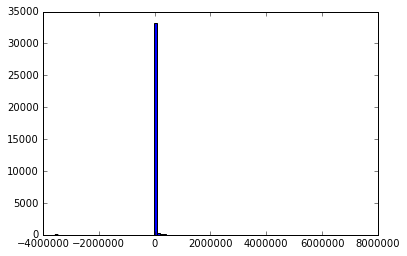

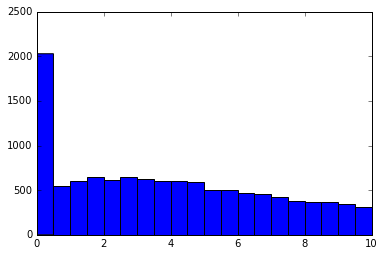

13666


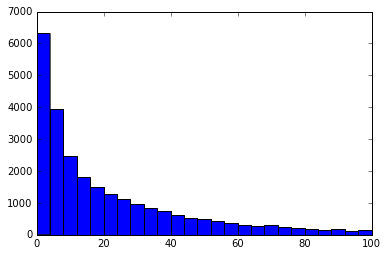

27609


In [106]:
plt.hist(chi_sqrds_cand, bins=100)
plt.show()


a = np.array(chi_sqrds_cand)
b = a[a < 10]
plt.hist(b, bins=20, range=(0,10))
plt.show()
print(len(b))



a = np.array(chi_sqrds_cand)
b = a[a < 100]
plt.hist(b, bins=25, range=(0,100))
plt.show()
print(len(b))

In [111]:
print(errors)
print(len(chi_sqrds_cand))
print(len(candidates_copy))

17518
33862
51380


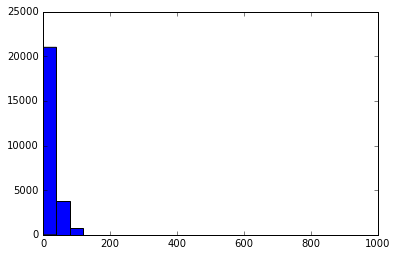

27609


In [108]:
a = np.array(chi_sqrds_cand)
b = a[a < 100]
plt.hist(b, bins=25, range=(0,1000))
plt.show()
print(len(b))

In [166]:
len(matches_sc)

76